In [19]:
import pandas as pd
import numpy as np
import re
import plotly.express as px
from plotly.subplots import make_subplots
import plotly.graph_objects as go
from functools import reduce

In [21]:
# ── Configuration ──────────────────────────────────────────────────────────
injection_scenarios = ["max_co2_injection", "min_co2_injection"]
injection_label_map = {
    "max_co2_injection": "Max CO2 Injection",
    "min_co2_injection": "Min CO2 Injection",
}
injection_short_map = {
    "max_co2_injection": "Max",
    "min_co2_injection": "Min",
}

cases = ["results_period_1", "results_period_2", "results_period_3", "results_period_4"]

# ── Load flow and capacity data for both injection scenarios ────────────────
all_flow_dfs = {}
all_capacity_dfs = {}

for inj in injection_scenarios:
    all_flow_dfs[inj] = {}
    all_capacity_dfs[inj] = {}
    for case in cases:
        flows = pd.read_csv(f"{inj}/{case}/flows.csv")
        all_flow_dfs[inj][case] = flows

        capacity = pd.read_csv(f"{inj}/{case}/capacity.csv")
        capacity["region_name"] = (
            capacity["resource_id"].astype(str)
            .str.extract(r"Region\d+([A-Za-z]+)", expand=False)
        )
        all_capacity_dfs[inj][case] = capacity

print("Data loaded for:", injection_scenarios)

Data loaded for: ['max_co2_injection', 'min_co2_injection']


In [22]:
def get_flow_sums_by_tech(
    flow_df,
    include_keywords=None,
    drop_techs=None
):
    """Build a Region × Technology CO₂ emissions table."""

    if include_keywords is not None:
        co2_cols = [
            c for c in flow_df.columns
            if any(kw in c for kw in include_keywords)
        ]
    else:
        co2_cols = [
            c for c in flow_df.columns
            if "co2" in c.lower() and "edge" in c.lower()
        ]

    def region_sort_key(name):
        match = re.search(r"Region(\d+)", name)
        return int(match.group(1)) if match else 999

    co2_cols = sorted(co2_cols, key=region_sort_key)
    co2_sums = flow_df[co2_cols].sum()

    full_pattern = re.compile(r"Region\d+([A-Za-z]+)_(.*)")
    rows = []
    for col, val in co2_sums.items():
        m = full_pattern.search(col)
        if m:
            rows.append({"Region": m.group(1), "Technology": m.group(2), "Value": val})

    df = pd.DataFrame(rows)
    co2_by_region_tech = df.pivot_table(
        index="Region",
        columns="Technology",
        values="Value",
        aggfunc="sum"
    )
    co2_by_region_tech = co2_by_region_tech[
        sorted(co2_by_region_tech.columns, key=lambda x: x.lower())
    ]

    if drop_techs is not None:
        existing = [t for t in drop_techs if t in co2_by_region_tech.columns]
        co2_by_region_tech = co2_by_region_tech.drop(columns=existing)

    return co2_by_region_tech

In [23]:
scenario_map = {
    "noemissionscap": "No Emissions Policy",
    "30pct": "30% Emissions Reduction",
    "60pct": "60% Emissions Reduction",
    "80pct": "80% Emissions Reduction",
}

tech_name_map = {
    "oxyfuelcement_retrofit_co2_emissions_edge": "Oxyfuel Cement Retrofit",
    "meacement_co2_emissions_edge": "MEA Cement Retrofit",
    "tradcement_co2_emissions_edge": "Traditional Cement",
    "bfbof_co2_edge": "BF-BOF",
    "bfbofccs_co2_edge": "BF-BOF-CCS",
    "bfbofccs_retrofit_co2_edge": "BF-BOF-CCS Retrofit",
    "scrapeaf56_co2_edge": "Scrap EAF 56%",
    "scrapeaf100_co2_edge": "Scrap EAF 100%",
    "scrapeaf100_retrofit_co2_edge": "Scrap EAF 100% Retrofit",
    "drieaf_co2_edge": "DRI-EAF",
    "drieaf_retrofit_co2_edge": "DRI-EAF Retrofit",
    "gasdri_co2_edge": "Gas DRI",
    "gasdriccs_co2_edge": "Gas DRI with CCS",
    "h2dri_co2_edge": "H2 DRI",
    "aluminum_smelting_co2_edge": "Aluminum Smelting",
    "coal_co2_edge": "Coal Power",
    "naturalgas_power_co2_edge": "Natural Gas Power",
}

custom_color_map = {
    "Oxyfuel Cement Retrofit": "#ff9d9a",
    "MEA Cement Retrofit": "#f28e9b",
    "Traditional Cement": "#e15759",
    "BF-BOF": "#1f77b4",
    "BF-BOF-CCS": "#0ee3ff",
    "BF-BOF-CCS Retrofit": "#aec7e8",
    "Scrap EAF 56%": "#38a938",
    "Scrap EAF 100%": "#6acaa2",
    "Scrap EAF 100% Retrofit": "#98df8a",
    "DRI-EAF": "#9467bd",
    "DRI-EAF Retrofit": "#c5b0d5",
    "Gas DRI": "#8c564b",
    "Gas DRI with CCS": "#e377c2",
    "H2 DRI": "#17becf",
    "Aluminum Smelting": "#bbbbb2",
    "Natural Gas Power": "#eb7a23",
    "Coal Power": "#4a5568",
    "Hydropower": "#3e6496",
    "Solar PV (Centralized)": "#fbb04e",
    "Solar PV (Distributed)": "#f1ce63",
    "Wind (Offshore)": "#638fbb",
    "Wind (Onshore)": "#90bfe2",
    "Battery Storage": "#9f6490",
    "Nuclear": "#3c8782",
    "Pumped Hydro Storage": "#75afa7",
}

In [24]:
# ── Build combined CO2 national summaries ───────────────────────────────────
# combined_co2_by_tech: Technology × (case__injection) DataFrame
# combined_scenario_map: maps column keys to display labels

combined_co2_by_tech = pd.DataFrame()
combined_scenario_map = {}

for inj in injection_scenarios:
    inj_short = injection_short_map[inj]
    for case in cases:
        col_key = f"{case}__{inj}"
        data = get_flow_sums_by_tech(
            all_flow_dfs[inj][case],
            include_keywords=["co2_edge", "co2_emissions_edge"],
            drop_techs=["nuclear_co2_edge", "oxyfuelcement_co2_emissions_edge"]
        ).sum()
        combined_co2_by_tech[col_key] = data
        combined_scenario_map[col_key] = f"{scenario_map[case]} ({inj_short})"

combined_co2_by_tech

KeyError: 'results_period_1'

In [25]:
def plot_stacked_bar(
    df,
    scenario_map=None,
    name_map=None,
    color_map=None,
    title_name="none",
    xaxis_name="none",
    yaxis_name="none",
    width=1200,
    height=600,
    ylim=None,
):
    if scenario_map:
        df = df.rename(index=scenario_map)

    df = df.T

    if not df.index.name:
        df = df.copy()
        df.index.name = "Category"

    row_label = df.index.name

    df_long = df.reset_index().melt(
        id_vars=row_label,
        var_name="Scenario",
        value_name="Value"
    )

    display_col = row_label + "_Display"

    if name_map:
        df_long[display_col] = df_long[row_label].map(lambda x: name_map.get(x, x))
    else:
        df_long[display_col] = df_long[row_label]

    if color_map and name_map:
        color_map = {name_map.get(k, k): v for k, v in color_map.items()}

    fig = px.bar(
        df_long,
        x="Scenario",
        y="Value",
        color=display_col,
        title=None if title_name == "none" else title_name,
        labels={
            "Scenario": xaxis_name if xaxis_name != "none" else "Scenario",
            "Value": yaxis_name if yaxis_name != "none" else "Value",
            display_col: row_label
        },
        color_discrete_map=color_map,
    )

    fig.update_layout(
        barmode="stack",
        template="plotly_white",
        width=width,
        height=height,
        margin=dict(l=60, r=60, t=80, b=80),
        legend=dict(traceorder="reversed")
    )

    fig.update_xaxes(tickangle=-45)

    if ylim is not None:
        fig.update_yaxes(range=ylim)

    return fig

In [26]:
def plot_scenario_subplots(
    co2_dict,
    scenario_map,
    name_map=None,
    color_map=None,
    ymax=30e6,
    ncols=None,
    title_prefix="",
    xaxis_name="none",
    yaxis_name="none",
    width=2500
):
    keys = list(co2_dict.keys())
    n = len(keys)

    if ncols is None:
        ncols = n

    fig = make_subplots(
        rows=1,
        cols=ncols,
        subplot_titles=[f"{title_prefix}{scenario_map[k]}" for k in keys],
        horizontal_spacing=0.05,
    )

    for col_idx, key in enumerate(keys, start=1):
        df = co2_dict[key]

        subfig = plot_stacked_bar(
            df,
            scenario_map=scenario_map,
            name_map=name_map,
            color_map=color_map,
            title_name="none",
            xaxis_name="none",
            yaxis_name="none"
        )

        for trace in subfig.data:
            trace.showlegend = (col_idx == 1)
            fig.add_trace(trace, row=1, col=col_idx)

        fig.update_yaxes(range=[0, ymax], row=1, col=col_idx)

    if yaxis_name != "none":
        fig.update_yaxes(title_text=yaxis_name, row=1, col=1)

    if xaxis_name != "none":
        for col_idx in range(1, ncols + 1):
            fig.update_xaxes(title_text=xaxis_name, row=1, col=col_idx)

    fig.update_layout(
        template="plotly_white",
        barmode="stack",
        height=650,
        width=width,
        legend_title="Category",
        margin=dict(l=40, r=40, t=80, b=80),
        legend=dict(traceorder="reversed")
    )

    fig.update_xaxes(tickangle=-45)

    return fig

# CO2 Emissions

In [27]:
# Per-injection-scenario CO2 subplots for easy side-by-side comparison
for inj in injection_scenarios:
    inj_label = injection_label_map[inj]
    co2_data = pd.DataFrame()
    for case in cases:
        co2_data[case] = get_flow_sums_by_tech(
            all_flow_dfs[inj][case],
            include_keywords=["co2_edge", "co2_emissions_edge"],
            drop_techs=["nuclear_co2_edge", "oxyfuelcement_co2_emissions_edge"]
        ).sum()
    fig = plot_stacked_bar(
        df=co2_data.T,
        scenario_map=scenario_map,
        name_map=tech_name_map,
        color_map=custom_color_map,
        title_name=f"National CO2 Emissions — {inj_label}",
        xaxis_name="Emissions Scenario",
        yaxis_name="National CO2 Emissions (Tonnes)",
        width=700
    )
    fig.show()

# Capacity Analysis

In [28]:
def get_capacity_by_sector(capacity_dfs, cases):
    """
    Extract capacity dataframes for electricity, cement, steel, aluminum, and DRI-making.
    Returns 10 dicts: (total, existing) × 5 sectors.
    """

    def _extract_by_suffix(df, suffix_to_display, col="capacity"):
        tmp = df[["region_name", "resource_id", col]].copy()

        def match(rid):
            for suf, name in suffix_to_display.items():
                # keys starting with "_" use endswith; others use "in" (e.g. aluminum prefix)
                if suf.startswith("_") and str(rid).endswith(suf):
                    return name
                elif not suf.startswith("_") and suf in str(rid):
                    return name
            return None

        tmp["tech"] = tmp["resource_id"].map(match)
        tmp = tmp[tmp["tech"].notna()]
        result = (
            tmp.groupby(["region_name", "tech"], as_index=False)[col].sum()
            .pivot(index="region_name", columns="tech", values=col)
            .fillna(0)
            .reindex(columns=list(suffix_to_display.values()))
            .fillna(0)  # fill NaN introduced by reindex for techs absent in this case
        )
        result.columns.name = None
        return result

    _elec_rename = {
        "Coal":                   "Coal Power",
        "Hydropower":             "Hydropower",
        "utility_scale_solar_pv": "Solar PV (Centralized)",
        "distributed_solar_pv":   "Solar PV (Distributed)",
        "offshore_wind":          "Wind (Offshore)",
        "onshore_wind":           "Wind (Onshore)",
        "battery":                "Battery Storage",
        "NaturalGasPower":        "Natural Gas Power",
        "Nuclear":                "Nuclear",
        "pumpedhydro":            "Pumped Hydro Storage",
        "BiomassPower":           "Biomass Power",
        "CoalPowerCCS":           "Coal Power CCS",
        "GasPowerCCS":            "Gas Power CCS",
    }
    _elec_techs = set(_elec_rename.keys())

    _cement_suffixes = {
        "_tradcement":    "Traditional Cement",
        "_oxyfuelcement": "Oxyfuel Cement Retrofit",
        "_meacement":     "MEA Cement Retrofit",
    }
    _steel_suffixes = {
        "_bfbof":                  "BF-BOF",
        "_bfbofccs_retrofit":      "BF-BOF-CCS Retrofit",
        "_bfbofccs":               "BF-BOF-CCS",
        "_scrapeaf56":             "Scrap EAF 56%",
        "_scrapeaf100_retrofit":   "Scrap EAF 100% Retrofit",
        "_scrapeaf100":            "Scrap EAF 100%",
        "_drieaf_retrofit":        "DRI-EAF Retrofit",
        "_drieaf":                 "DRI-EAF",
    }
    _aluminum_suffixes = {"aluminum_smelting": "Aluminum Smelting"}
    _dri_suffixes = {
        "_gasdri":    "Gas DRI",
        "_gasdriccs": "Gas DRI with CCS",
        "_h2dri":     "H2 DRI",
    }

    (elec_dict, cement_dict, steel_dict, aluminum_dict, dri_dict,
     elec_ex_dict, cement_ex_dict, steel_ex_dict, aluminum_ex_dict, dri_ex_dict) = (
        {}, {}, {}, {}, {}, {}, {}, {}, {}, {}
    )

    for case in cases:
        df = capacity_dfs[case]

        # ── Filter electricity rows ──────────────────────────────────────────
        df_e = df.copy()
        df_e["technology"] = df_e["resource_id"].str.split("_", n=1).str[1]
        df_e = df_e[df_e["technology"].isin(_elec_techs)]
        df_e = df_e[~df_e["component_id"].str.endswith("inflow_edge")]
        df_e = df_e[~df_e["component_id"].str.contains("storage", na=False)]
        df_e = df_e[~df_e["component_id"].str.endswith("charge_edge")]

        # Total electricity capacity
        elec_df = (
            df_e.pivot(index="region_name", columns="technology", values="capacity")
            .rename(columns=_elec_rename)
        )
        elec_df.columns.name = None
        elec_dict[case] = elec_df

        # Existing electricity capacity
        elec_ex_df = (
            df_e.pivot(index="region_name", columns="technology", values="existing_capacity")
            .fillna(0)
            .rename(columns=_elec_rename)
        )
        elec_ex_df.columns.name = None
        elec_ex_dict[case] = elec_ex_df

        # ── Sector total capacity ────────────────────────────────────────────
        cement_dict[case]   = _extract_by_suffix(df, _cement_suffixes)
        steel_dict[case]    = _extract_by_suffix(df, _steel_suffixes)
        aluminum_dict[case] = _extract_by_suffix(df, _aluminum_suffixes)
        dri_dict[case]      = _extract_by_suffix(df, _dri_suffixes)

        # ── Sector existing capacity ─────────────────────────────────────────
        cement_ex_dict[case]   = _extract_by_suffix(df, _cement_suffixes,   col="existing_capacity")
        steel_ex_dict[case]    = _extract_by_suffix(df, _steel_suffixes,    col="existing_capacity")
        aluminum_ex_dict[case] = _extract_by_suffix(df, _aluminum_suffixes, col="existing_capacity")
        dri_ex_dict[case]      = _extract_by_suffix(df, _dri_suffixes,      col="existing_capacity")

    return (elec_dict, cement_dict, steel_dict, aluminum_dict, dri_dict,
            elec_ex_dict, cement_ex_dict, steel_ex_dict, aluminum_ex_dict, dri_ex_dict)


def consolidate_capacity(sector_dict):
    """National totals: Technology × case DataFrame."""
    return pd.DataFrame(
        {case: df.sum() for case, df in sector_dict.items()}
    )


def build_combined_capacity(sector_dfs_by_inj):
    """
    Merge two injection-scenario capacity dicts into a single Technology × column
    DataFrame, where each column is labeled "case__injection", plus a combined
    scenario_map for display.
    """
    combined = pd.DataFrame()
    smap = {}
    for inj in injection_scenarios:
        inj_short = injection_short_map[inj]
        for case in cases:
            col_key = f"{case}__{inj}"
            combined[col_key] = sector_dfs_by_inj[inj][case].sum()
            smap[col_key] = f"{scenario_map[case]} ({inj_short})"
    return combined, smap


In [29]:
# Extract sector capacity dicts for both injection scenarios
all_elec_dfs      = {}
all_cement_dfs    = {}
all_steel_dfs     = {}
all_aluminum_dfs  = {}
all_dri_dfs       = {}

all_elec_ex_dfs     = {}
all_cement_ex_dfs   = {}
all_steel_ex_dfs    = {}
all_aluminum_ex_dfs = {}
all_dri_ex_dfs      = {}

for inj in injection_scenarios:
    (e, ce, st, al, dr,
     e_ex, ce_ex, st_ex, al_ex, dr_ex) = get_capacity_by_sector(all_capacity_dfs[inj], cases)

    all_elec_dfs[inj]     = e
    all_cement_dfs[inj]   = ce
    all_steel_dfs[inj]    = st
    all_aluminum_dfs[inj] = al
    all_dri_dfs[inj]      = dr

    all_elec_ex_dfs[inj]     = e_ex
    all_cement_ex_dfs[inj]   = ce_ex
    all_steel_ex_dfs[inj]    = st_ex
    all_aluminum_ex_dfs[inj] = al_ex
    all_dri_ex_dfs[inj]      = dr_ex

# Convert industrial capacity from Tonnes/Hour (rate) to MT/year
# Capacity is a rate, so multiply by 8760 h/year and divide by 1e6 for MT
ANNUAL_SCALE = 8760 / 1e6
for inj in injection_scenarios:
    for case in cases:
        for d in [all_steel_dfs, all_cement_dfs, all_aluminum_dfs, all_dri_dfs,
                  all_steel_ex_dfs, all_cement_ex_dfs, all_aluminum_ex_dfs, all_dri_ex_dfs]:
            d[inj][case] = d[inj][case] * ANNUAL_SCALE

print("Capacity data extracted.")

Capacity data extracted.


In [30]:
# Electricity capacity — combined 8-bar chart
combined_elec, combined_elec_smap = build_combined_capacity(all_elec_dfs)

plot_stacked_bar(
    combined_elec.T,
    scenario_map=combined_elec_smap,
    name_map=tech_name_map,
    color_map=custom_color_map,
    title_name="Electricity Capacity — Max vs. Min CO2 Injection",
    xaxis_name="Emissions Scenario",
    yaxis_name="National Electricity Capacity (MW)",
    width=1200
)

KeyError: 'results_period_1'

In [ ]:
# Steel capacity — combined 8-bar chart
combined_steel, combined_steel_smap = build_combined_capacity(all_steel_dfs)

plot_stacked_bar(
    combined_steel.T,
    scenario_map=combined_steel_smap,
    name_map=tech_name_map,
    color_map=custom_color_map,
    title_name="Steel Capacity — Max vs. Min CO2 Injection",
    xaxis_name="Emissions Scenario",
    yaxis_name="National Steel Production Capacity (MT / year)",
    width=1200
)

In [31]:
# Cement capacity — combined 8-bar chart
combined_cement, combined_cement_smap = build_combined_capacity(all_cement_dfs)

plot_stacked_bar(
    combined_cement.T,
    scenario_map=combined_cement_smap,
    name_map=tech_name_map,
    color_map=custom_color_map,
    title_name="Cement Capacity — Max vs. Min CO2 Injection",
    xaxis_name="Emissions Scenario",
    yaxis_name="National Cement Production Capacity (MT / year)",
    width=1200
)

KeyError: 'results_period_1'

In [32]:
# Aluminum capacity — combined 8-bar chart
combined_aluminum, combined_aluminum_smap = build_combined_capacity(all_aluminum_dfs)

plot_stacked_bar(
    combined_aluminum.T,
    scenario_map=combined_aluminum_smap,
    name_map=tech_name_map,
    color_map=custom_color_map,
    title_name="Aluminum Capacity — Max vs. Min CO2 Injection",
    xaxis_name="Emissions Scenario",
    yaxis_name="National Aluminum Production Capacity (MT / year)",
    width=1200
)

KeyError: 'results_period_1'

In [33]:
# DRI capacity — combined 8-bar chart
combined_dri, combined_dri_smap = build_combined_capacity(all_dri_dfs)

plot_stacked_bar(
    combined_dri.T,
    scenario_map=combined_dri_smap,
    name_map=tech_name_map,
    color_map=custom_color_map,
    title_name="DRI-Making Capacity — Max vs. Min CO2 Injection",
    xaxis_name="Emissions Scenario",
    yaxis_name="National DRI Capacity (MT / year)",
    width=1200
)

KeyError: 'results_period_1'

# Pie Charts

In [526]:
import geopandas as gpd
import matplotlib.pyplot as plt
from matplotlib.patches import Wedge, Circle

def plot_province_pies(
    gdf,
    data_df,
    province_col="NAME_1",
    categories=None,
    colors=None,
    pie_scale=1.0,
    figsize=(14, 10),
    dpi=150,
    title="",
    legend_sizes=None,
    capacity_unit="MW",
    max_total_override=None,
    ax=None,
):
    if categories is None:
        categories = list(data_df.columns)

    if colors is None:
        cmap = plt.cm.tab20
        colors = {cat: cmap(i) for i, cat in enumerate(categories)}

    gdf_proj = gdf.to_crs(epsg=3857)
    gdf_proj = gdf_proj.merge(data_df, left_on=province_col, right_index=True, how="left")
    gdf_proj[categories] = gdf_proj[categories].fillna(0)

    gdf_proj["centroid"] = gdf_proj.geometry.centroid
    gdf_proj["cx"] = gdf_proj.centroid.x
    gdf_proj["cy"] = gdf_proj.centroid.y

    gdf_proj["total_value"] = gdf_proj[categories].sum(axis=1)
    max_total = max_total_override if max_total_override is not None else (gdf_proj["total_value"].max() or 1)
    gdf_proj["radius"] = (gdf_proj["total_value"] / max_total) * pie_scale * 80_000

    _own_fig = ax is None
    if _own_fig:
        fig, ax = plt.subplots(figsize=figsize, dpi=dpi)
    ax.set_axis_off()

    for _, row in gdf_proj.iterrows():
        cx, cy, r = row["cx"], row["cy"], row["radius"]
        vals = row[categories].values.astype(float)
        total = vals.sum()
        if total == 0:
            continue
        angles = np.cumsum(vals) / total * 360
        prev_angle = 0
        for cat, angle in zip(categories, angles):
            wedge = Wedge(
                center=(cx, cy), r=r,
                theta1=prev_angle, theta2=angle,
                facecolor=colors[cat], edgecolor="none",
                alpha=1.0, zorder=1000
            )
            ax.add_patch(wedge)
            prev_angle = angle

    gdf_proj.plot(ax=ax, color="#F4F4F4", edgecolor="none", zorder=0)
    gdf_proj.boundary.plot(ax=ax, linewidth=0.3, color="black", zorder=1)

    if legend_sizes is not None and len(legend_sizes) > 0:
        legend_radii = [(s / max_total) * pie_scale * 80_000 for s in legend_sizes]
        sizes_and_radii = sorted(zip(legend_sizes, legend_radii))
        max_r = max(legend_radii)

        xlim = ax.get_xlim()
        ylim = ax.get_ylim()
        plot_width = xlim[1] - xlim[0]
        pad_x = plot_width * 0.02
        gap = max_r * 0.5

        # Expand ylim downward to place legend below the map, never overlapping it
        strip_height = gap + sum(r * 2 + gap for _, r in sizes_and_radii)
        ax.set_ylim(ylim[0] - strip_height, ylim[1])
        ylim = ax.get_ylim()

        legend_cx = xlim[0] + pad_x + max_r
        y = ylim[0] + gap
        for size, radius in sizes_and_radii:
            cy_legend = y + radius
            circle = Circle(
                (legend_cx, cy_legend), radius,
                facecolor="white", edgecolor="#555555",
                linewidth=1.2, zorder=2000
            )
            ax.add_patch(circle)
            ax.text(
                legend_cx + max_r + pad_x * 0.6, cy_legend,
                f"{size:,.0f} {capacity_unit}",
                va="center", ha="left", fontsize=9, zorder=2001
            )
            y += radius * 2 + gap

    if _own_fig:
        plt.title(title, fontsize=18)
        plt.tight_layout()
        plt.show()
        plt.close()

    return ax

In [527]:
gdf = gpd.read_file("../gadm36_CHN_1.json")
rename_map = {
    "Nei Mongol": "Innermongolia",
    "Xizang": "Tibet",
    "Ningxia Hui": "Ningxia",
    "Xinjiang Uygur": "Xinjiang",
}
gdf["NAME_1"] = gdf["NAME_1"].replace(rename_map)

In [528]:
import math

def _nice_round_up(x):
    """Round x up to the nearest 1, 2, or 5 × 10^n."""
    if x <= 0:
        return 1
    mag = 10 ** math.floor(math.log10(x))
    for f in [1, 2, 5, 10]:
        candidate = f * mag
        if candidate >= x:
            return int(candidate)
    return int(x)

def _nice_legend_sizes(max_val):
    """Return [small, mid, top] nice legend sizes where top >= max_val."""
    top   = _nice_round_up(max_val)
    mid   = _nice_round_up(max_val * 0.5)
    small = _nice_round_up(max_val * 0.25)
    return sorted(set([small, mid, top]))

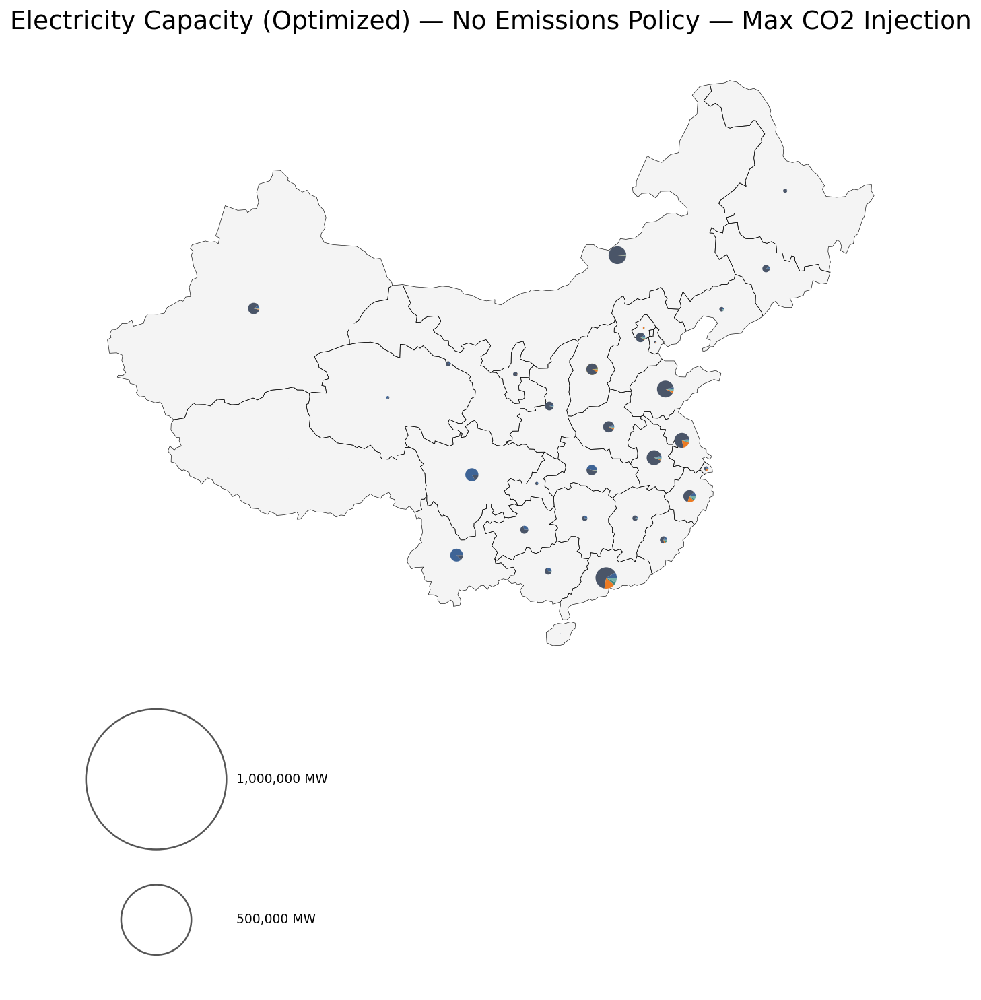

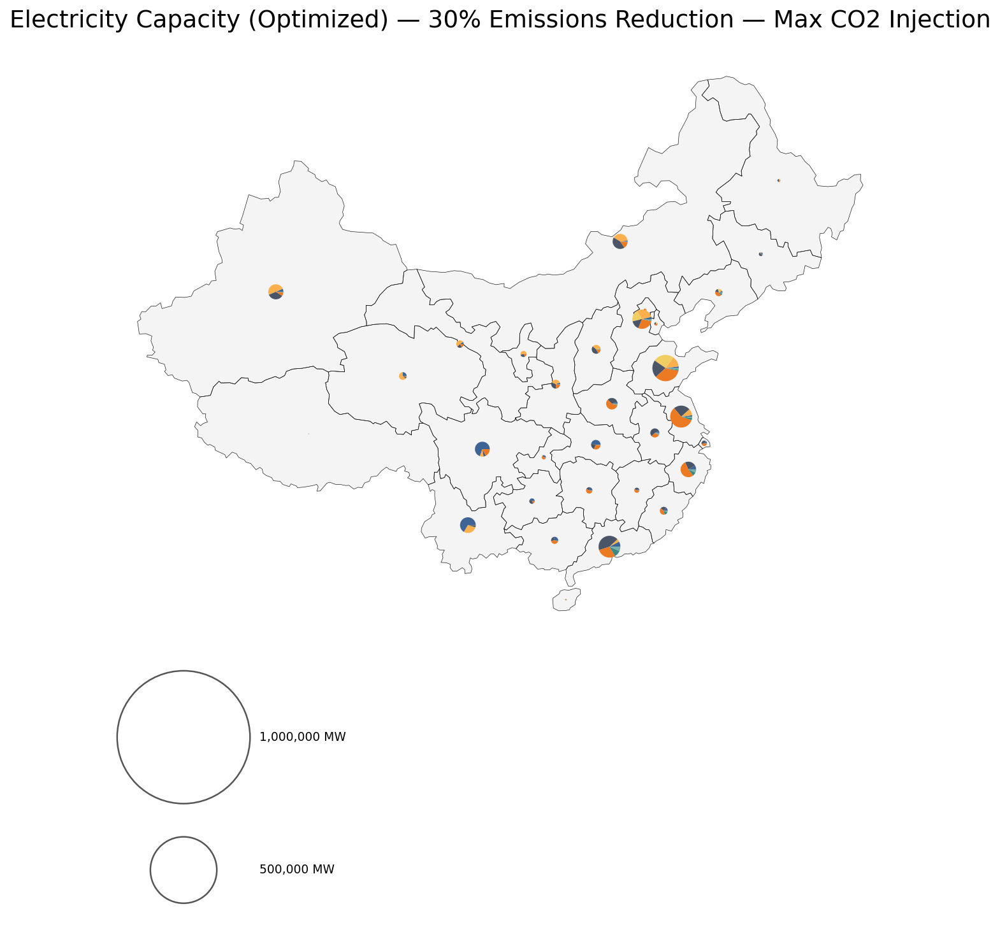

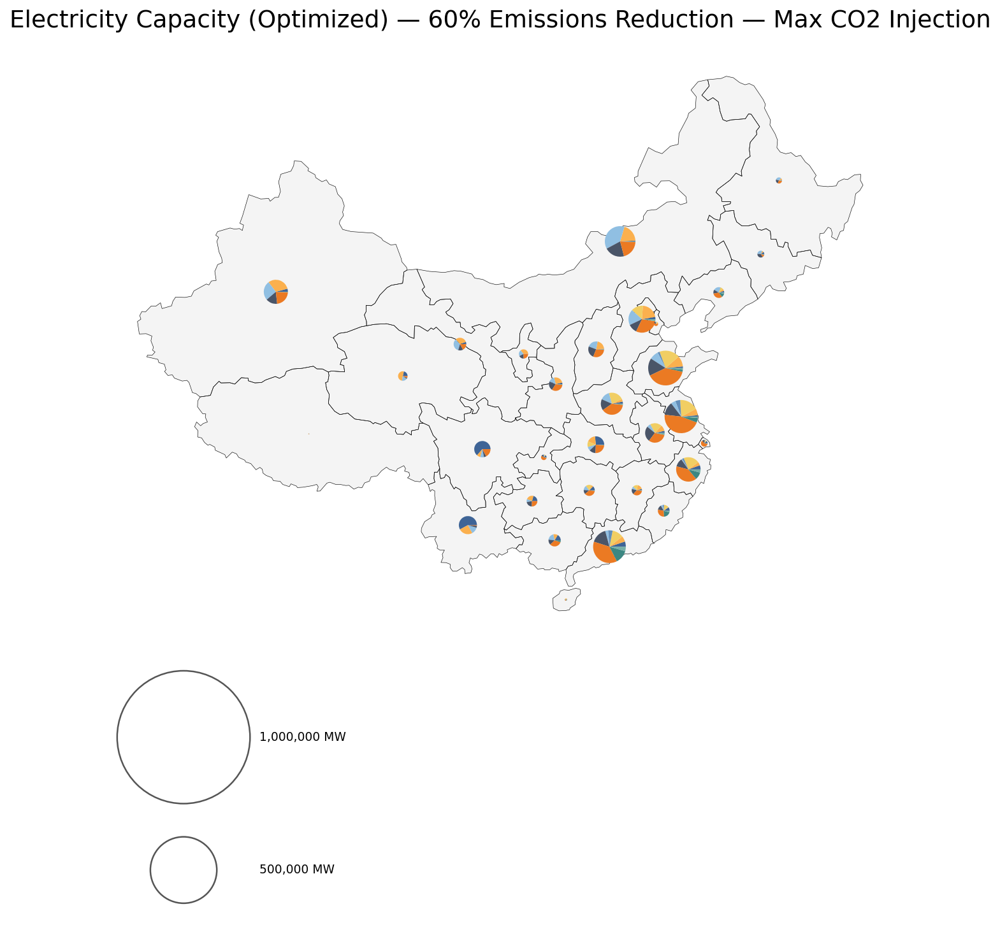

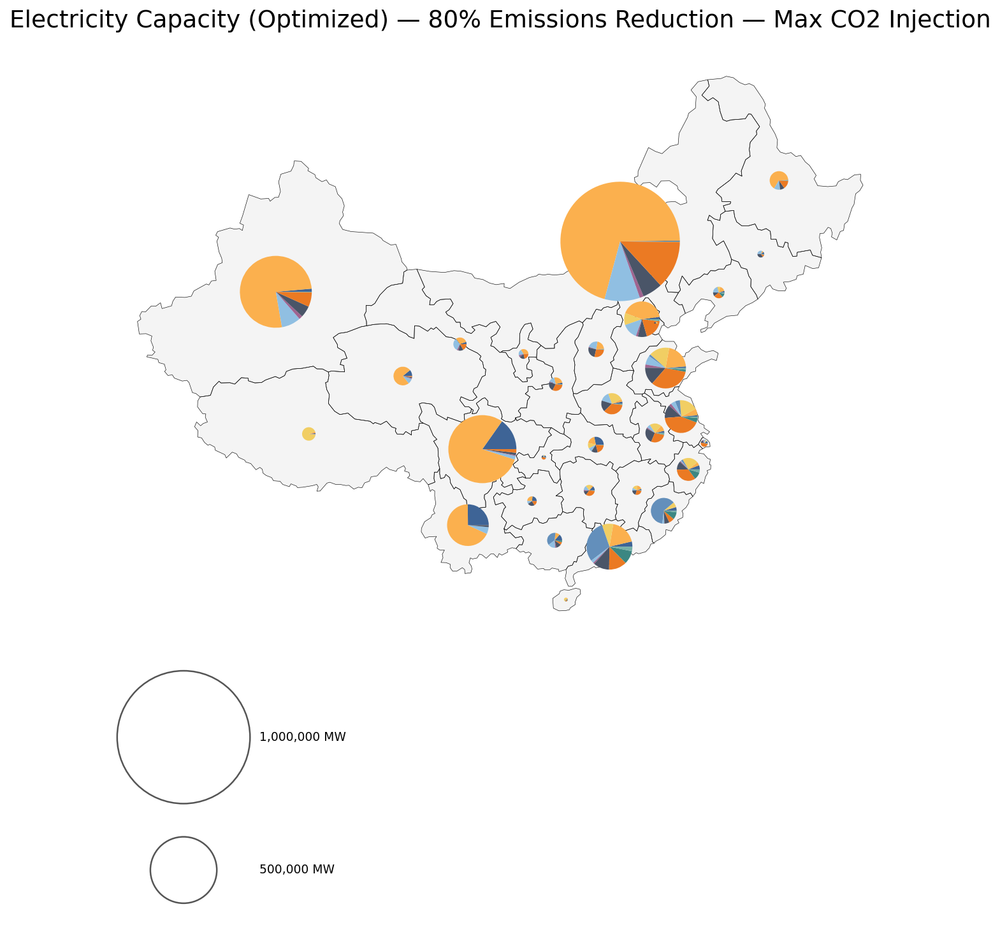

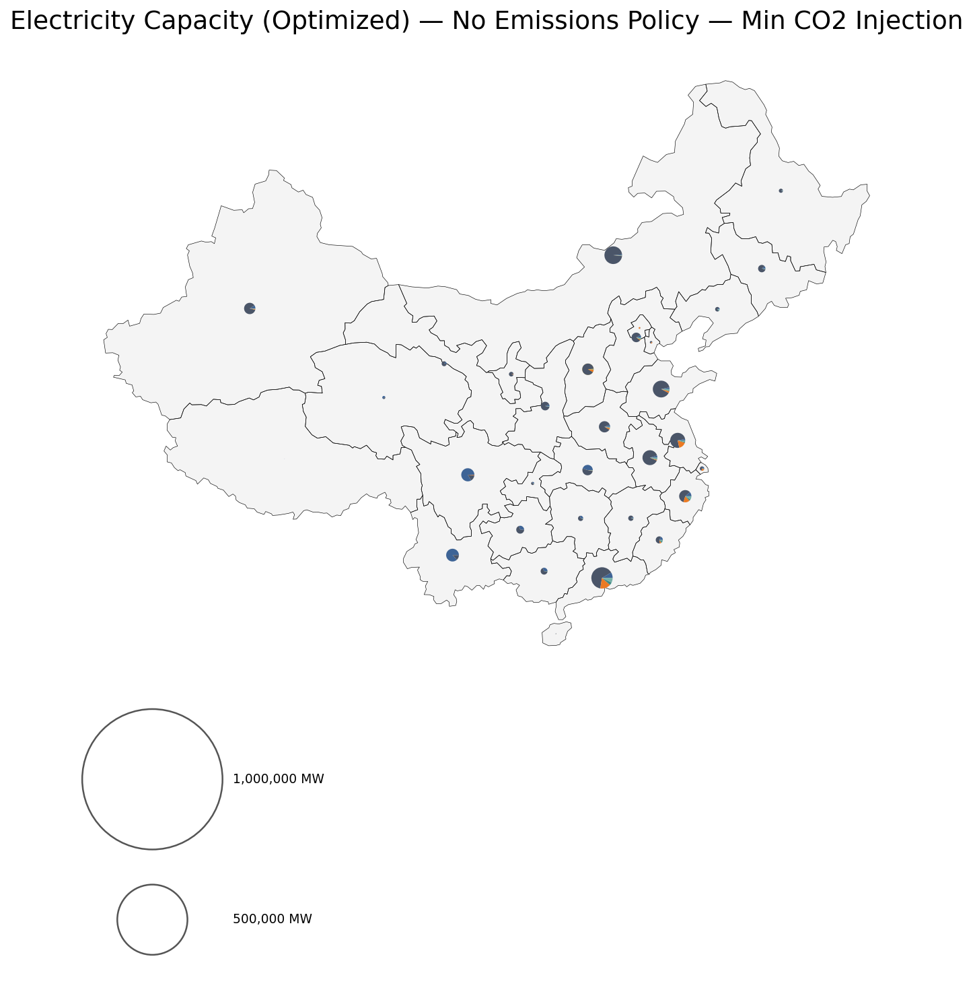

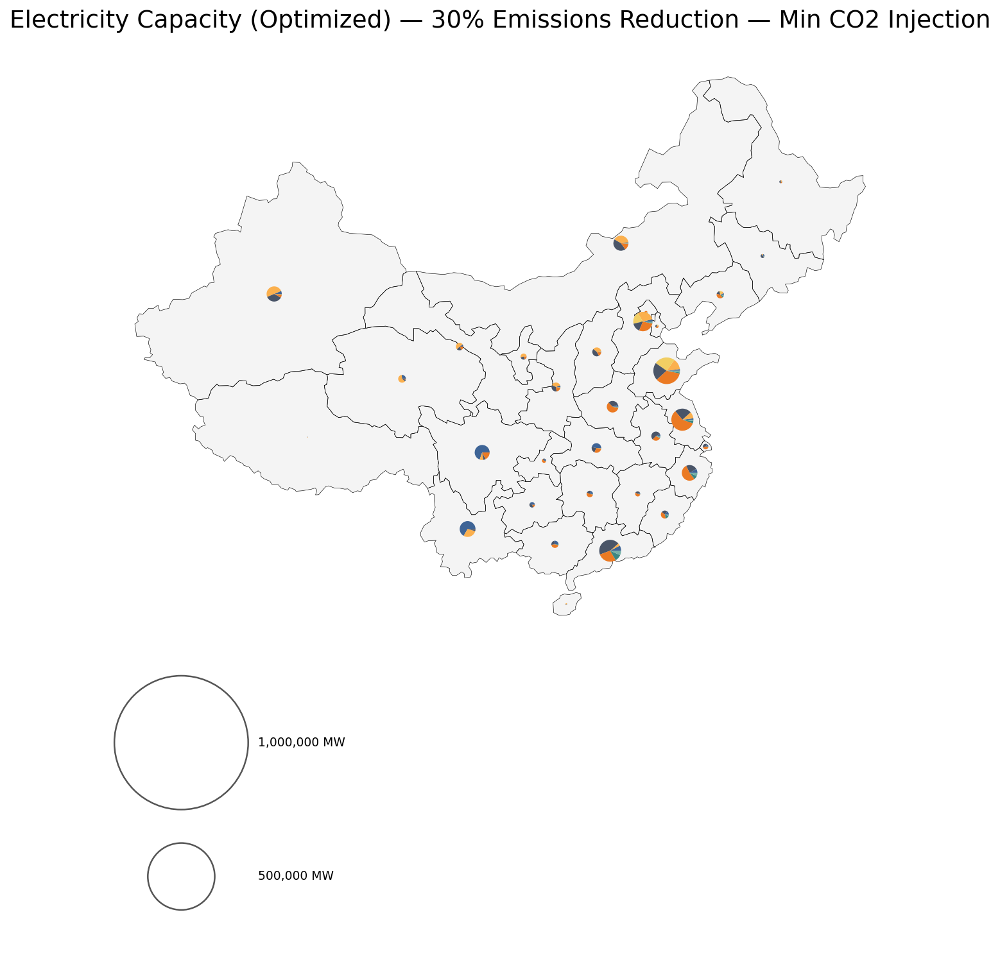

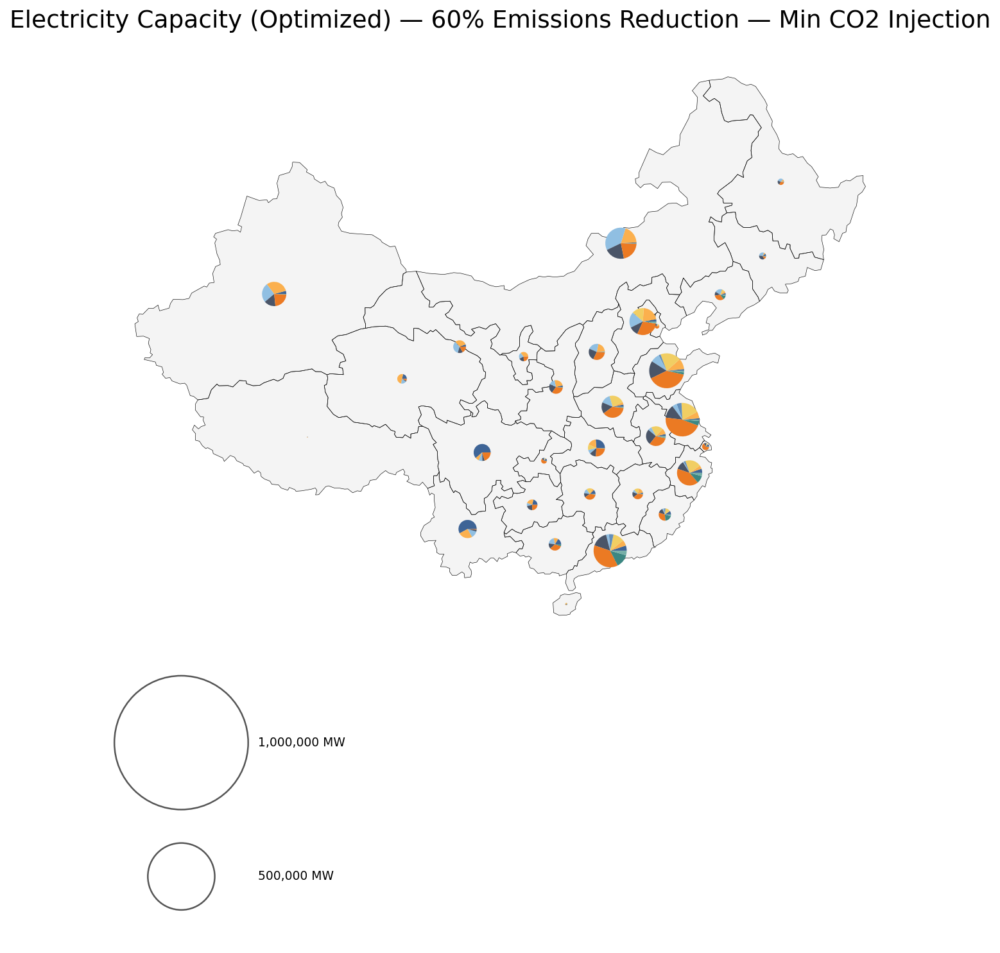

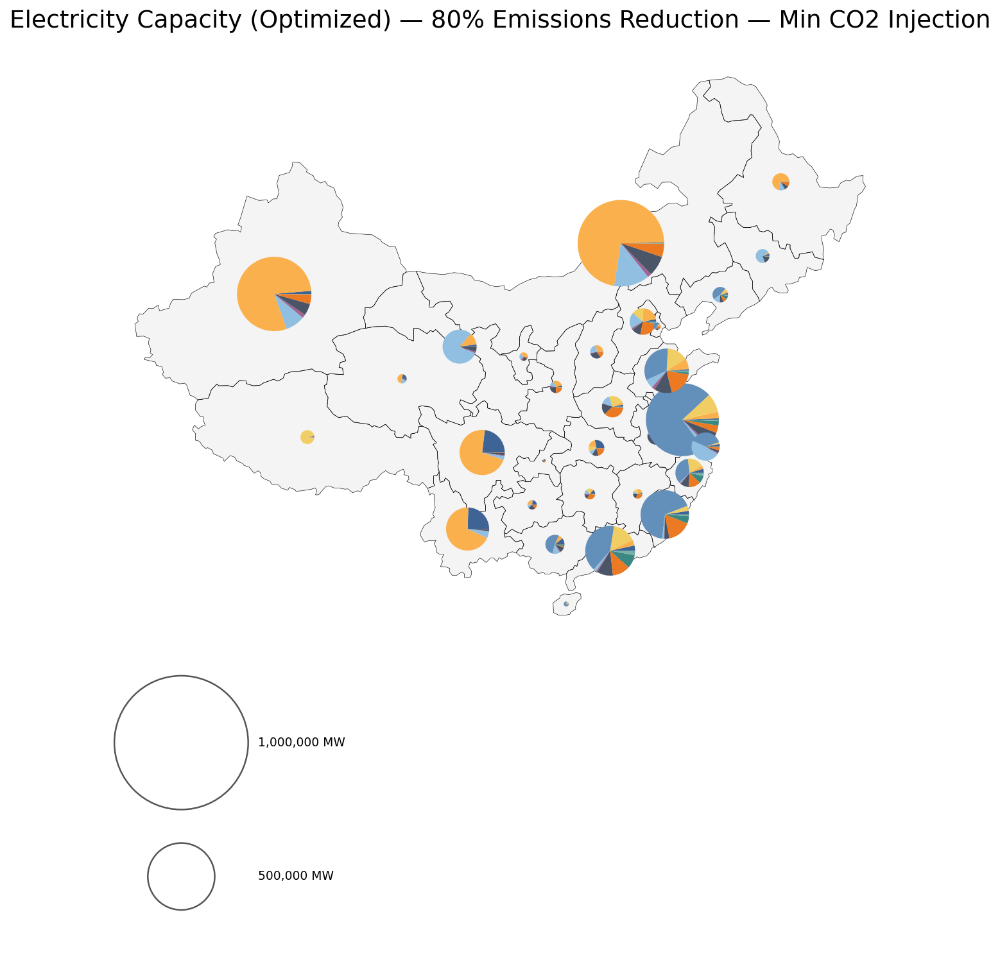

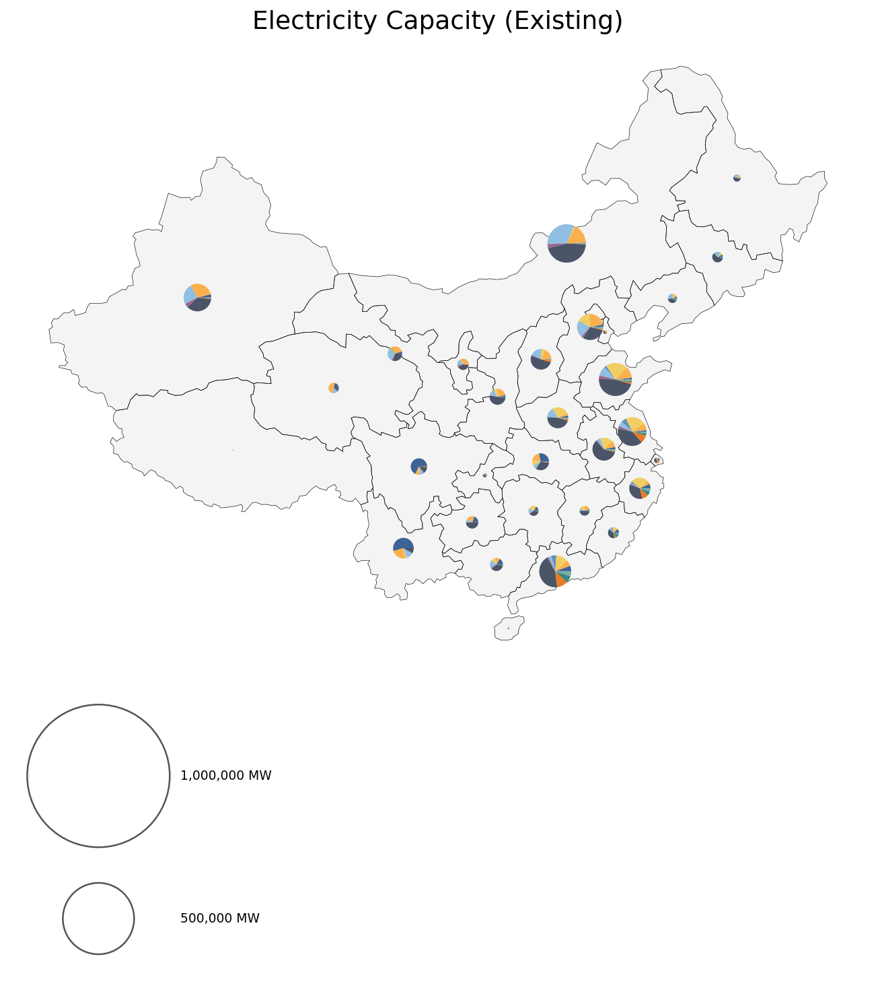

<Axes: title={'center': 'Electricity Capacity (Existing)'}>

In [555]:
# Electricity capacity pie charts
# Global max across all scenarios + existing for consistent circle scaling
sector_max = max(
    all_elec_dfs[inj][case].sum(axis=1).max()
    for inj in injection_scenarios
    for case in cases
)
sector_max = max(sector_max,
    all_elec_ex_dfs[injection_scenarios[0]][cases[0]].sum(axis=1).max(),
    1
)
legend_sizes = _nice_legend_sizes(sector_max)

# Optimized: one map per injection scenario × emission case
for inj in injection_scenarios:
    inj_label = injection_label_map[inj]
    for case in cases:
        plot_province_pies(
            gdf, all_elec_dfs[inj][case],
            colors=custom_color_map,
            pie_scale=7,
            title=f"Electricity Capacity (Optimized) — {scenario_map[case]} — {inj_label}",
            legend_sizes=legend_sizes,
            capacity_unit="MW",
            max_total_override=sector_max,
        )

# Existing: one map for the sector
plot_province_pies(
    gdf, all_elec_ex_dfs[injection_scenarios[0]][cases[0]],
    colors=custom_color_map,
    pie_scale=7,
    title="Electricity Capacity (Existing)",
    legend_sizes=legend_sizes,
    capacity_unit="MW",
    max_total_override=sector_max,
)

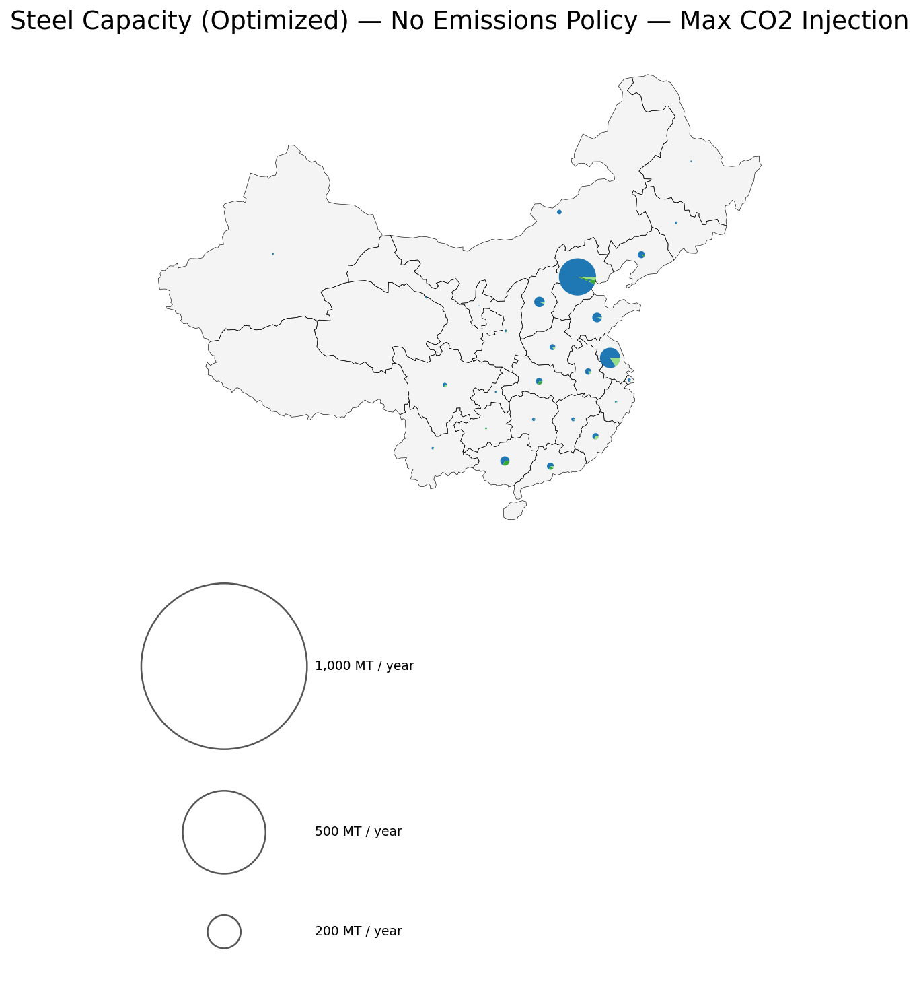

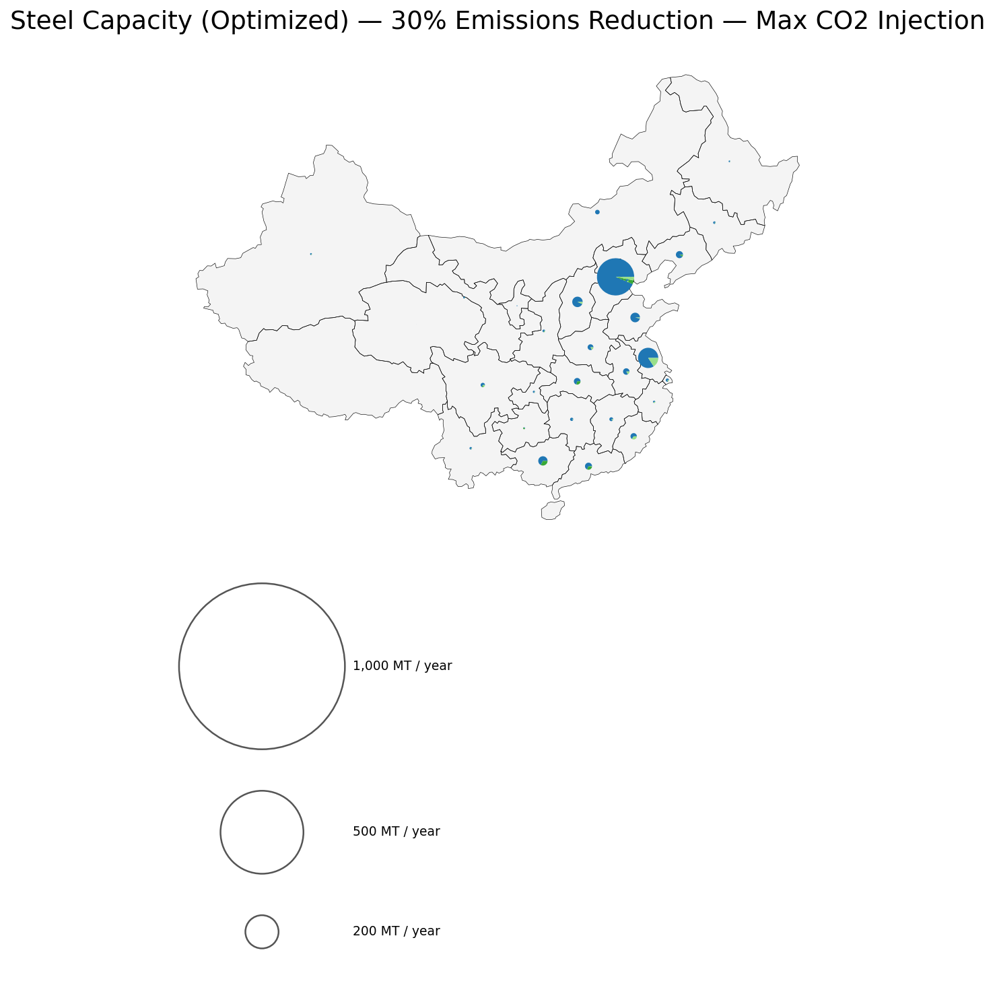

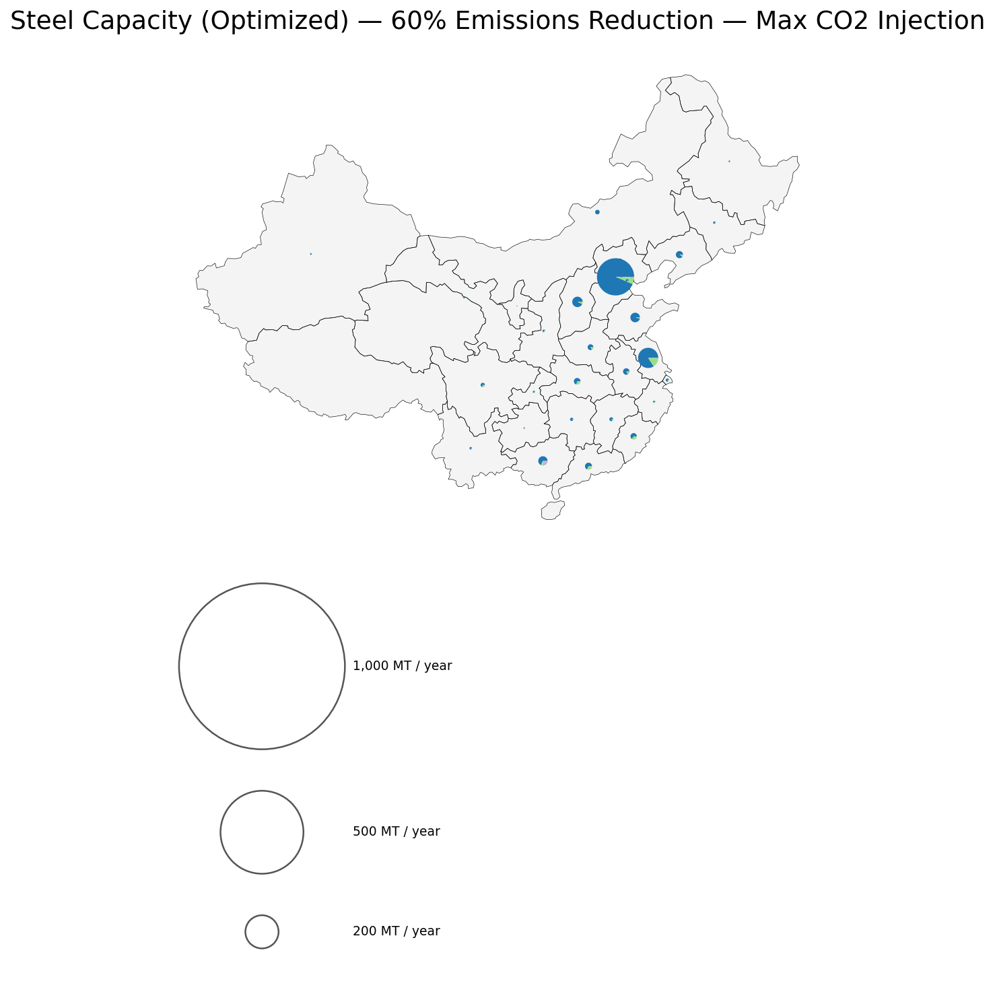

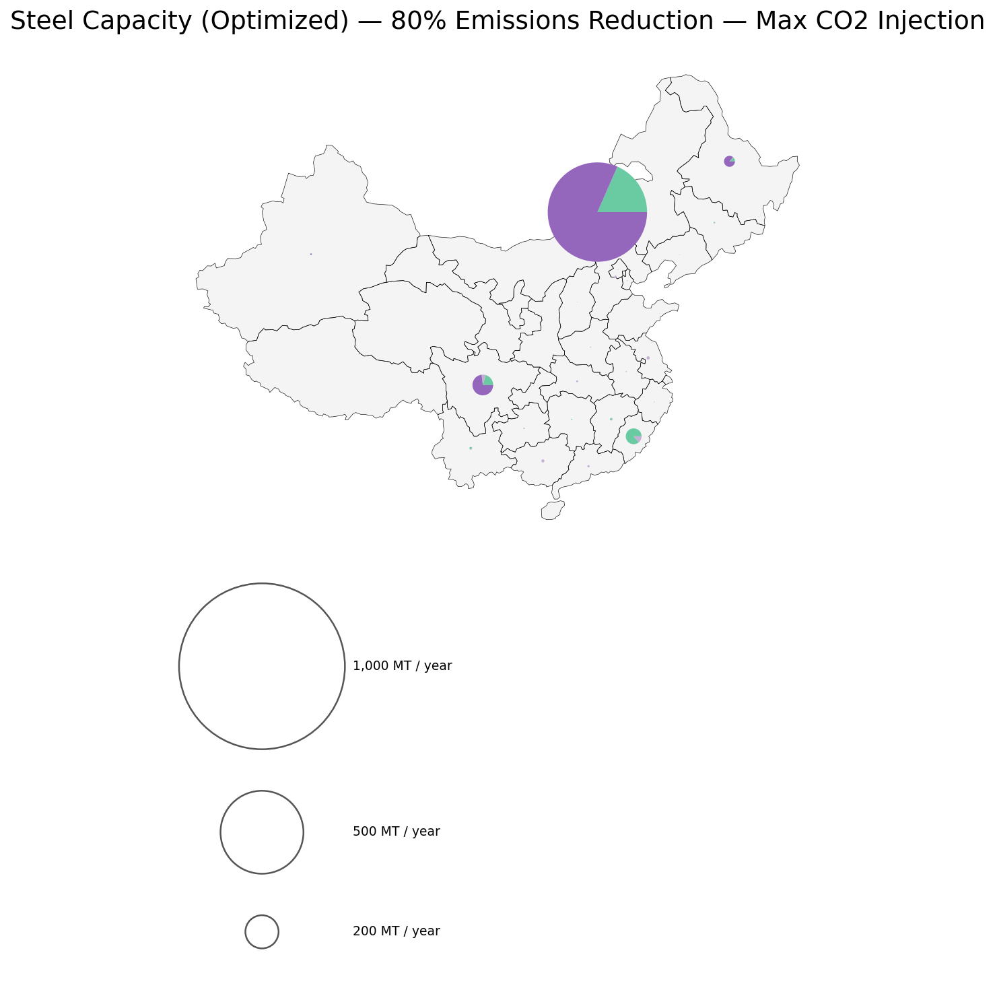

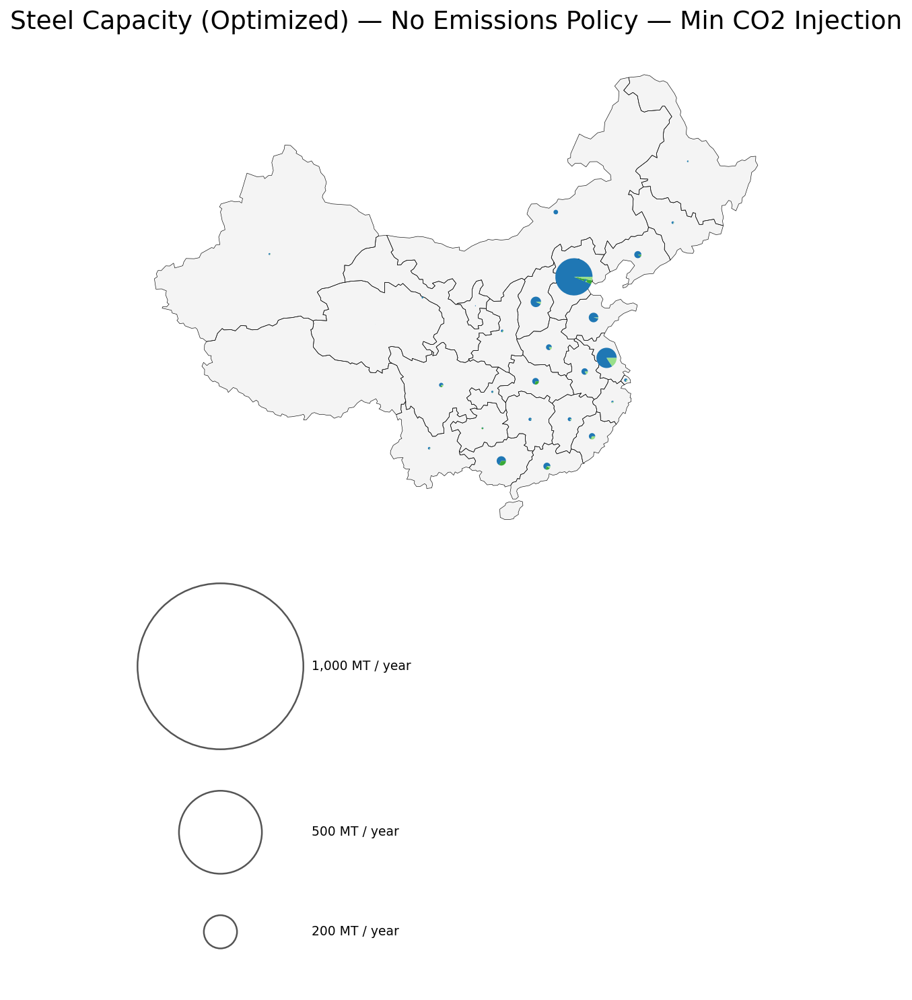

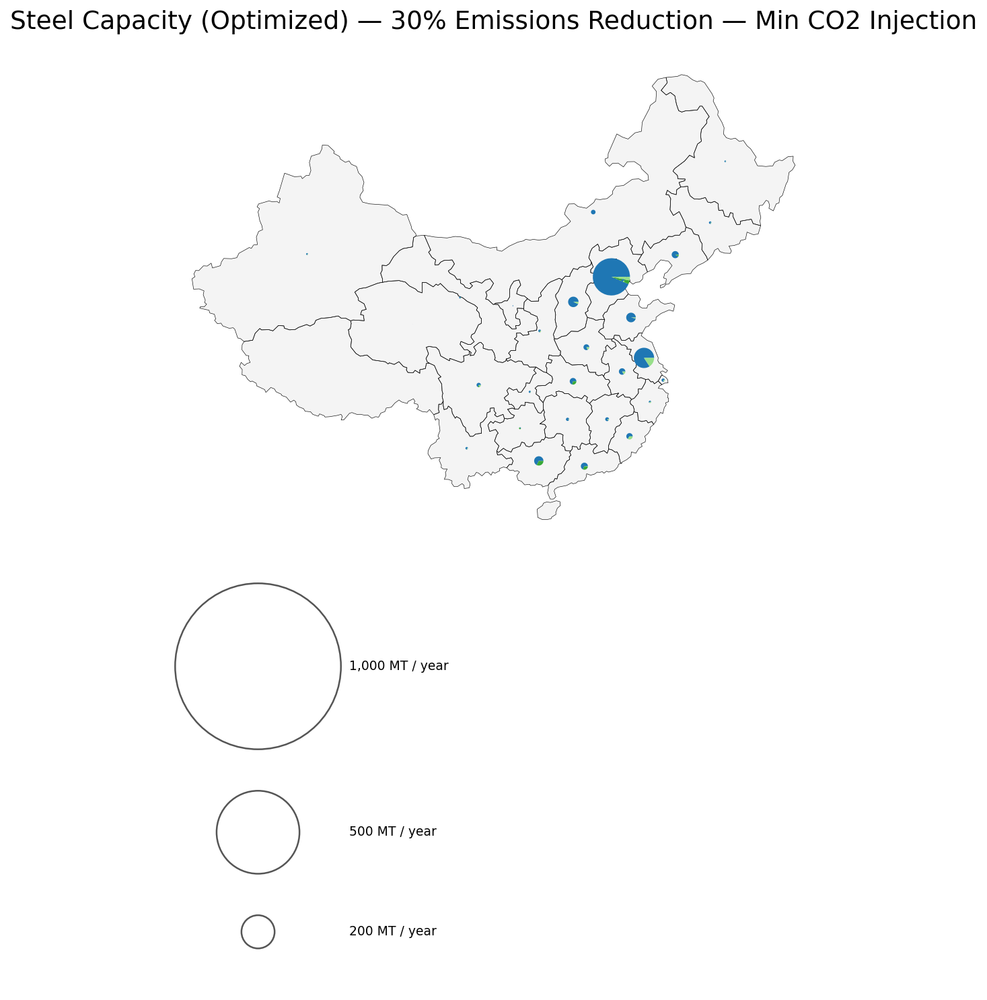

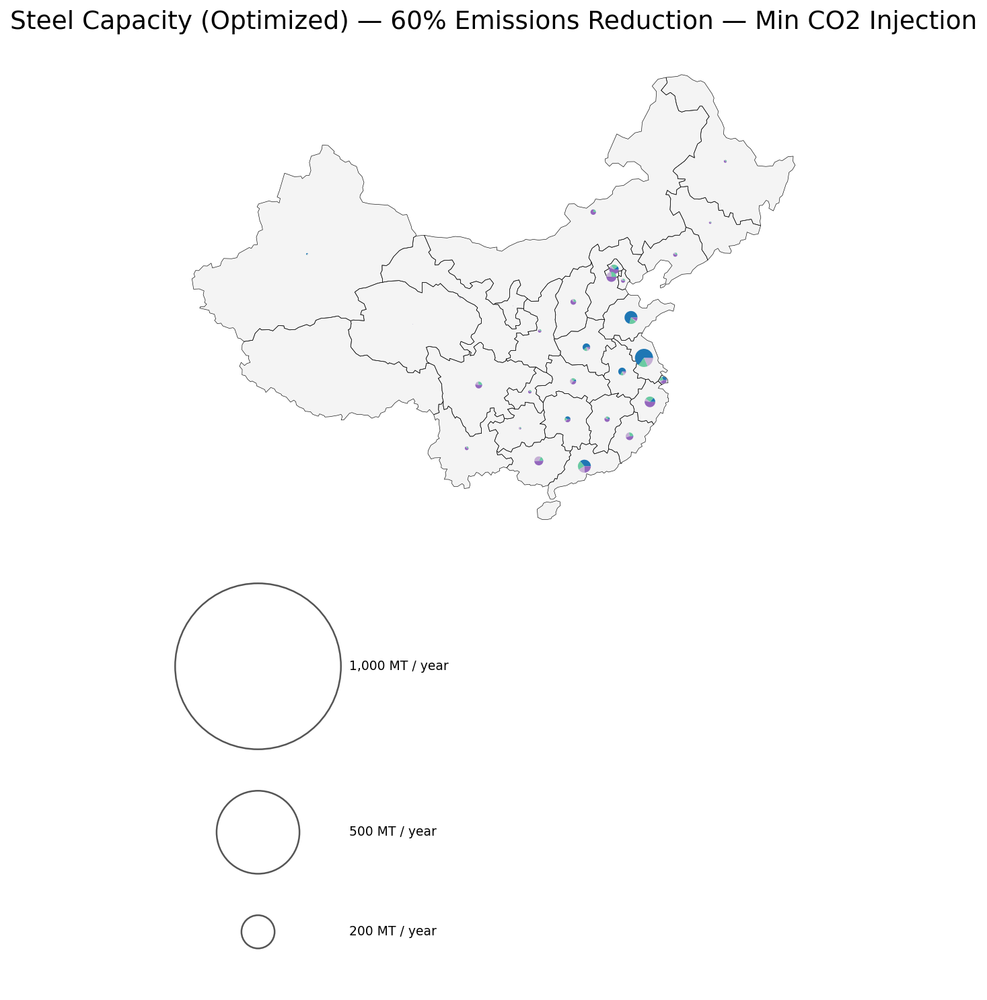

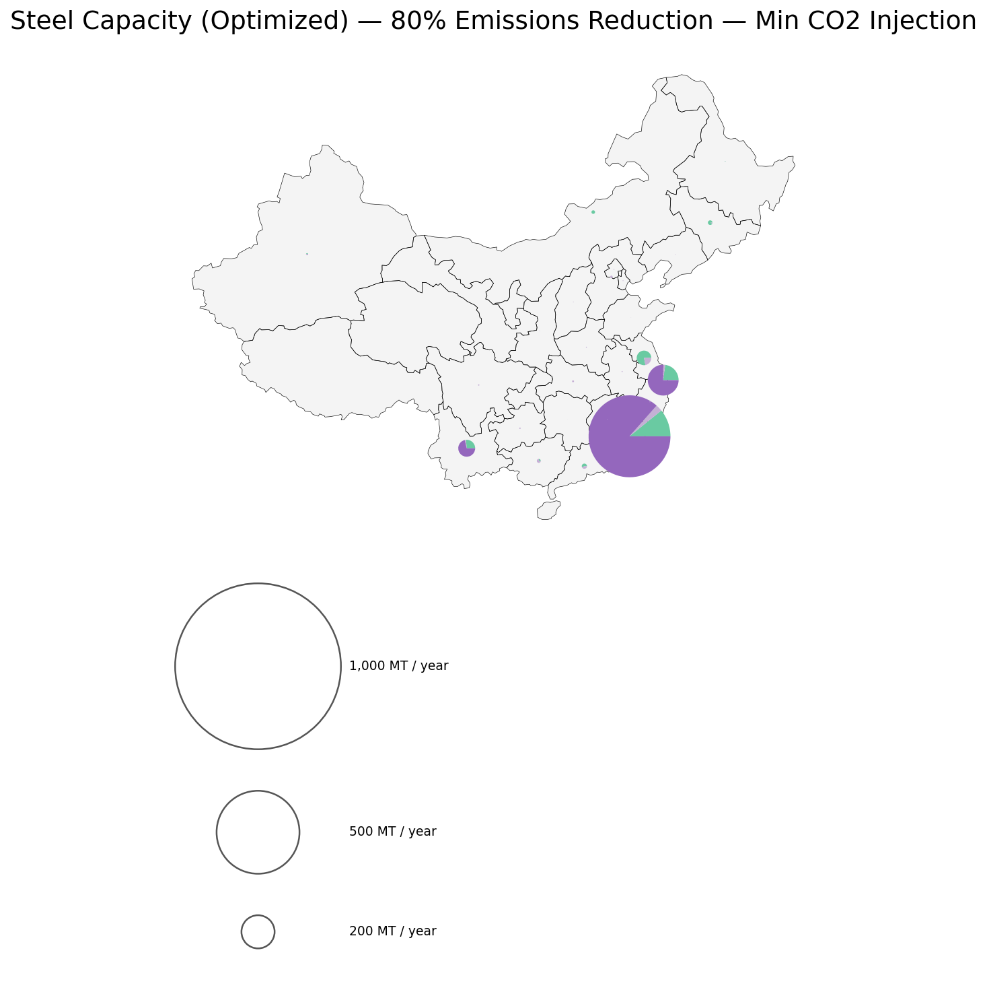

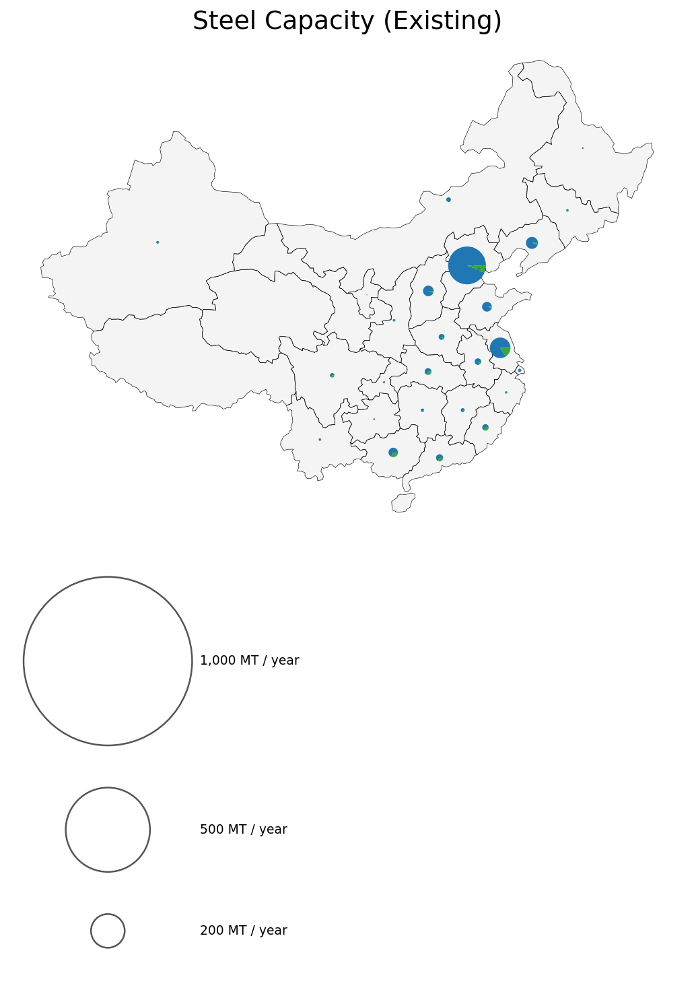

In [556]:
# Steel capacity pie charts
# Global max across all scenarios + existing for consistent circle scaling
sector_max = max(
    all_steel_dfs[inj][case].sum(axis=1).max()
    for inj in injection_scenarios
    for case in cases
)
sector_max = max(sector_max,
    all_steel_ex_dfs[injection_scenarios[0]][cases[0]].sum(axis=1).max(),
    1
)
legend_sizes = _nice_legend_sizes(sector_max)

# Optimized: one map per injection scenario × emission case
for inj in injection_scenarios:
    inj_label = injection_label_map[inj]
    for case in cases:
        plot_province_pies(
            gdf, all_steel_dfs[inj][case],
            colors=custom_color_map,
            pie_scale=7,
            title=f"Steel Capacity (Optimized) — {scenario_map[case]} — {inj_label}",
            legend_sizes=legend_sizes,
            capacity_unit="MT / year",
            max_total_override=sector_max,
        )

# Existing: one map for the sector
ex_data = all_steel_ex_dfs[injection_scenarios[0]][cases[0]]
if ex_data.values.sum() < 0.001:
    print("No existing steel capacity, skipping")
else:
    plot_province_pies(
        gdf, ex_data,
        colors=custom_color_map,
        pie_scale=7,
        title="Steel Capacity (Existing)",
        legend_sizes=legend_sizes,
        capacity_unit="MT / year",
        max_total_override=sector_max,
    )

No DRI-making capacity: No Emissions Policy — Max CO2 Injection, skipping


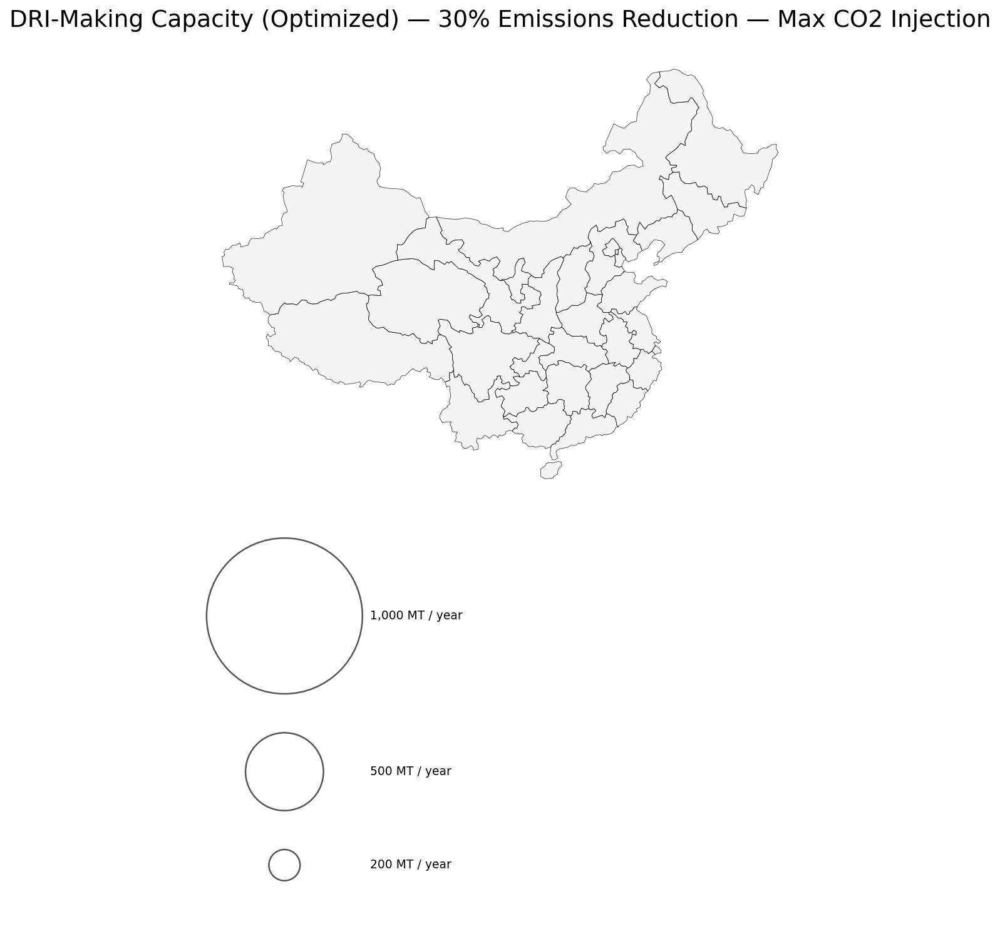

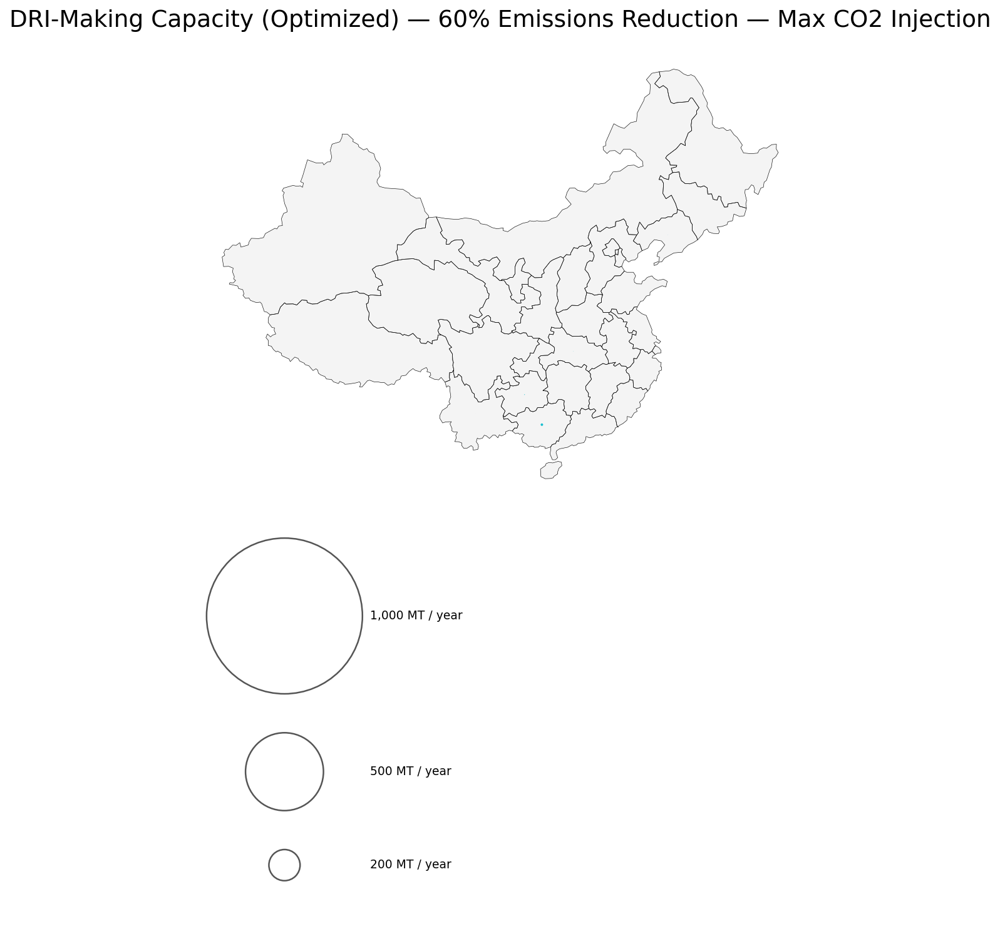

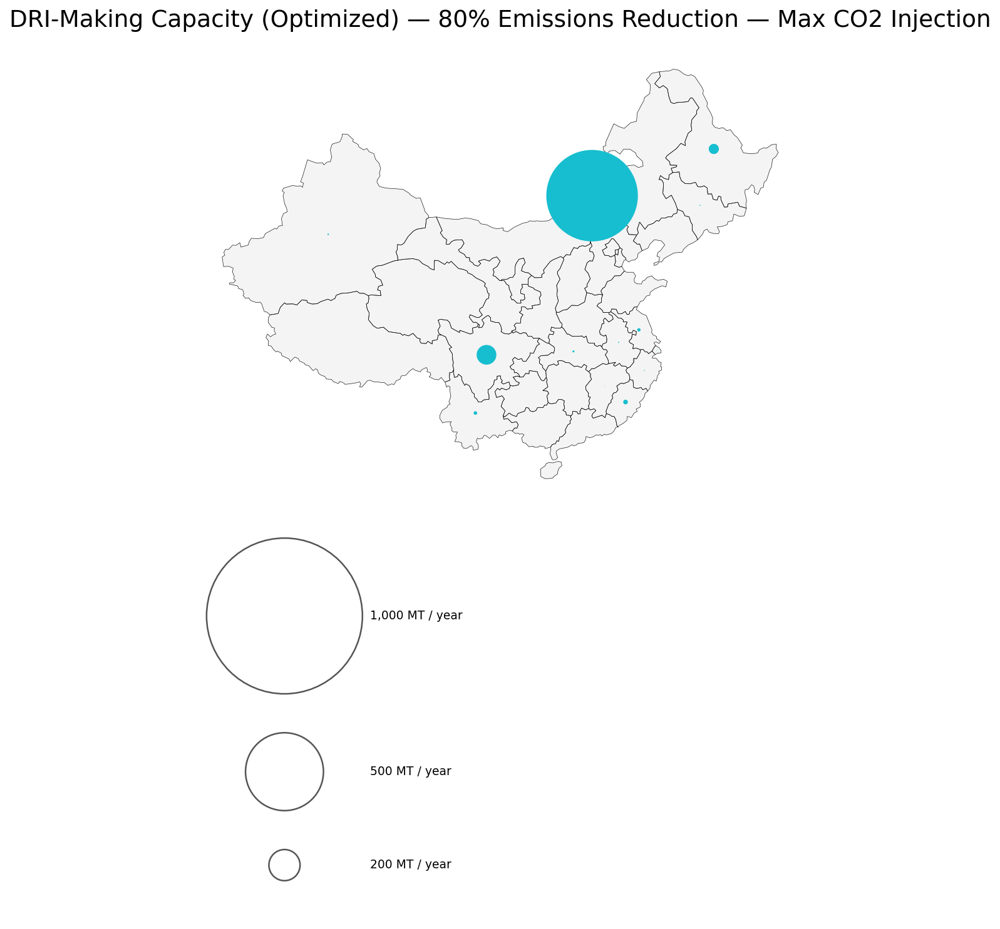

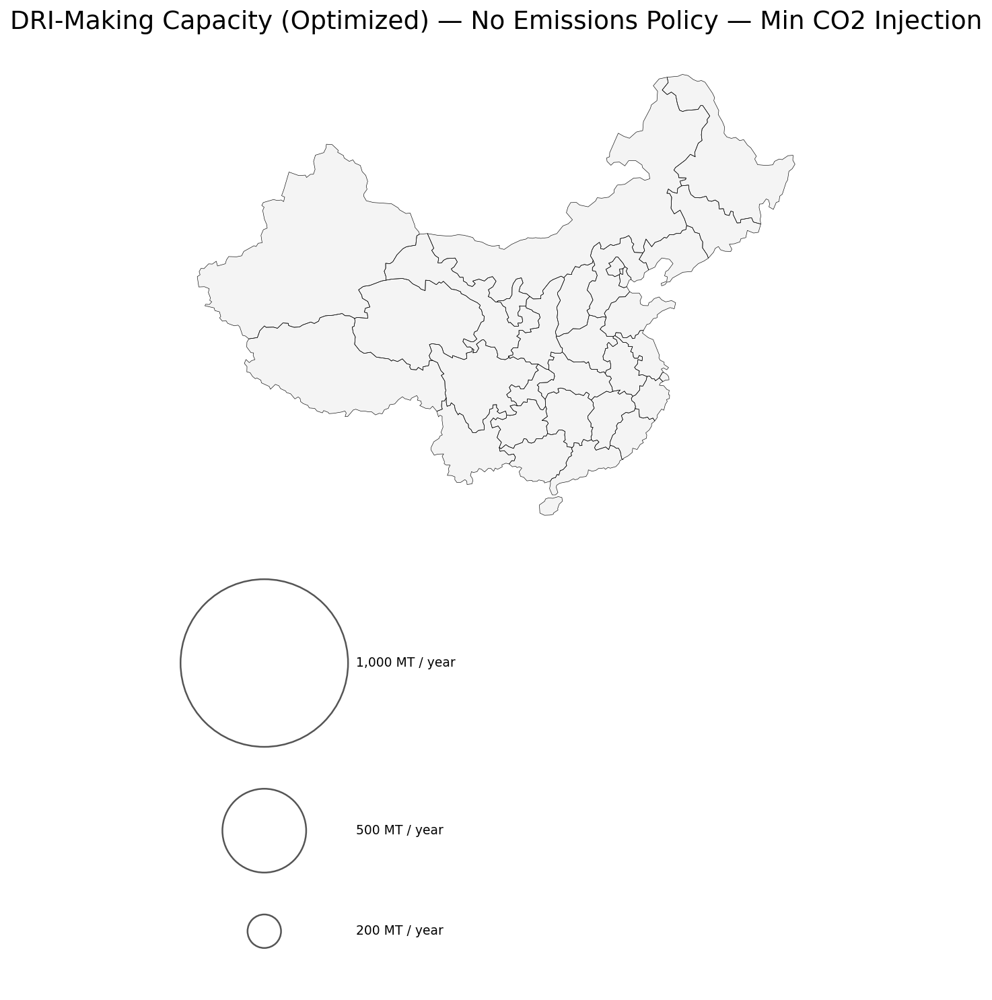

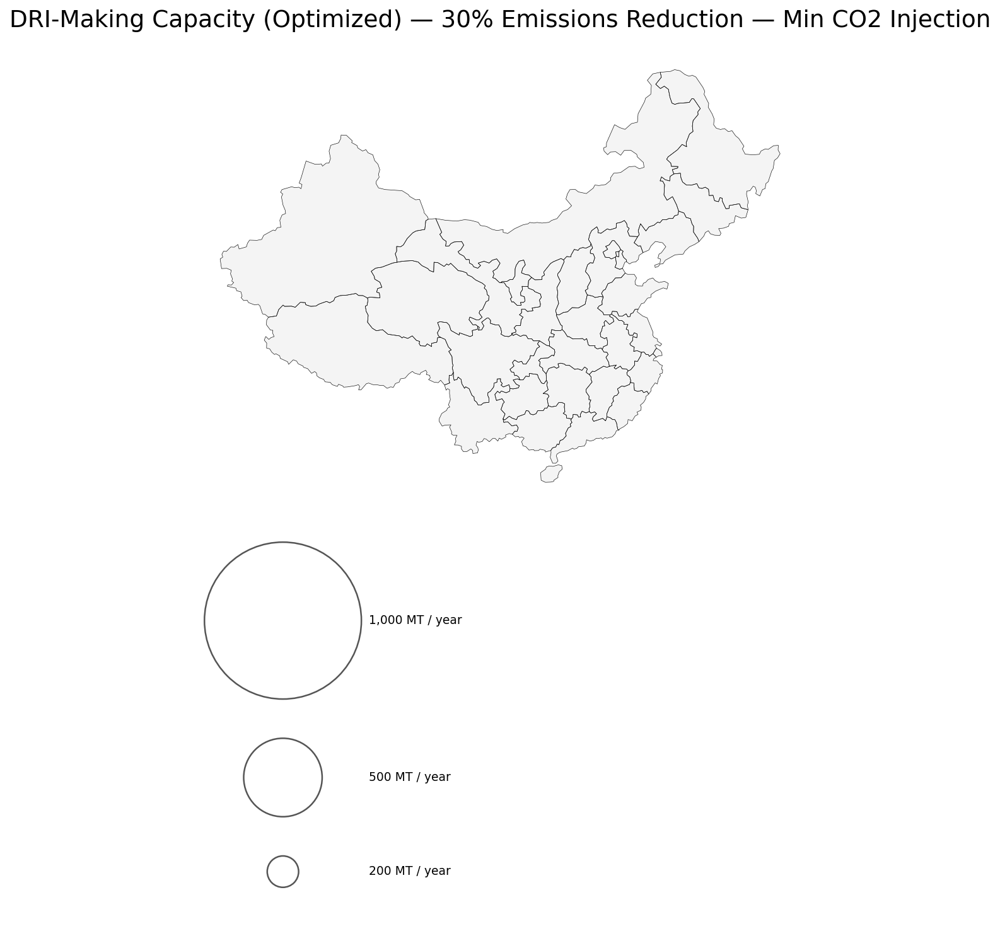

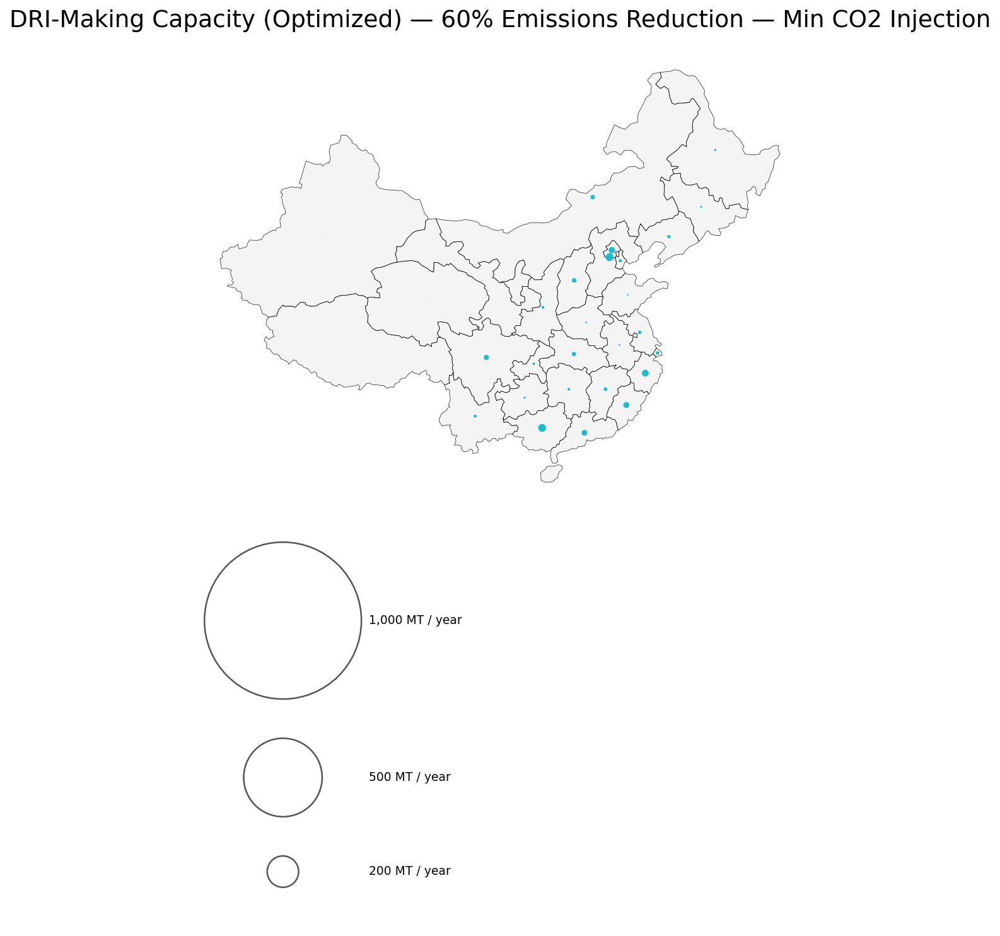

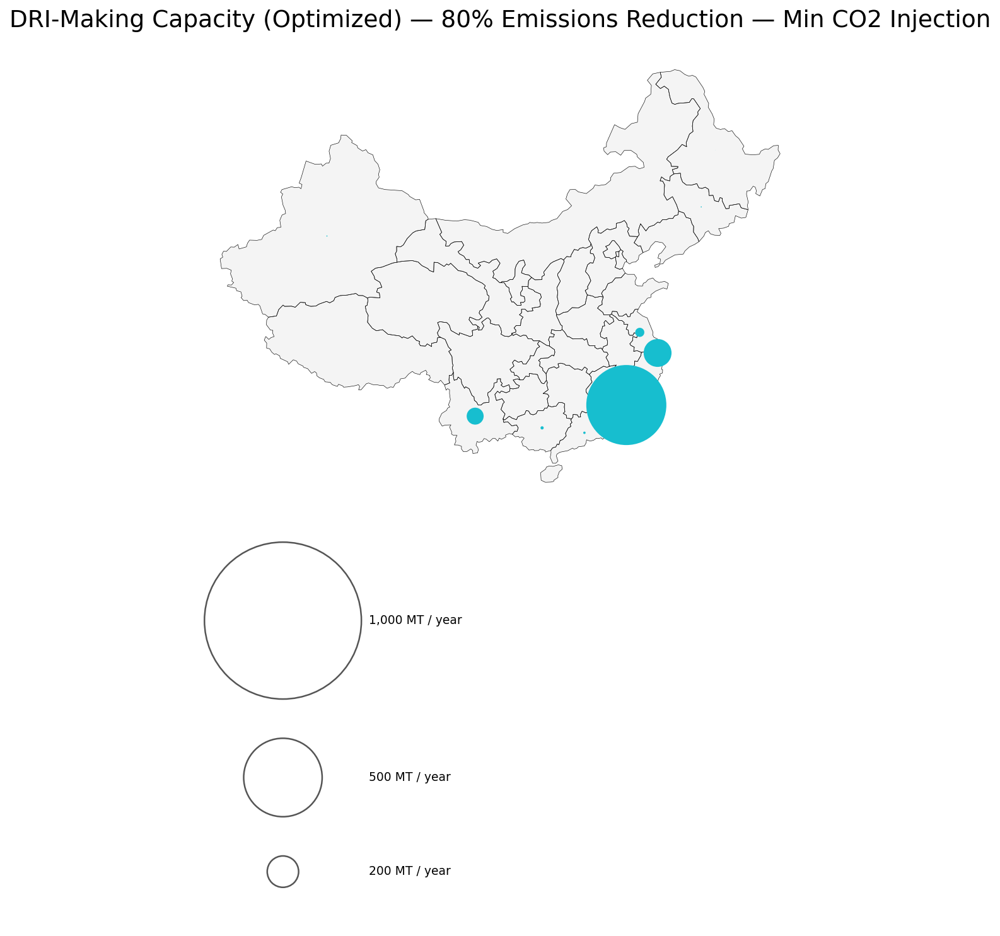

No existing DRI-making capacity, skipping


In [557]:
# DRI-making capacity pie charts
# Global max across all scenarios + existing for consistent circle scaling
_dri_maxes = [
    all_dri_dfs[inj][case].sum(axis=1).max()
    for inj in injection_scenarios
    for case in cases
]
_dri_maxes.append(all_dri_ex_dfs[injection_scenarios[0]][cases[0]].sum(axis=1).max())
sector_max = max(max(_dri_maxes), 1)
legend_sizes = _nice_legend_sizes(sector_max)

# Optimized: one map per injection scenario × emission case (skip zero-capacity cases)
for inj in injection_scenarios:
    inj_label = injection_label_map[inj]
    for case in cases:
        dri_data = all_dri_dfs[inj][case]
        if dri_data.values.sum() < 0.001:
            print(f"No DRI-making capacity: {scenario_map[case]} — {inj_label}, skipping")
            continue
        plot_province_pies(
            gdf, dri_data,
            colors=custom_color_map,
            pie_scale=7,
            title=f"DRI-Making Capacity (Optimized) — {scenario_map[case]} — {inj_label}",
            legend_sizes=legend_sizes,
            capacity_unit="MT / year",
            max_total_override=sector_max,
        )

# Existing: one map for the sector (skip if no existing DRI)
ex_data = all_dri_ex_dfs[injection_scenarios[0]][cases[0]]
if ex_data.values.sum() < 0.001:
    print("No existing DRI-making capacity, skipping")
else:
    plot_province_pies(
        gdf, ex_data,
        colors=custom_color_map,
        pie_scale=7,
        title="DRI-Making Capacity (Existing)",
        legend_sizes=legend_sizes,
        capacity_unit="MT / year",
        max_total_override=sector_max,
    )

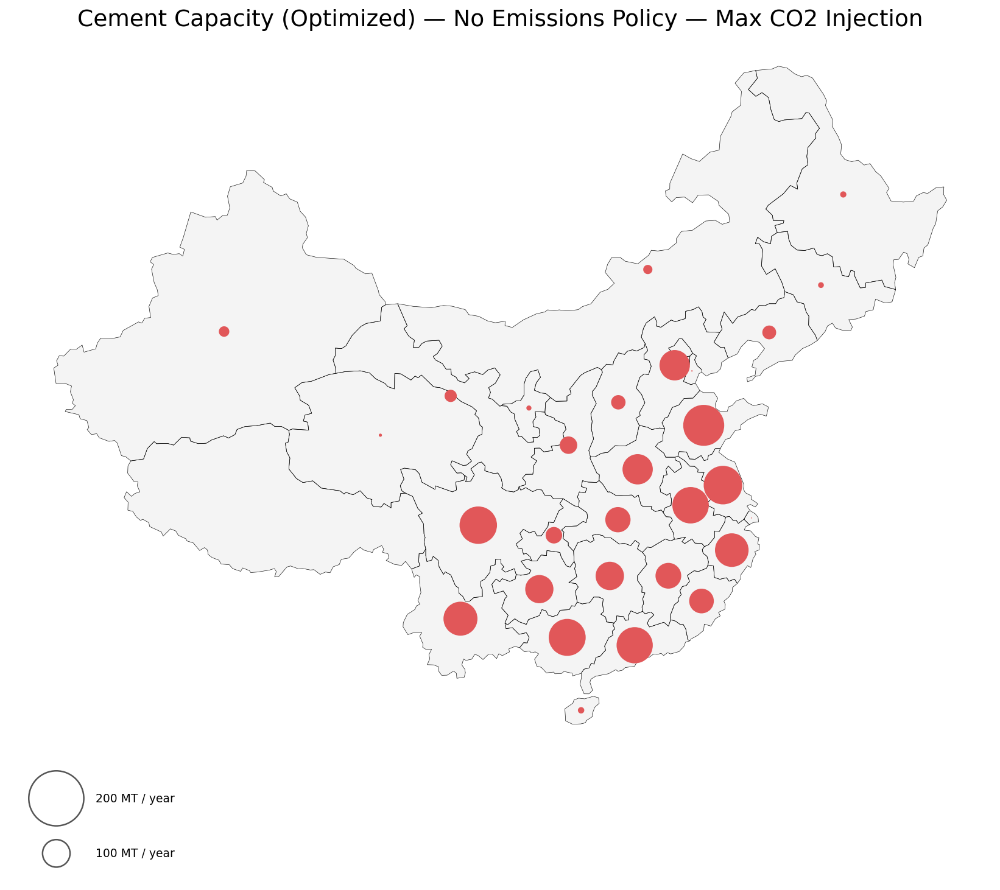

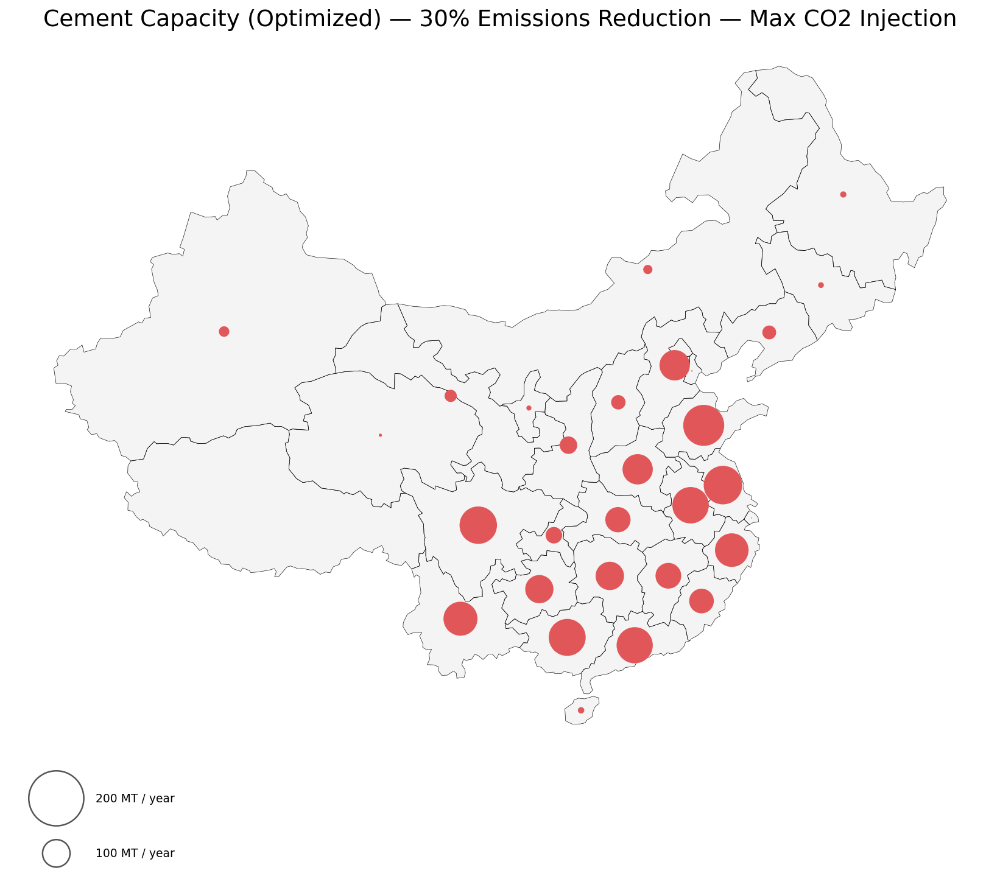

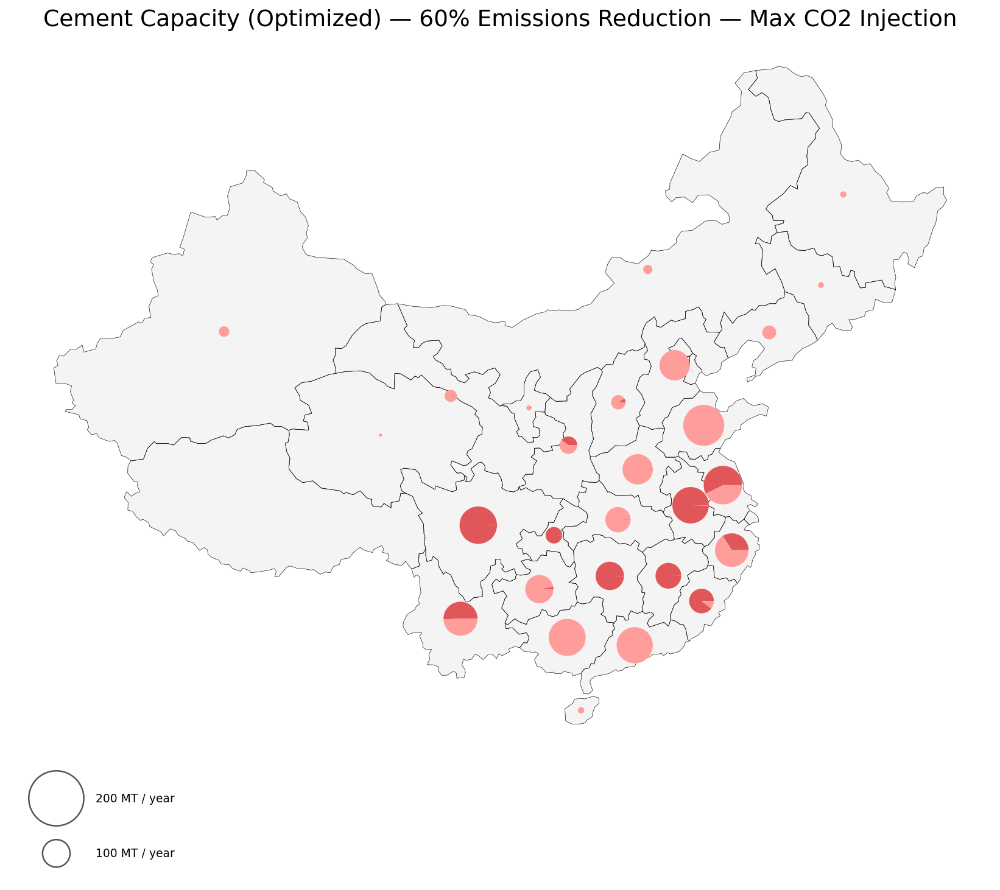

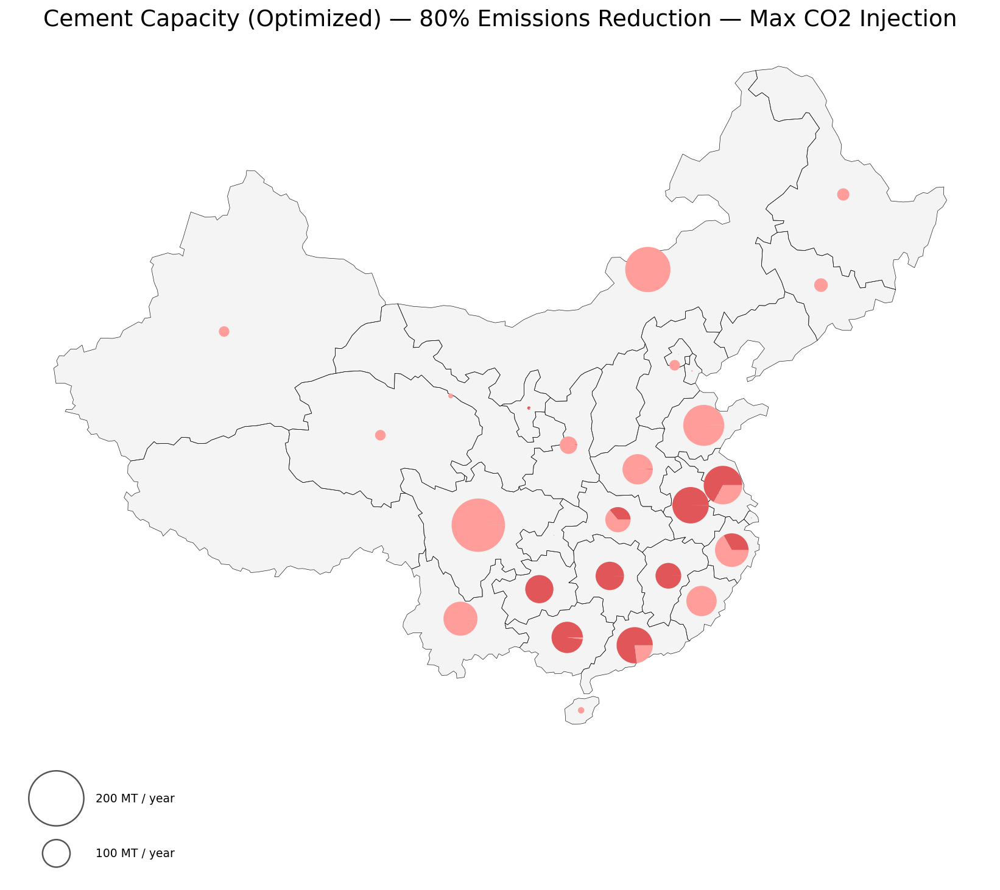

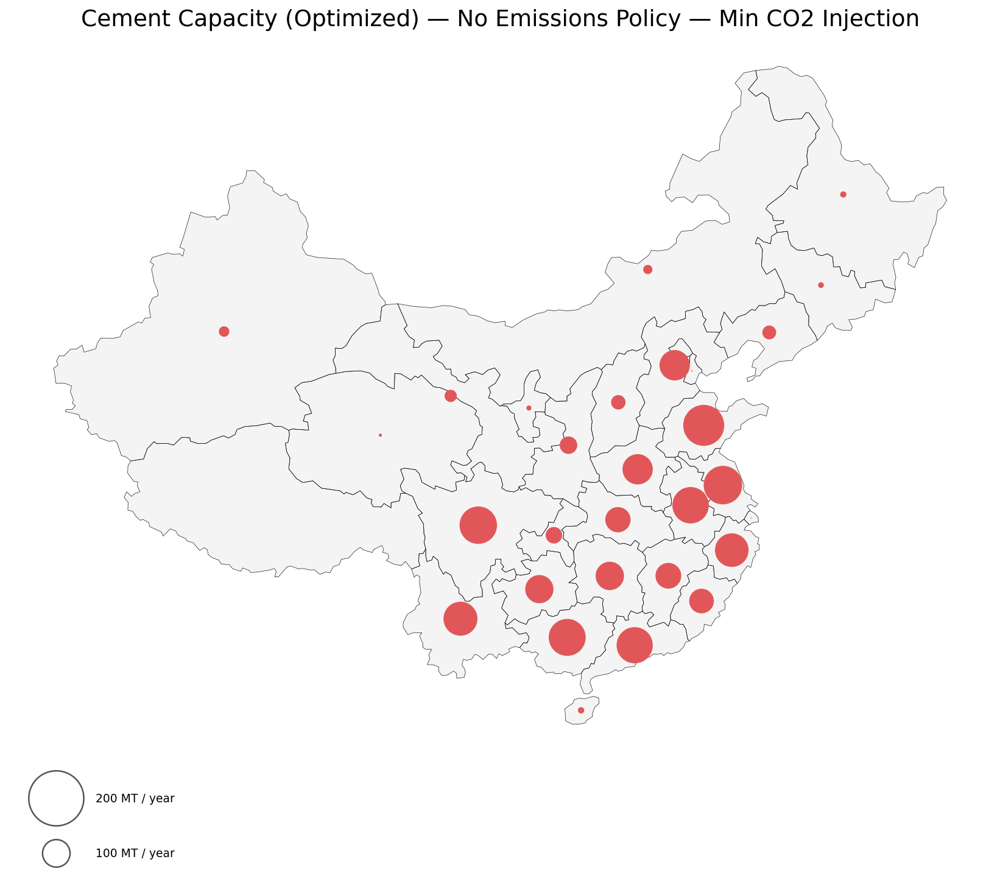

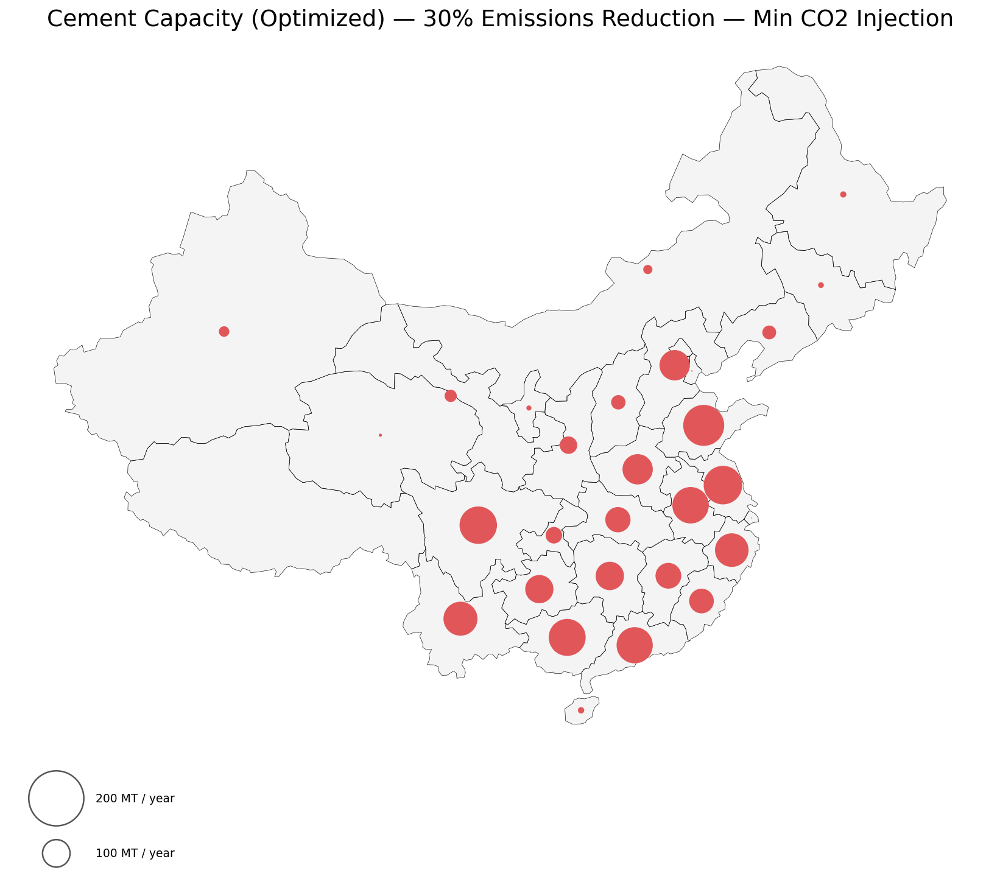

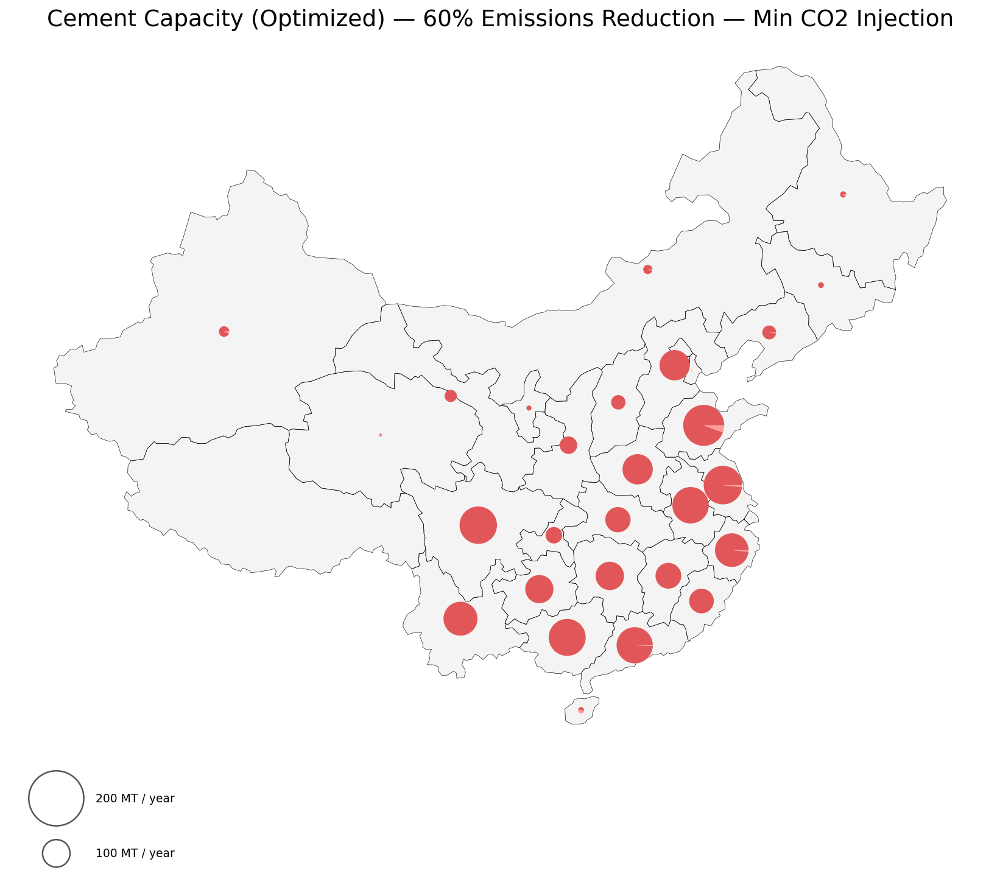

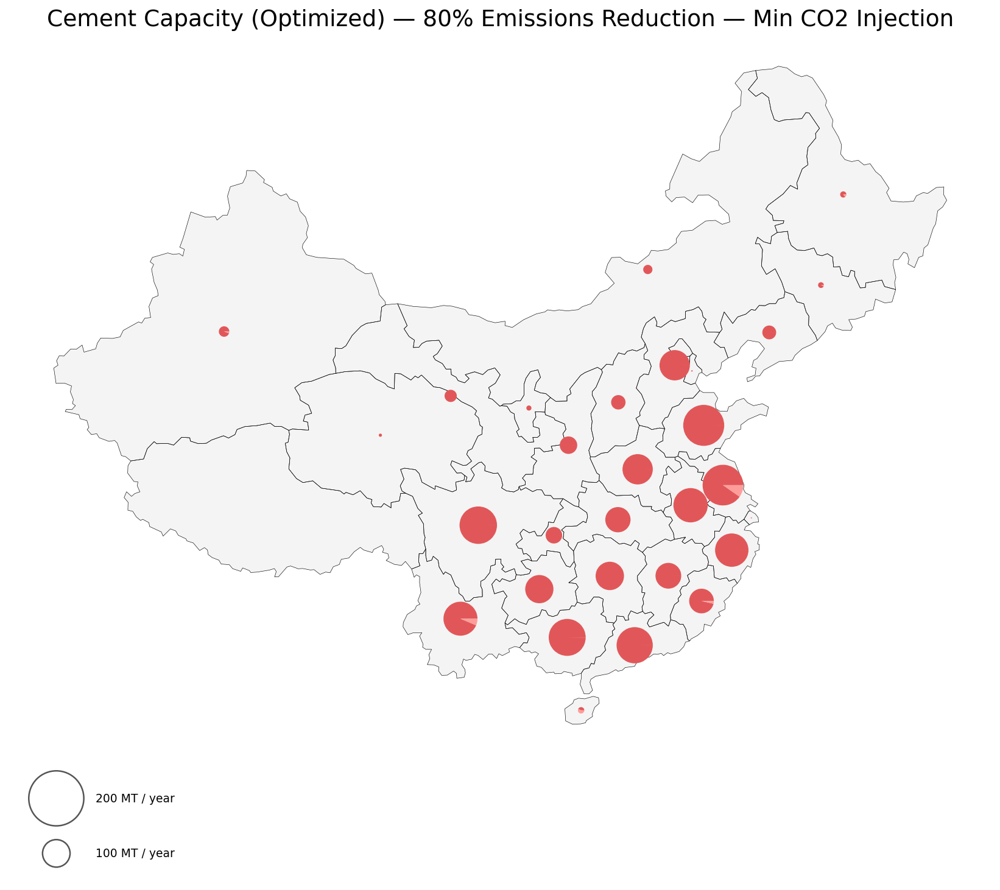

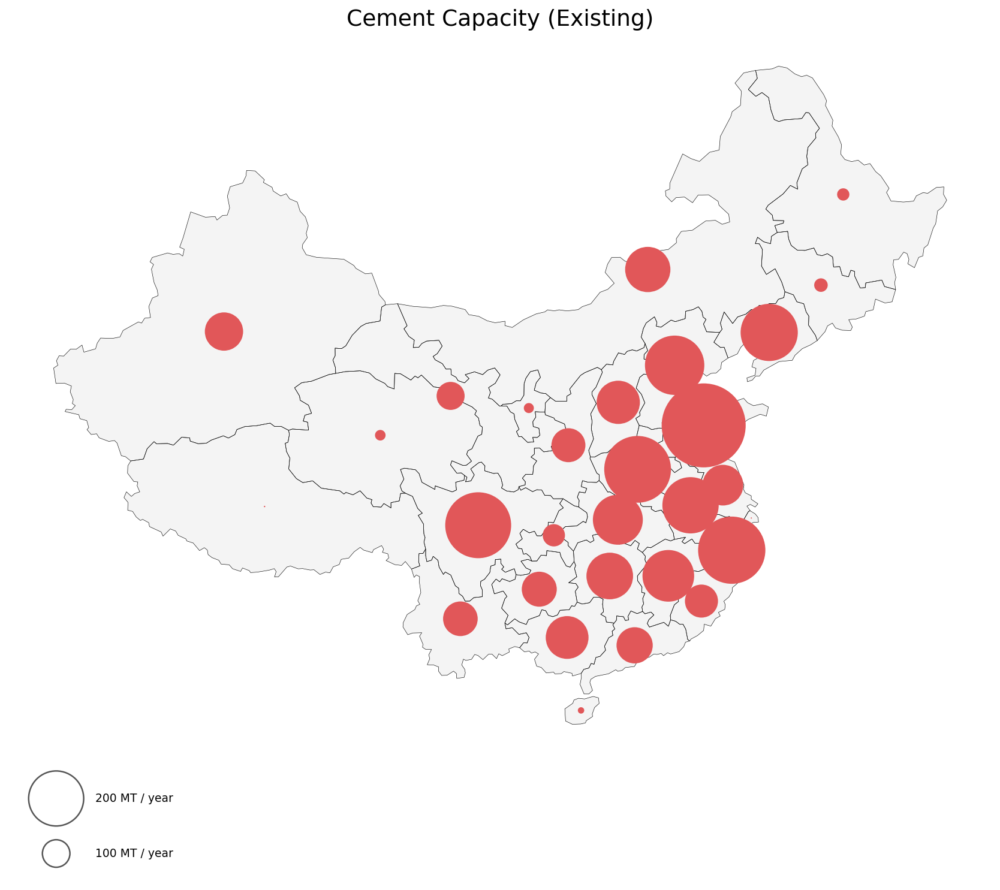

In [532]:
# Cement capacity pie charts
# Global max across all scenarios + existing for consistent circle scaling
sector_max = max(
    all_cement_dfs[inj][case].sum(axis=1).max()
    for inj in injection_scenarios
    for case in cases
)
sector_max = max(sector_max,
    all_cement_ex_dfs[injection_scenarios[0]][cases[0]].sum(axis=1).max(),
    1
)
legend_sizes = _nice_legend_sizes(sector_max)

# Optimized: one map per injection scenario × emission case
for inj in injection_scenarios:
    inj_label = injection_label_map[inj]
    for case in cases:
        plot_province_pies(
            gdf, all_cement_dfs[inj][case],
            colors=custom_color_map,
            pie_scale=4,
            title=f"Cement Capacity (Optimized) — {scenario_map[case]} — {inj_label}",
            legend_sizes=[100, 200],
            capacity_unit="MT / year",
            max_total_override=sector_max,
        )

# Existing: one map for the sector
ex_data = all_cement_ex_dfs[injection_scenarios[0]][cases[0]]
if ex_data.values.sum() < 0.001:
    print("No existing cement capacity, skipping")
else:
    plot_province_pies(
        gdf, ex_data,
        colors=custom_color_map,
        pie_scale=4,
        title="Cement Capacity (Existing)",
        legend_sizes=[100, 200],
        capacity_unit="MT / year",
        max_total_override=sector_max,
    )

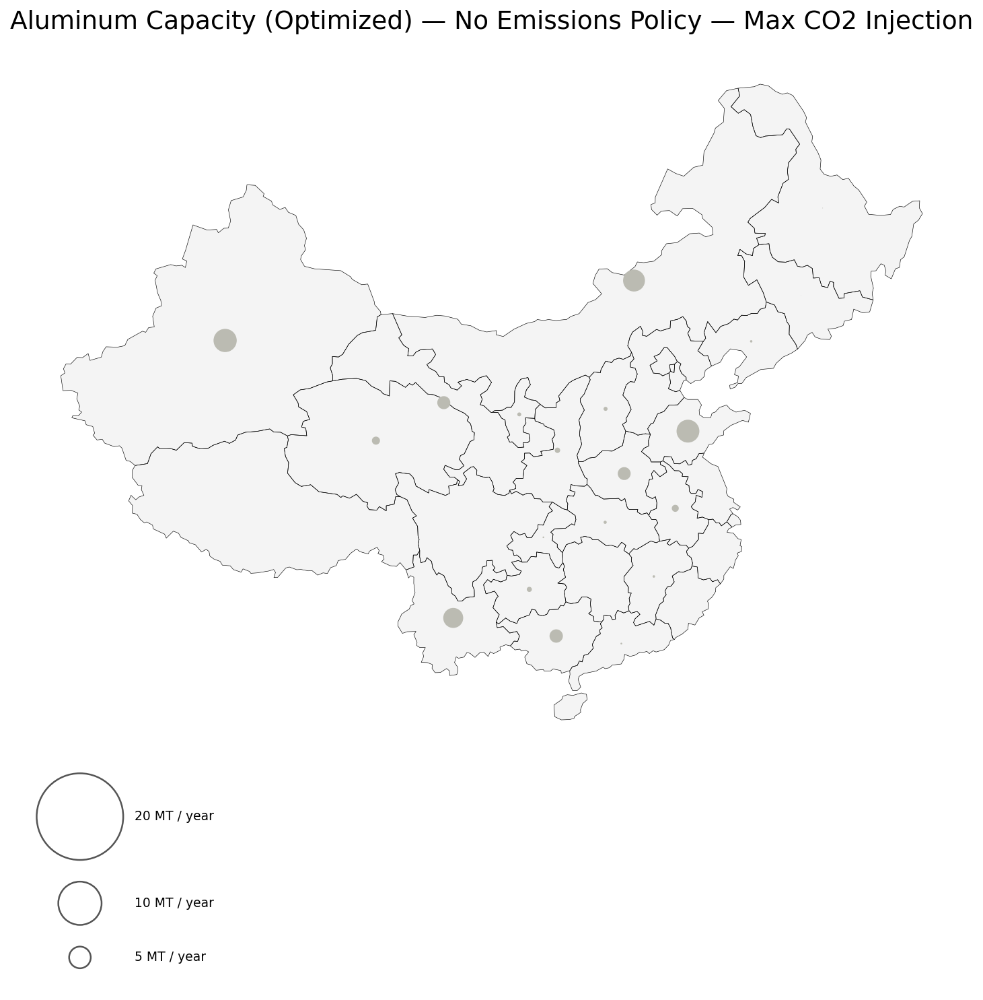

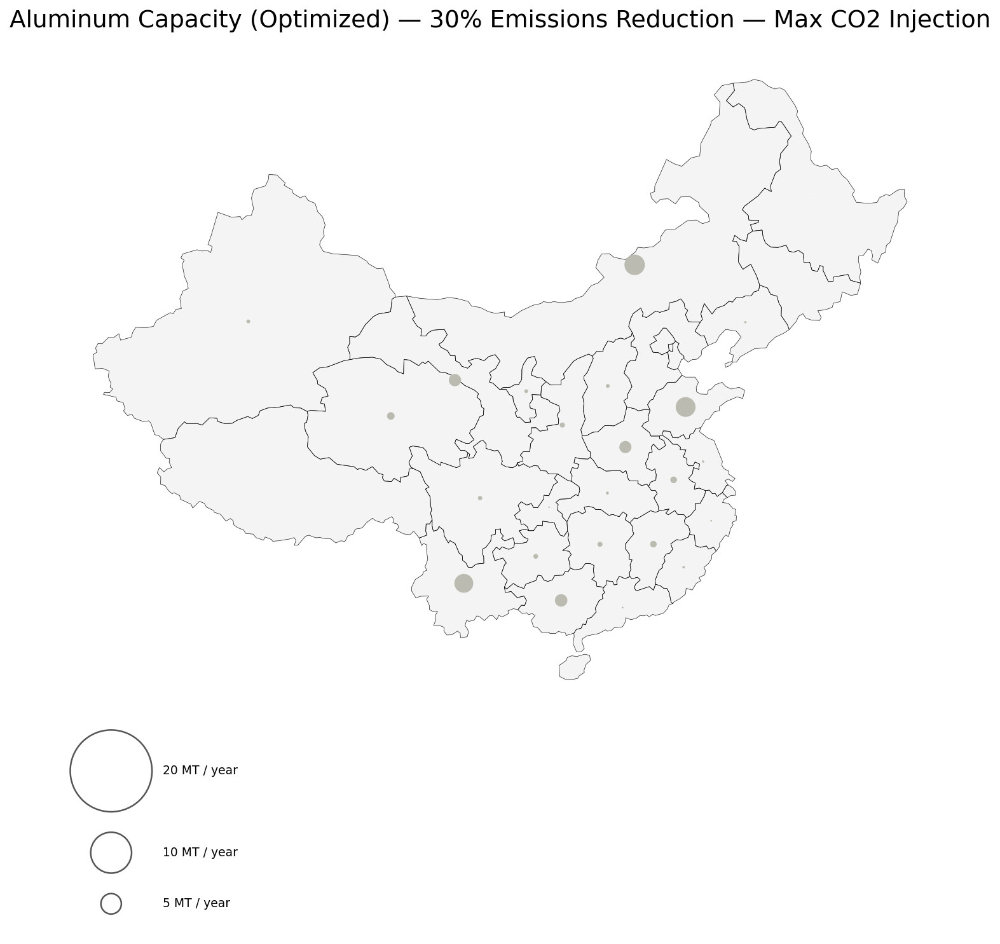

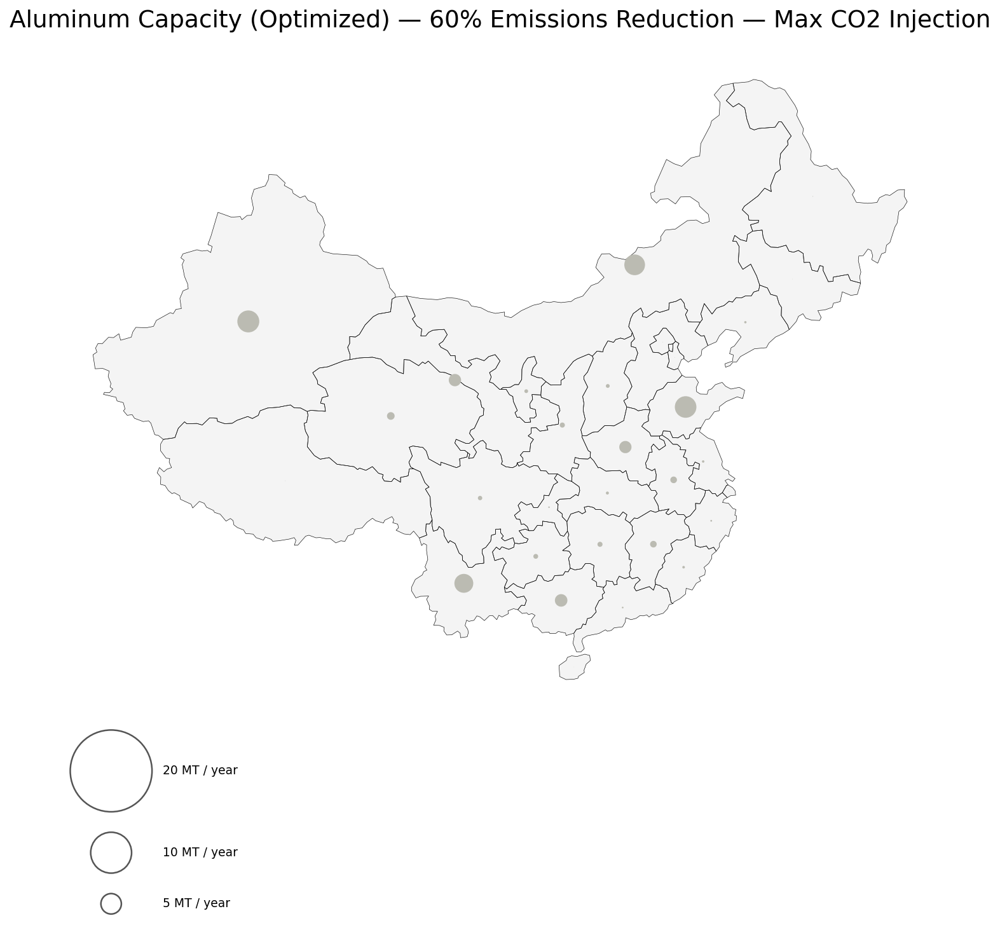

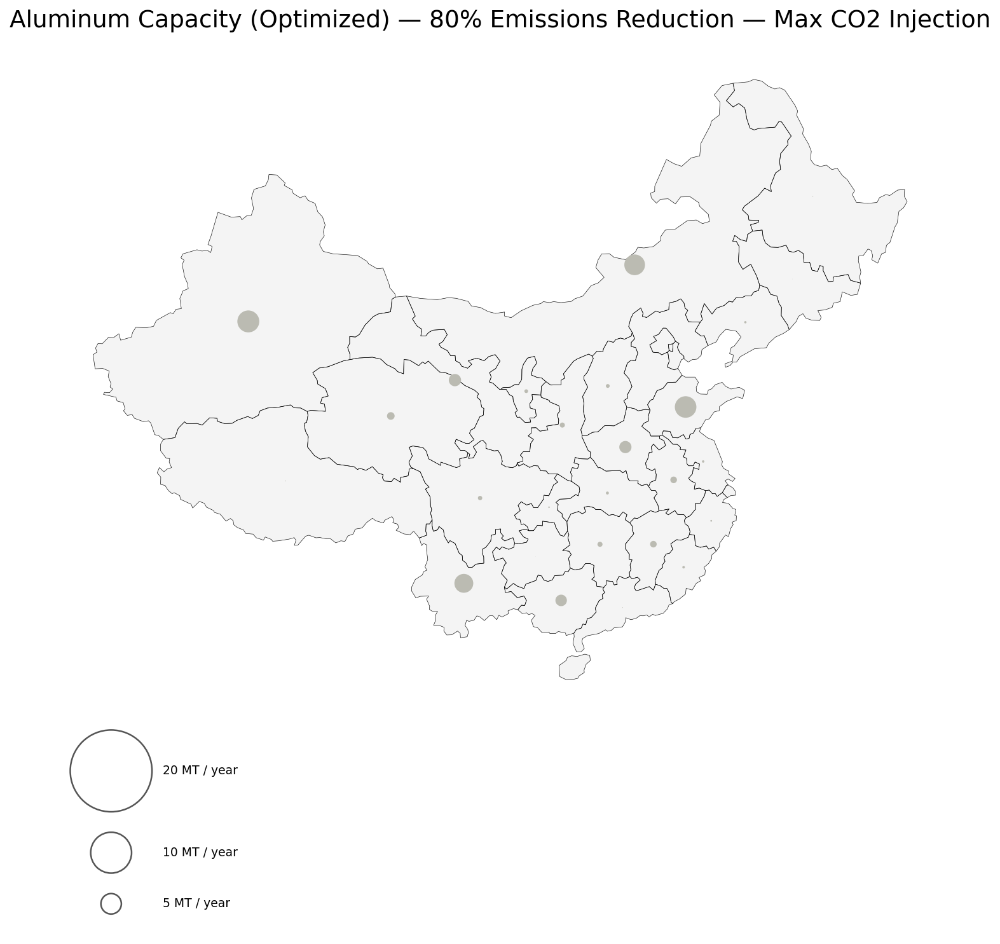

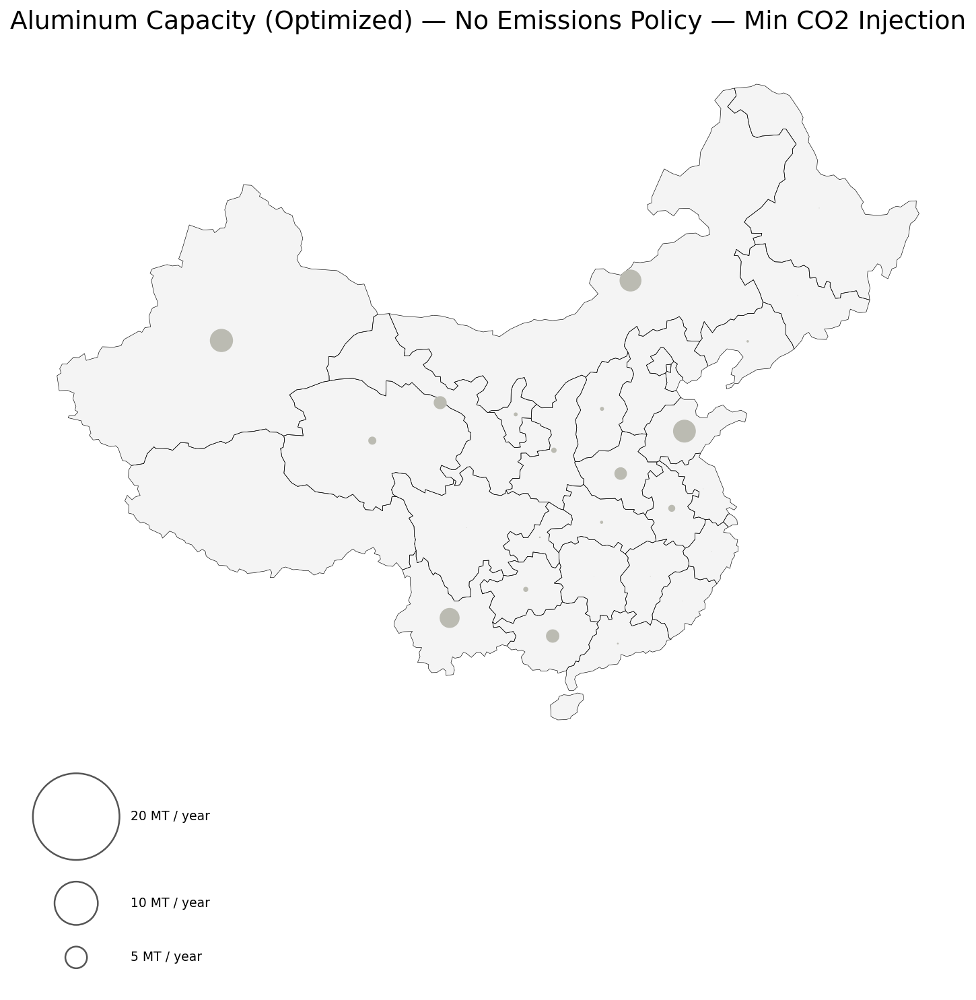

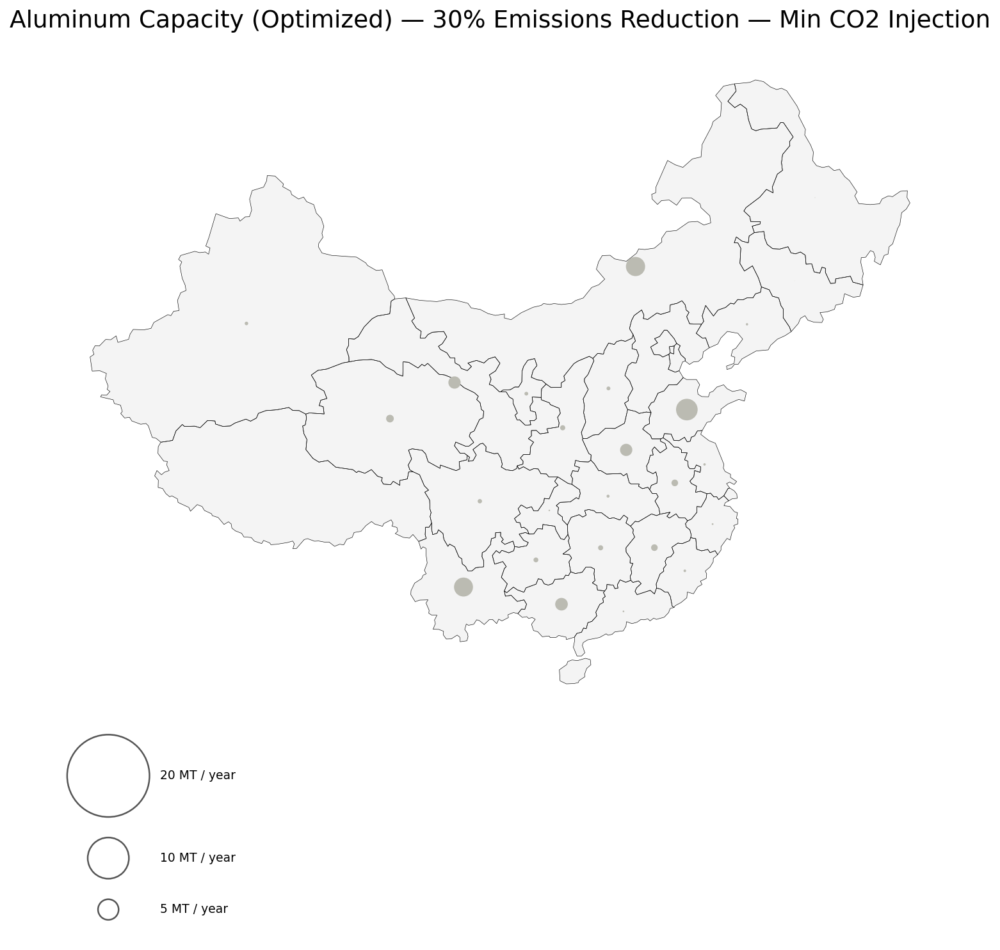

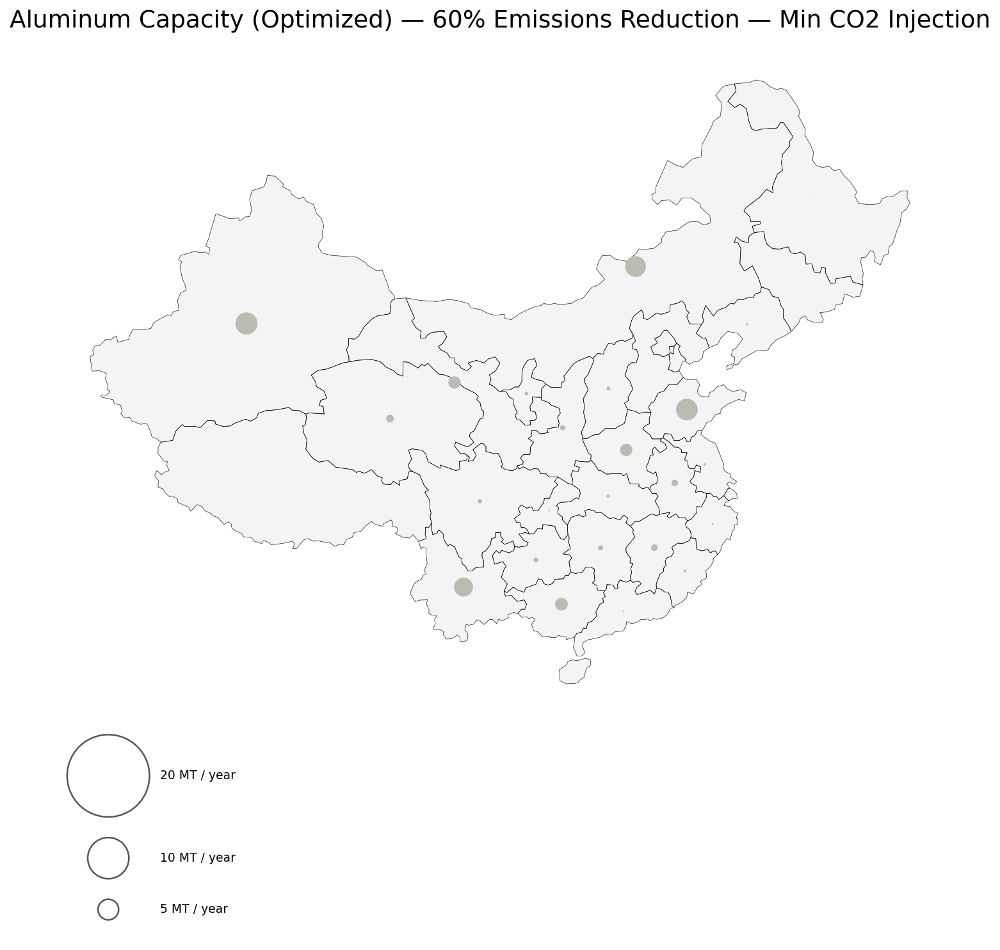

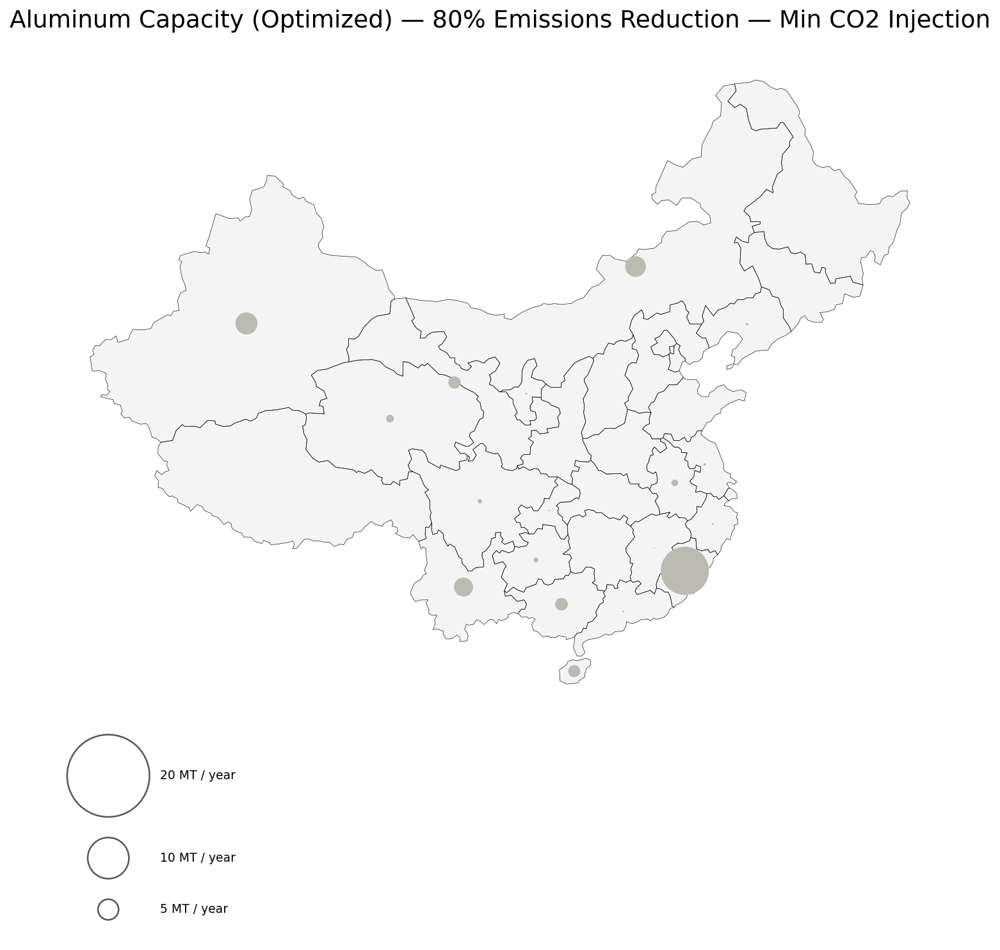

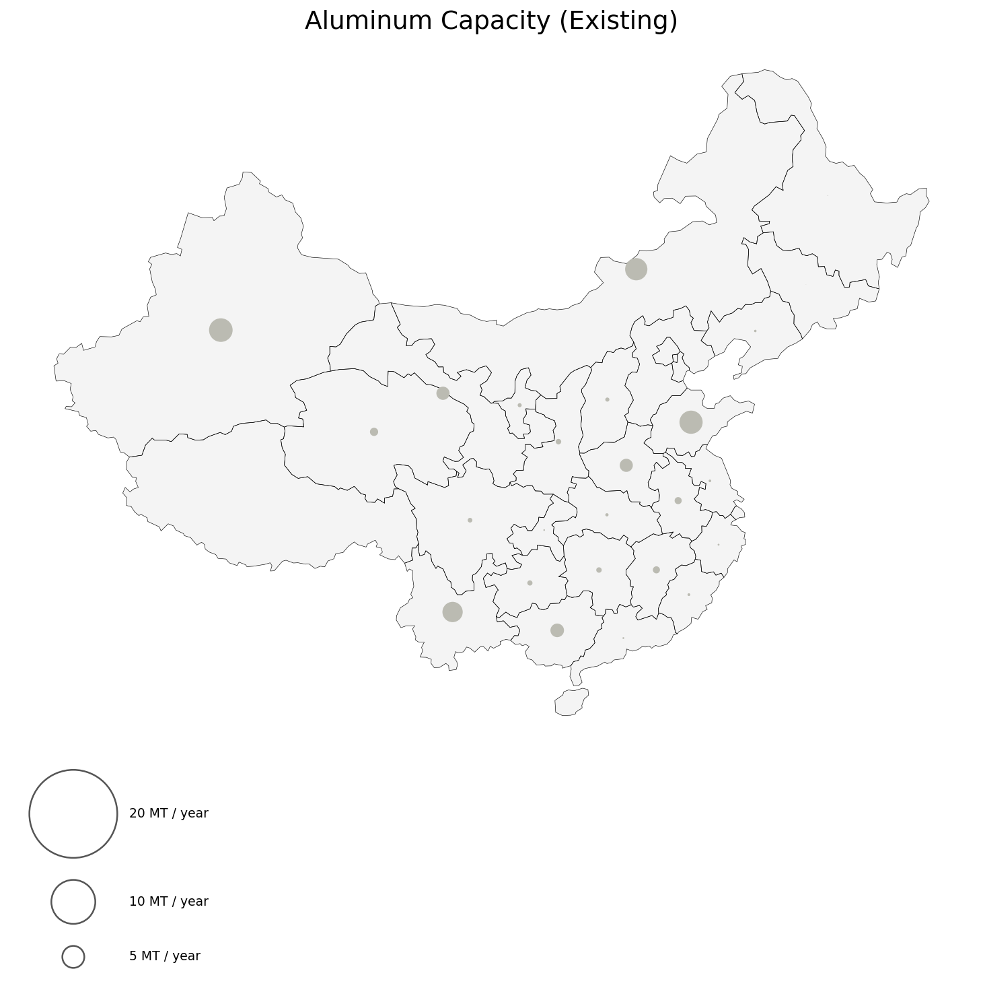

In [ ]:
# Aluminum capacity pie charts
# Global max across all scenarios + existing for consistent circle scaling
sector_max = max(
    all_aluminum_dfs[inj][case].sum(axis=1).max()
    for inj in injection_scenarios
    for case in cases
)
sector_max = max(sector_max,
    all_aluminum_ex_dfs[injection_scenarios[0]][cases[0]].sum(axis=1).max(),
    1
)
legend_sizes = _nice_legend_sizes(sector_max)

# Optimized: one map per injection scenario × emission case
for inj in injection_scenarios:
    inj_label = injection_label_map[inj]
    for case in cases:
        plot_province_pies(
            gdf, all_aluminum_dfs[inj][case],
            colors=custom_color_map,
            pie_scale=5,
            title=f"Aluminum Capacity (Optimized) — {scenario_map[case]} — {inj_label}",
            legend_sizes=legend_sizes,
            capacity_unit="MT / year",
            max_total_override=sector_max,
        )

# Existing: one map for the sector
ex_data = all_aluminum_ex_dfs[injection_scenarios[0]][cases[0]]
if ex_data.values.sum() < 0.001:
    print("No existing aluminum capacity, skipping")
else:
    plot_province_pies(
        gdf, ex_data,
        colors=custom_color_map,
        pie_scale=5,
        title="Aluminum Capacity (Existing)",
        legend_sizes=legend_sizes,
        capacity_unit="MT / year",
        max_total_override=sector_max,
    )

# Material Transport Flows

In [534]:
def plot_transport_flows(
    flows_df,
    transport_prefix,
    gdf_input,
    province_col="NAME_1",
    title="Transport Flows",
    color="#1f77b4",
    figsize=(12, 10),
    dpi=150,
    flow_threshold=0.005,
    max_shaft_width=150_000,
    min_shaft_width=20_000,
    head_width_ratio=2.5,
    legend_sizes=None,
    unit_label="MT",
    flow_scale=1e6,
    ax=None,
    draw_basemap=True,
    legend_x_anchor="left",
):
    gdf = gdf_input.copy()

    col_pat = re.compile(
        rf"^{re.escape(transport_prefix)}_Region\d+\w+_to_Region\d+\w+_transmission_edge$"
    )
    transport_cols = [c for c in flows_df.columns if col_pat.match(c)]
    if not transport_cols:
        print(f"No columns found for prefix: {transport_prefix}")
        return

    flow_sums = flows_df[transport_cols].sum()

    edge_pat = re.compile(
        rf"^{re.escape(transport_prefix)}_Region\d+(\w+)_to_Region\d+(\w+)_transmission_edge$"
    )
    directed = {}
    for col, val in flow_sums.items():
        m = edge_pat.match(col)
        if m:
            directed[(m.group(1), m.group(2))] = val

    pairs_seen = set()
    net_flows = []
    for (src, dst), fwd in directed.items():
        if (dst, src) in pairs_seen or (src, dst) in pairs_seen:
            continue
        pairs_seen.add((src, dst))
        rev = directed.get((dst, src), 0.0)
        net = (fwd - rev) / flow_scale  # convert to display units (MT)
        if abs(net) > flow_threshold:
            net_flows.append((src, dst, net) if net > 0 else (dst, src, -net))

    if not net_flows:
        print("No net flows above threshold.")
        return

    gdf_proj = gdf.to_crs(epsg=3857)
    gdf_proj["centroid"] = gdf_proj.geometry.centroid
    centroid_map = dict(zip(
        gdf_proj[province_col],
        zip(gdf_proj.centroid.x, gdf_proj.centroid.y)
    ))

    max_flow = max(f for _, _, f in net_flows)

    def shaft_w(flow):
        frac = (flow / max_flow) ** 0.5
        return min_shaft_width + frac * (max_shaft_width - min_shaft_width)

    _own_fig = ax is None
    if _own_fig:
        fig, ax = plt.subplots(figsize=figsize, dpi=dpi)
    ax.set_axis_off()

    if draw_basemap:
        gdf_proj.plot(ax=ax, color="#F4F4F4", edgecolor="none", zorder=0)
        gdf_proj.boundary.plot(ax=ax, linewidth=0.3, color="#888888", zorder=1)

    for src, dst, flow in sorted(net_flows, key=lambda x: x[2]):
        if src not in centroid_map or dst not in centroid_map:
            continue
        x0, y0 = centroid_map[src]
        x1, y1 = centroid_map[dst]
        dx, dy = x1 - x0, y1 - y0
        dist = np.hypot(dx, dy)
        sw = shaft_w(flow)
        hw = sw * head_width_ratio
        hl = min(dist * 0.32, hw * 1.4)
        alpha = 0.45 + 0.55 * (flow / max_flow)
        ax.arrow(x0, y0, dx, dy,
                 width=sw, head_width=hw, head_length=hl,
                 length_includes_head=True,
                 fc=color, ec="white", linewidth=0.5,
                 alpha=alpha, zorder=1500)  # above pie wedges (zorder=1000)

    if legend_sizes is None:
        legend_sizes = _nice_legend_sizes(max_flow)

    xlim = ax.get_xlim()
    ylim = ax.get_ylim()
    pw = xlim[1] - xlim[0]
    arrow_len = pw * 0.09
    max_legend_sw = shaft_w(max(legend_sizes))
    gap = max_legend_sw * 0.8

    # Expand ylim downward to place legend below the map, never overlapping it
    n_rows = len(legend_sizes) + 1  # arrow rows + title row
    strip_height = gap + n_rows * max_legend_sw * 3.2
    ax.set_ylim(ylim[0] - strip_height, ylim[1])
    ylim = ax.get_ylim()

    lx = (xlim[1] - pw * 0.22) if legend_x_anchor == "right" else (xlim[0] + pw * 0.02)
    ly = ylim[0] + gap

    for size in sorted(legend_sizes):
        sw = shaft_w(size)
        hw = sw * head_width_ratio
        hl = min(arrow_len * 0.32, hw * 1.4)
        ax.arrow(lx, ly, arrow_len, 0,
                 width=sw, head_width=hw, head_length=hl,
                 length_includes_head=True,
                 fc=color, ec="white", linewidth=0.5, alpha=0.85, zorder=2000)
        ax.text(lx + arrow_len + pw * 0.01, ly,
                f"{size:g} {unit_label}",
                va="center", ha="left", fontsize=9, zorder=2001)
        ly += max_legend_sw * 3.2

    ax.text(lx, ly + max_legend_sw * 0.5, "Annual Net Flow",
            fontsize=9, fontweight="bold", zorder=2001)

    if _own_fig:
        plt.title(title, fontsize=16, pad=12)
        plt.tight_layout()
        plt.show()
        plt.close()

    return ax

In [535]:
# Transport summary table — both injection scenarios
for inj in injection_scenarios:
    inj_label = injection_label_map[inj]
    transport_summary = {}
    for case in cases:
        f = all_flow_dfs[inj][case]
        transport_summary[case] = {
            "Cement":      f[[c for c in f.columns if "cement_transport" in c and "transmission_edge" in c]].sum().sum(),
            "Scrap Steel": f[[c for c in f.columns if "steelscrap_transport" in c and "transmission_edge" in c]].sum().sum(),
            "DRI":         f[[c for c in f.columns if "dri_transport" in c and "transmission_edge" in c]].sum().sum(),
            "Crude Steel": f[[c for c in f.columns if "crudesteel_transport" in c and "transmission_edge" in c]].sum().sum(),
            "CO2":         f[[c for c in f.columns if "CO2_Pipeline_transmission_edge" in c]].sum().sum(),
        }
    transport_summary_df = pd.DataFrame(transport_summary).T / 1e6
    transport_summary_df.index.name = "Case"
    print(f"\nTotal annual transport by material (MT) — {inj_label}:\n")
    print(transport_summary_df.map(lambda x: f"{x:.2f}").to_string())


Total annual transport by material (MT) — Max CO2 Injection:

               Cement Scrap Steel   DRI Crude Steel    CO2
Case                                                      
noemissionscap   0.87        1.46  0.00       10.02   0.00
30pct            0.87        1.49  0.00        9.98   0.00
60pct            0.92        1.37  0.05       10.50  33.89
80pct           10.04        5.31  3.32       32.32  33.89

Total annual transport by material (MT) — Min CO2 Injection:

               Cement Scrap Steel   DRI Crude Steel   CO2
Case                                                     
noemissionscap   0.87        1.46  0.00       10.03  0.00
30pct            0.87        1.48  0.00        9.99  0.00
60pct            0.88        0.03  0.01        1.17  1.16
80pct            1.20        4.08  3.36       24.23  1.16


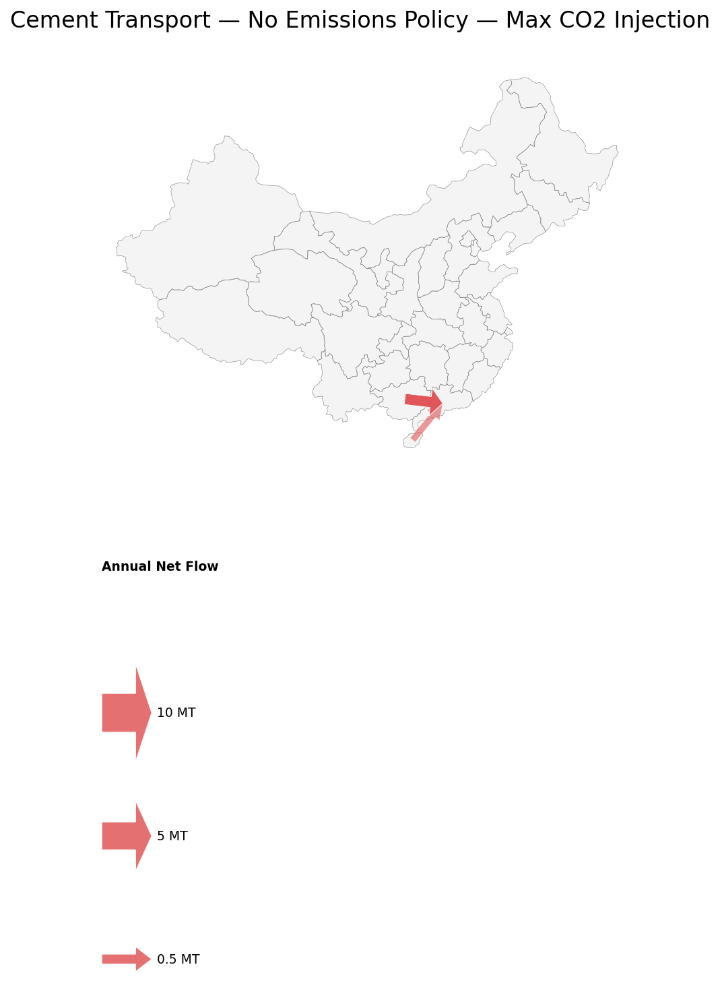

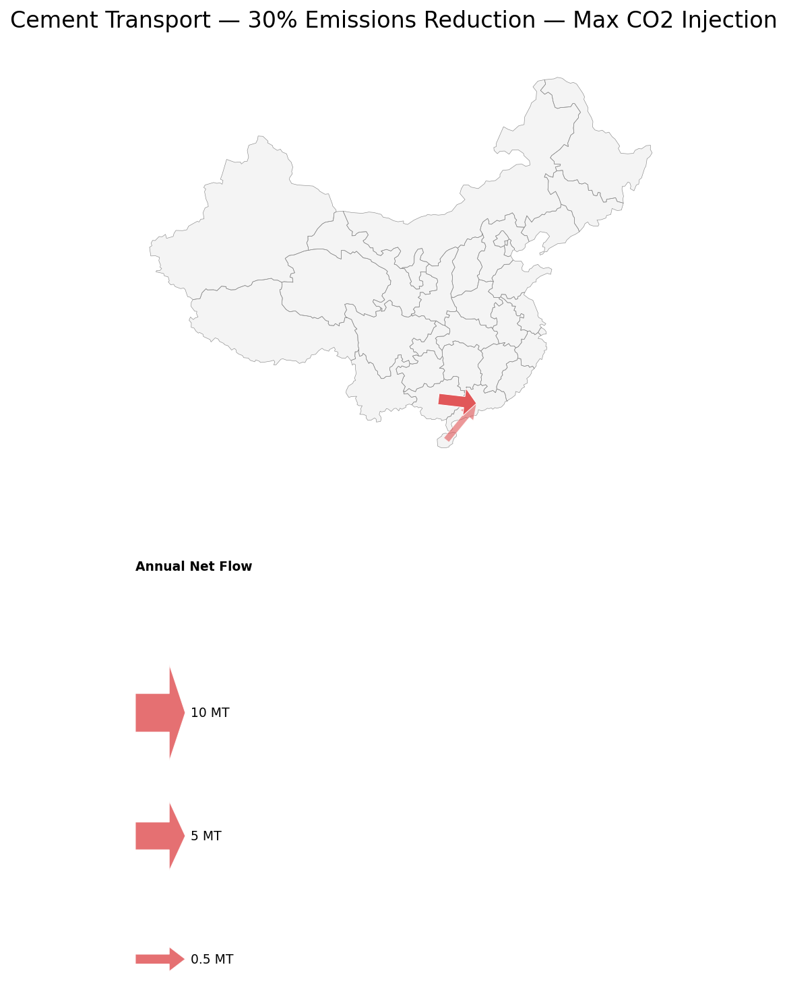

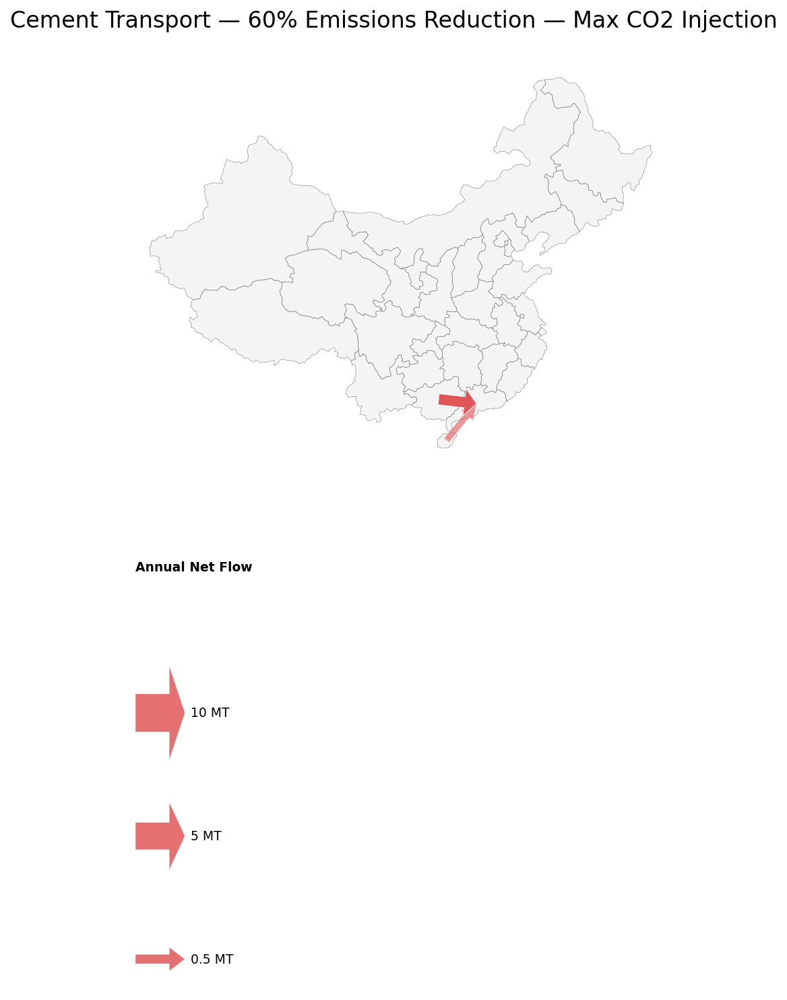

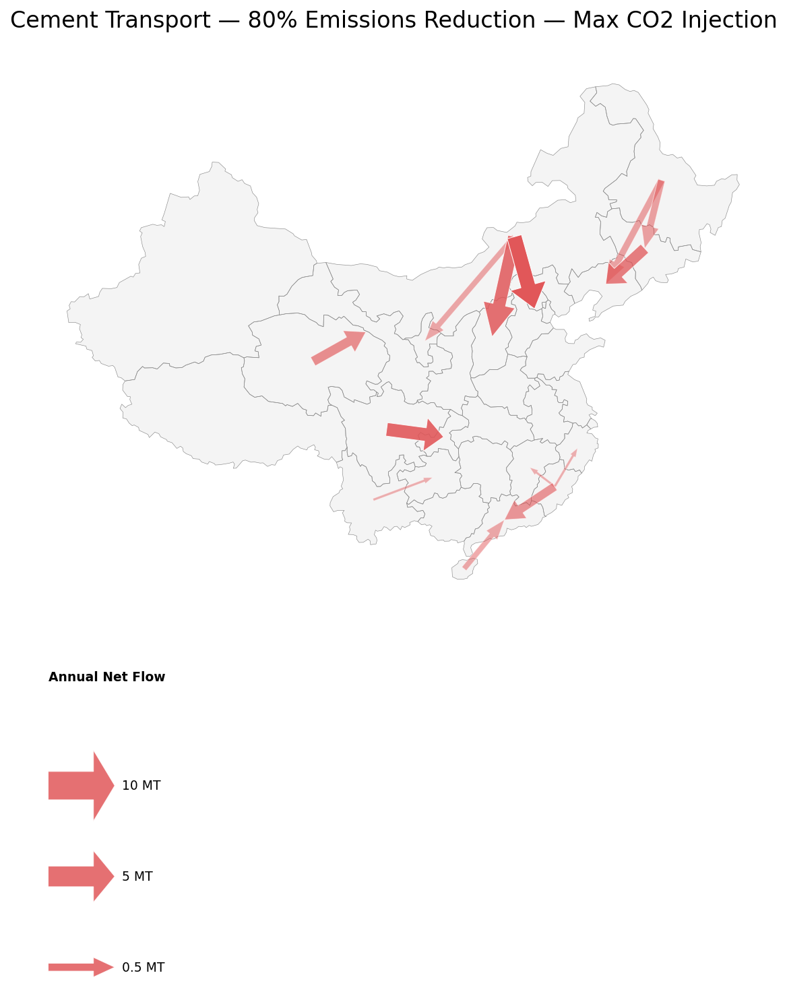

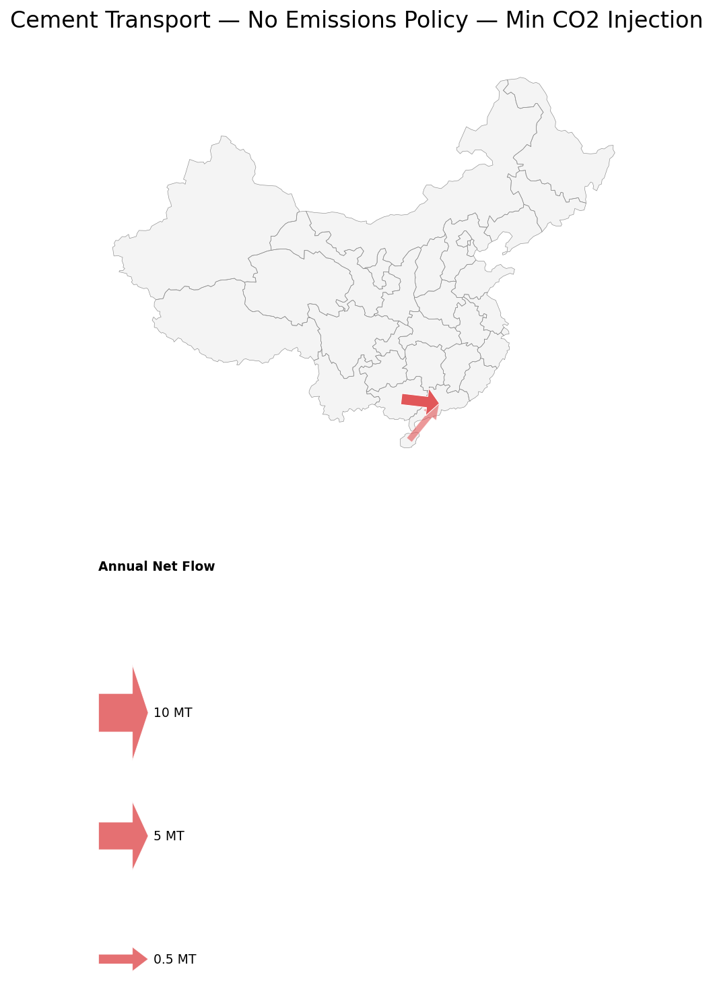

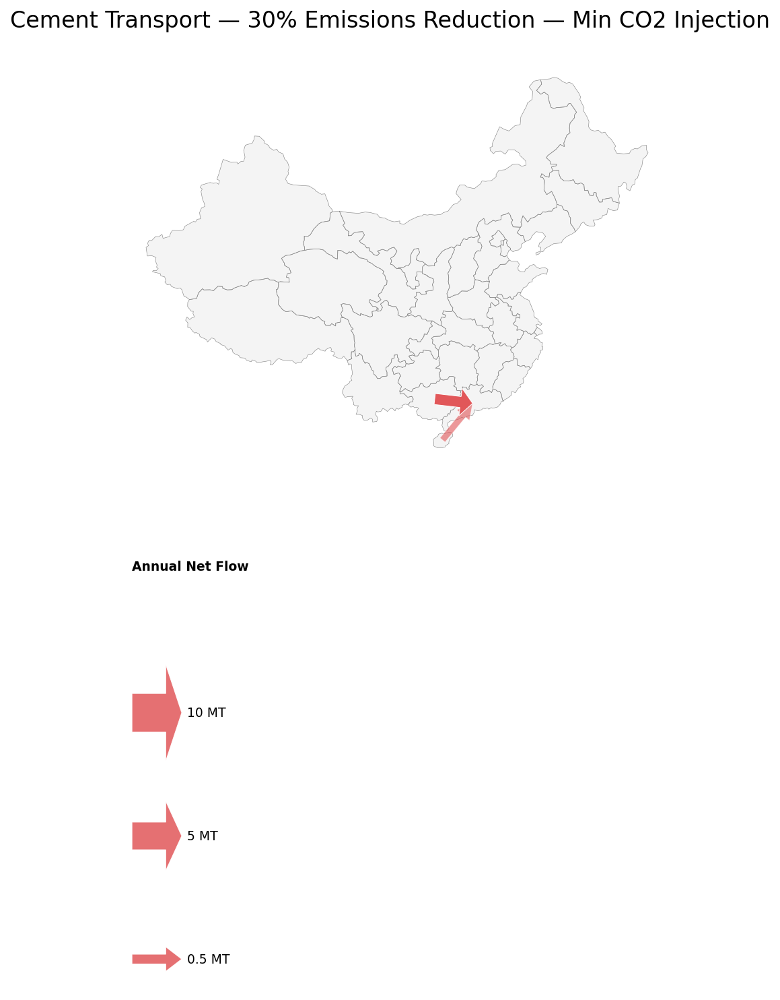

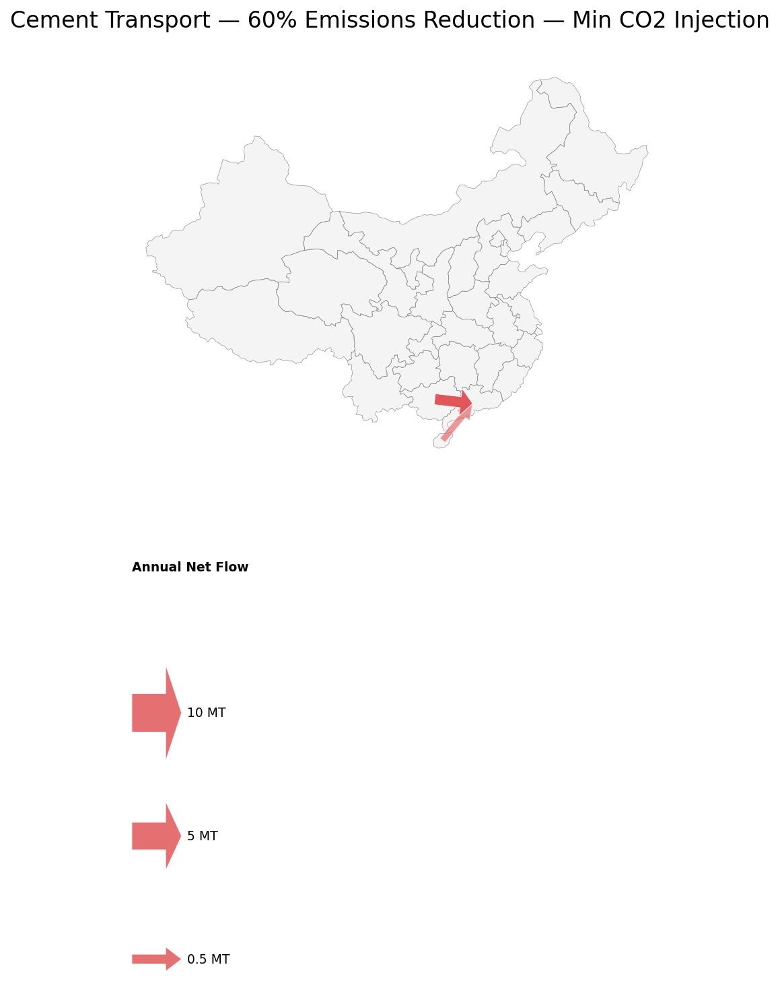

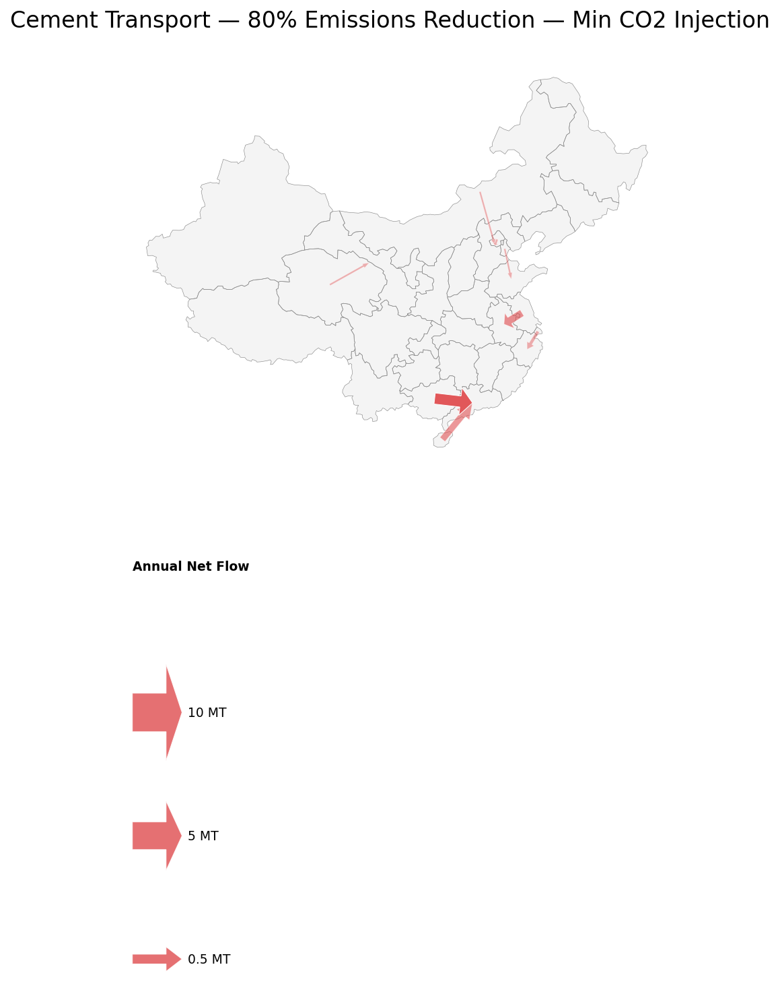

In [536]:
# Cement transport — both injection scenarios
for inj in injection_scenarios:
    inj_label = injection_label_map[inj]
    for case in cases:
        plot_transport_flows(
            flows_df=all_flow_dfs[inj][case],
            transport_prefix="cement_transport",
            gdf_input=gdf,
            title=f"Cement Transport — {scenario_map[case]} — {inj_label}",
            color="#e15759",
            figsize=(12, 10),
            legend_sizes=[0.5, 5, 10],
            unit_label="MT",
            flow_scale=1e6,
            flow_threshold=0.001,
        )

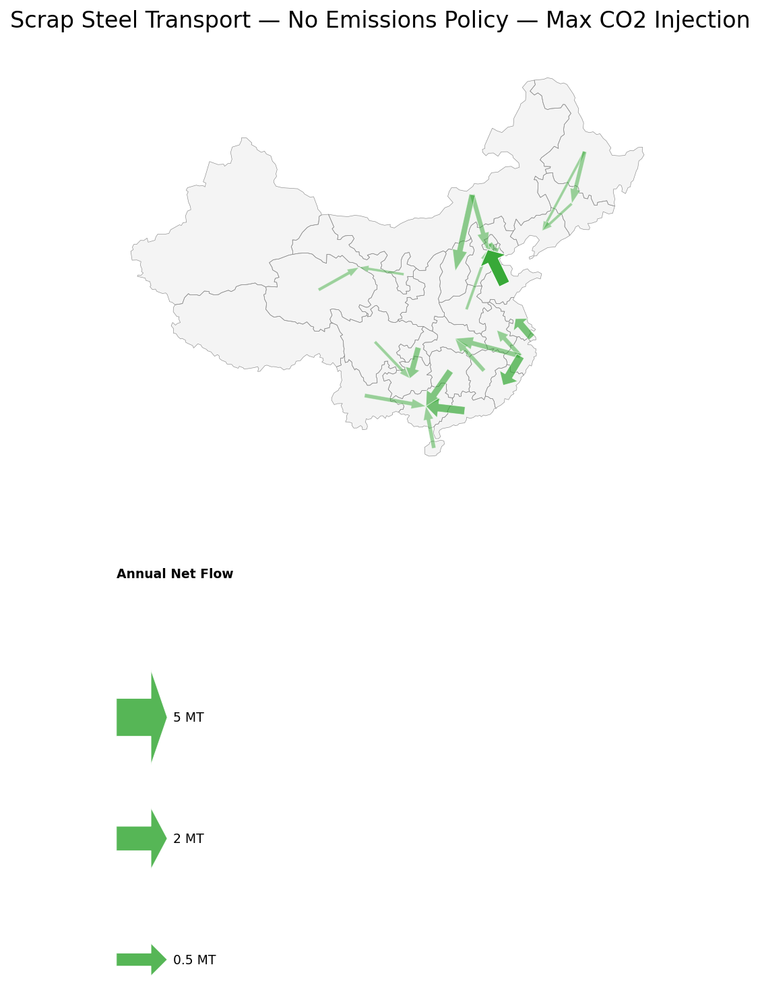

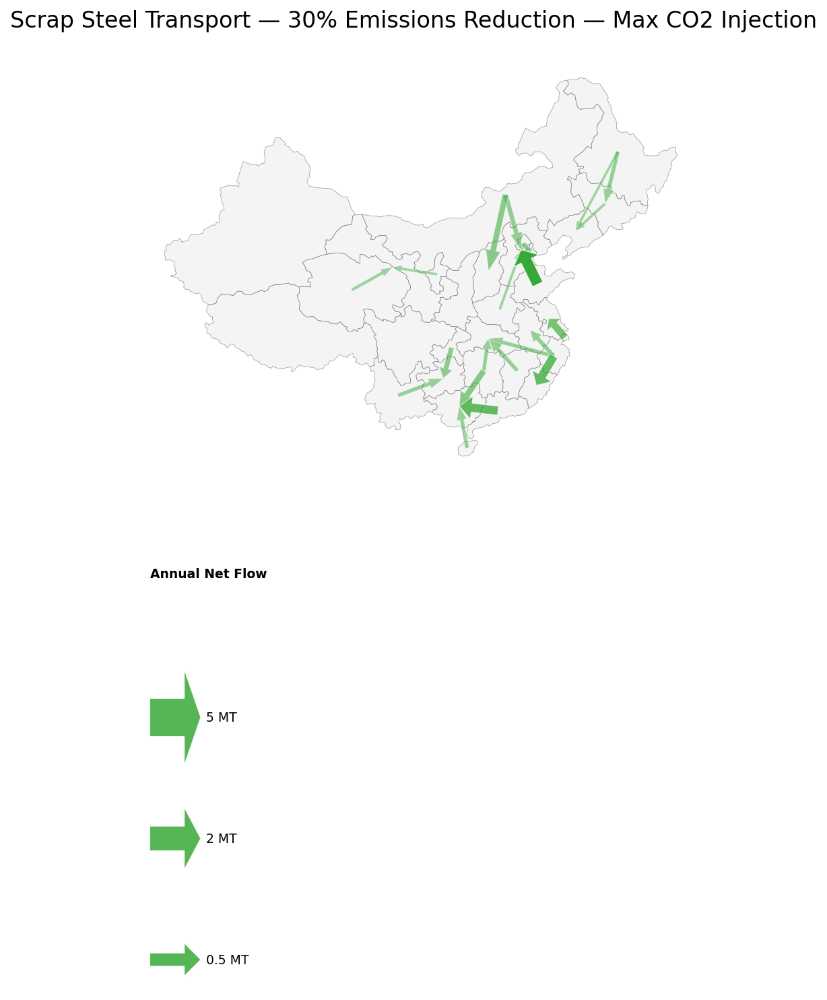

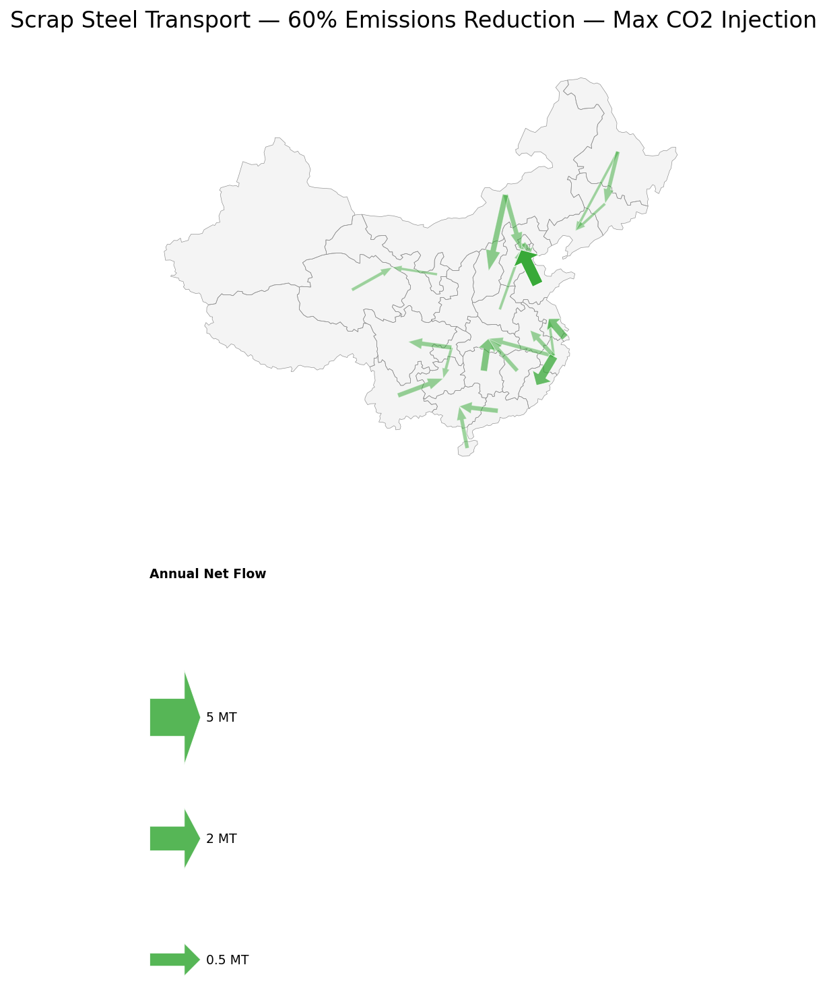

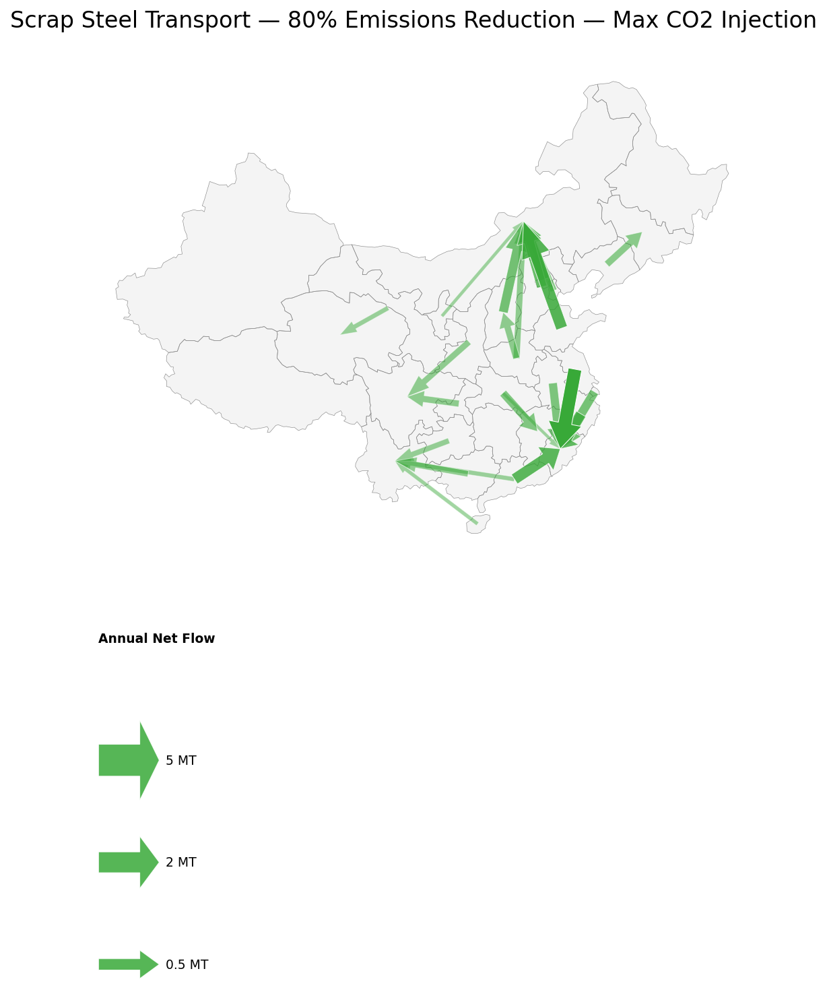

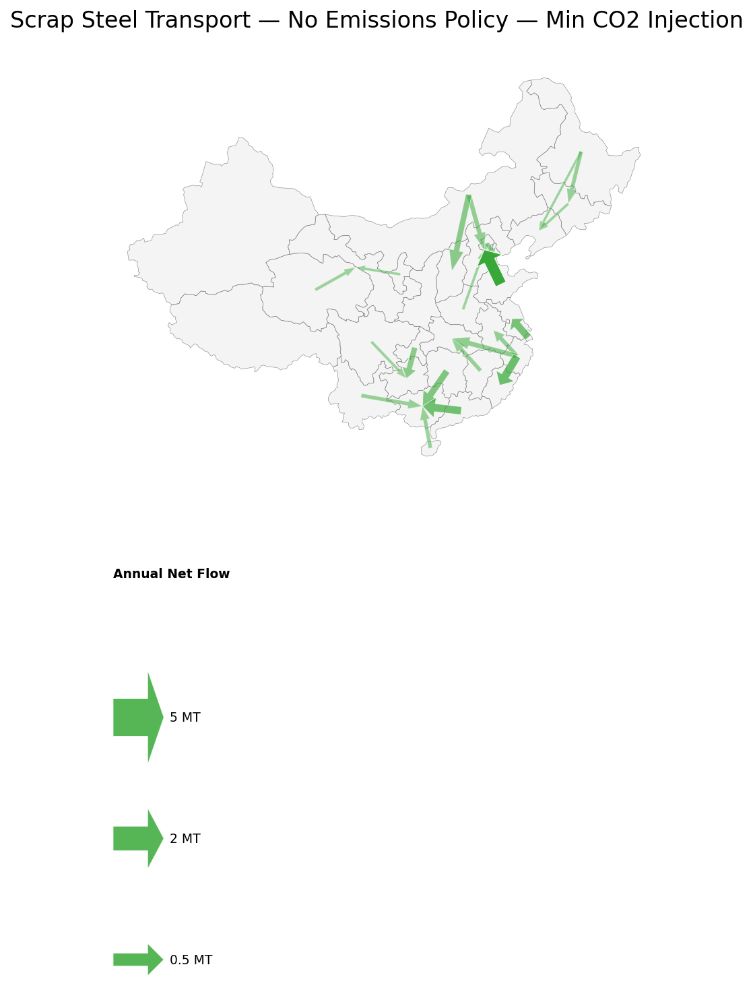

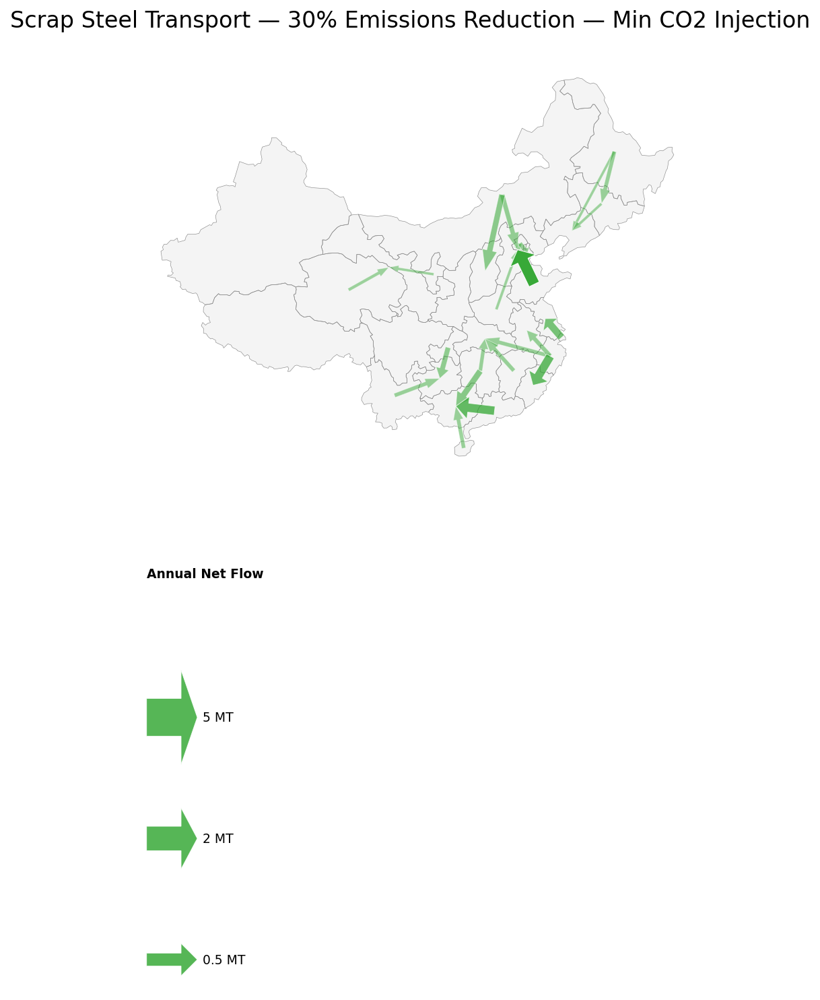

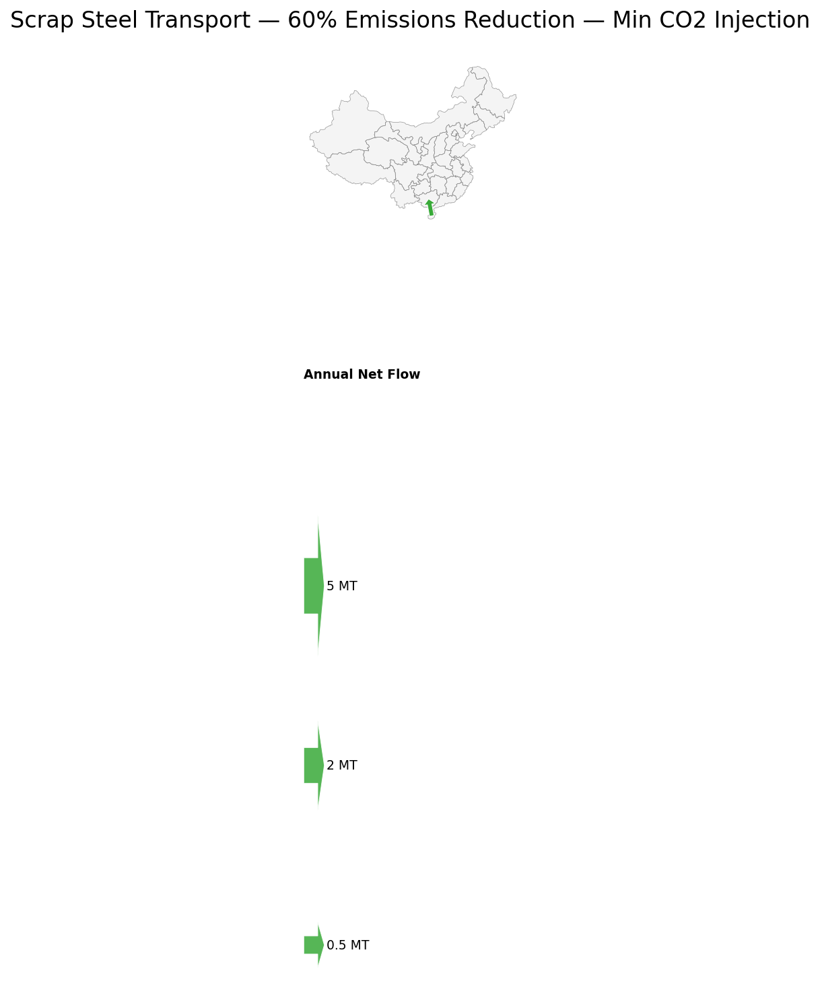

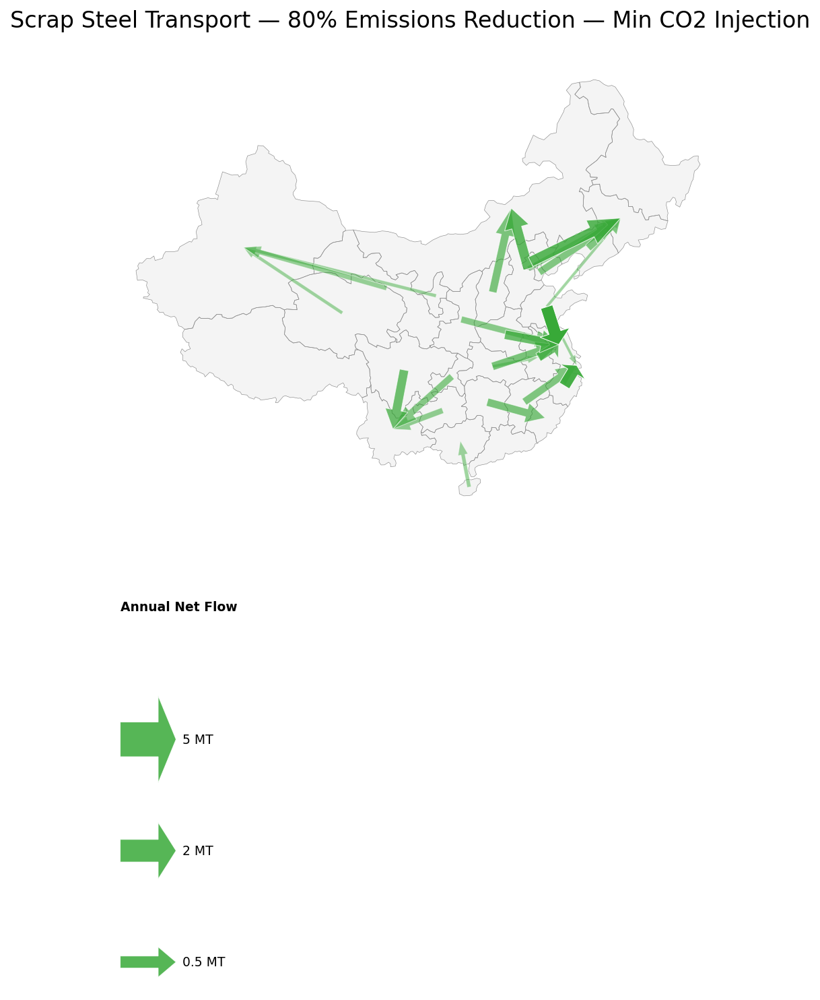

In [537]:
# Scrap steel transport — both injection scenarios
for inj in injection_scenarios:
    inj_label = injection_label_map[inj]
    for case in cases:
        plot_transport_flows(
            flows_df=all_flow_dfs[inj][case],
            transport_prefix="steelscrap_transport",
            gdf_input=gdf,
            title=f"Scrap Steel Transport — {scenario_map[case]} — {inj_label}",
            color="#38a938",
            figsize=(12, 10),
            legend_sizes=[0.5, 2, 5],
            unit_label="MT",
            flow_scale=1e6,
            flow_threshold=0.005,
        )

No net flows above threshold.
No net flows above threshold.
No net flows above threshold.


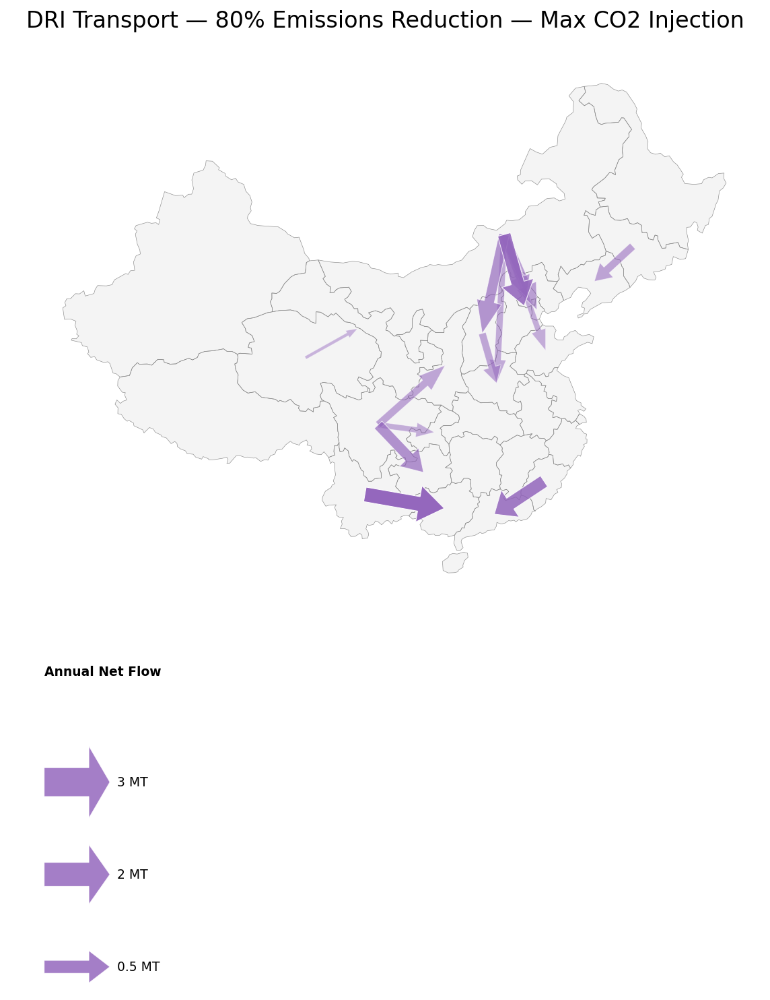

No net flows above threshold.
No net flows above threshold.
No net flows above threshold.


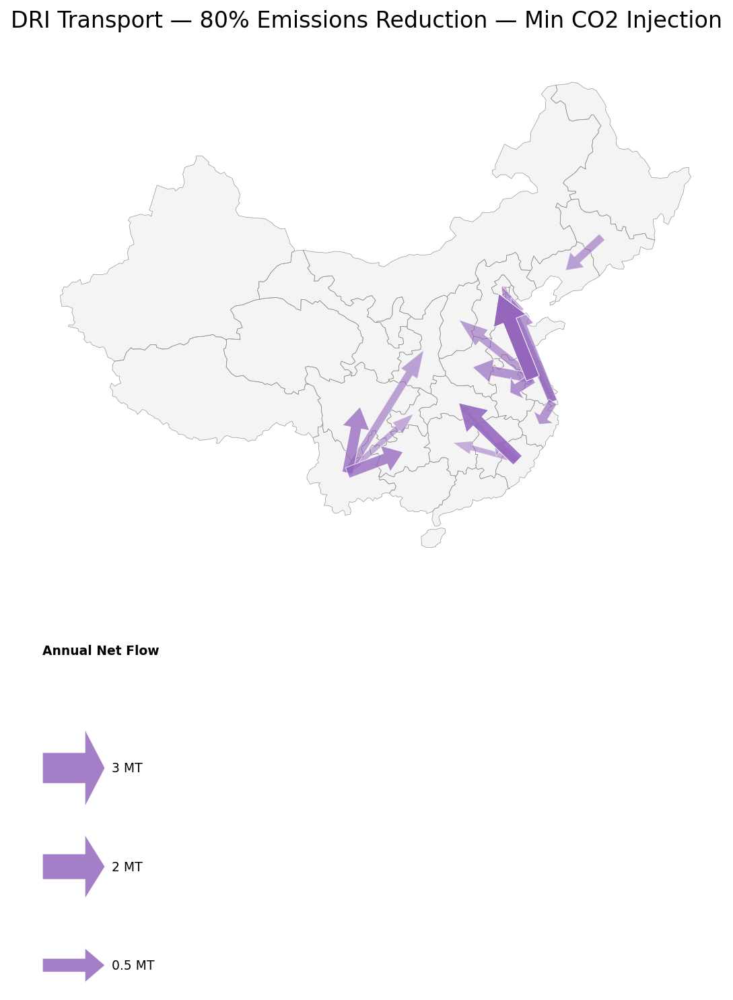

In [538]:
# DRI transport — both injection scenarios
for inj in injection_scenarios:
    inj_label = injection_label_map[inj]
    for case in cases:
        plot_transport_flows(
            flows_df=all_flow_dfs[inj][case],
            transport_prefix="dri_transport",
            gdf_input=gdf,
            title=f"DRI Transport — {scenario_map[case]} — {inj_label}",
            color="#9467bd",
            figsize=(12, 10),
            legend_sizes=[0.5, 2, 3],
            unit_label="MT",
            flow_scale=1e6,
            flow_threshold=0.005,
        )

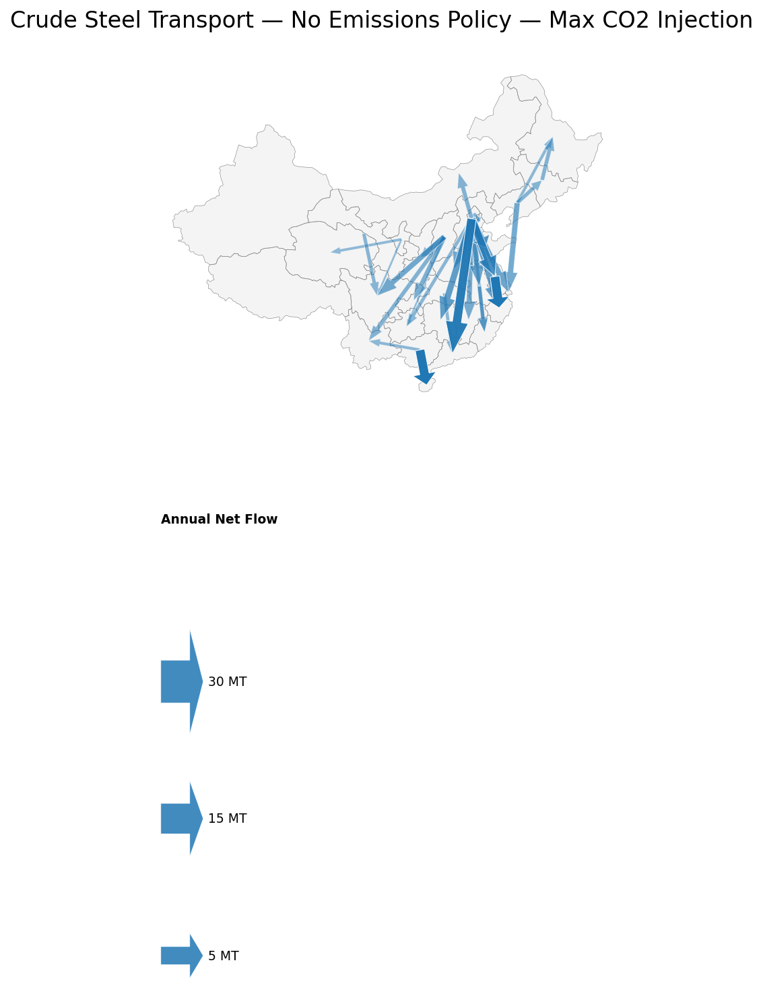

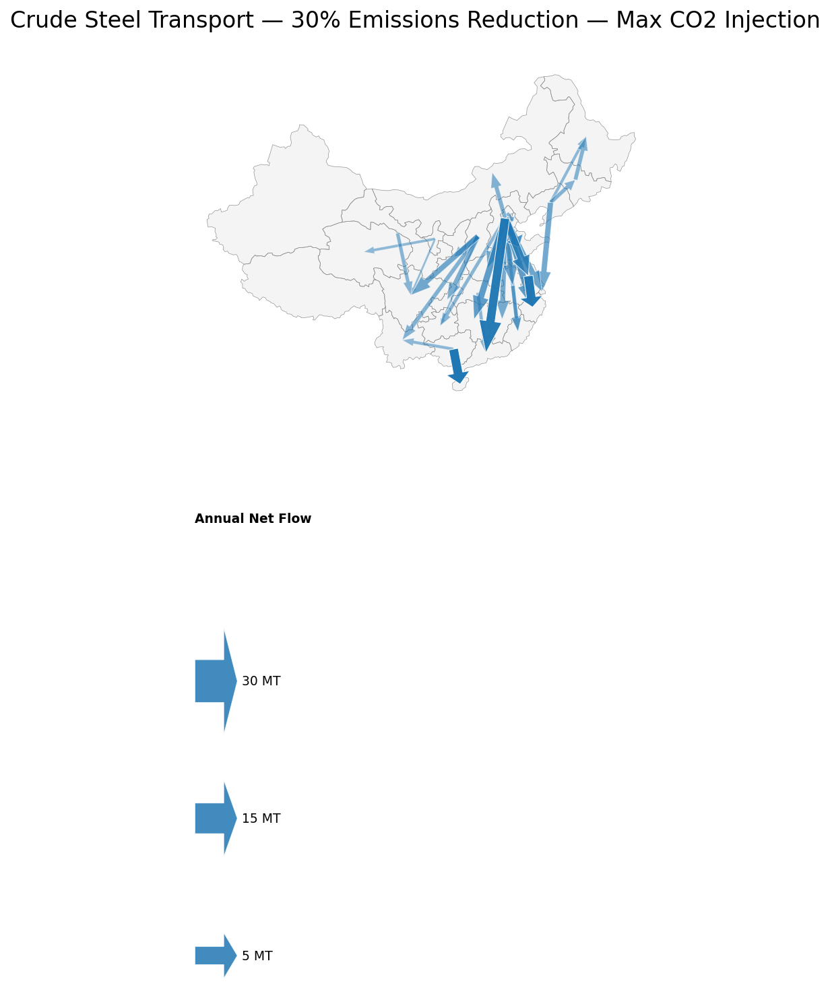

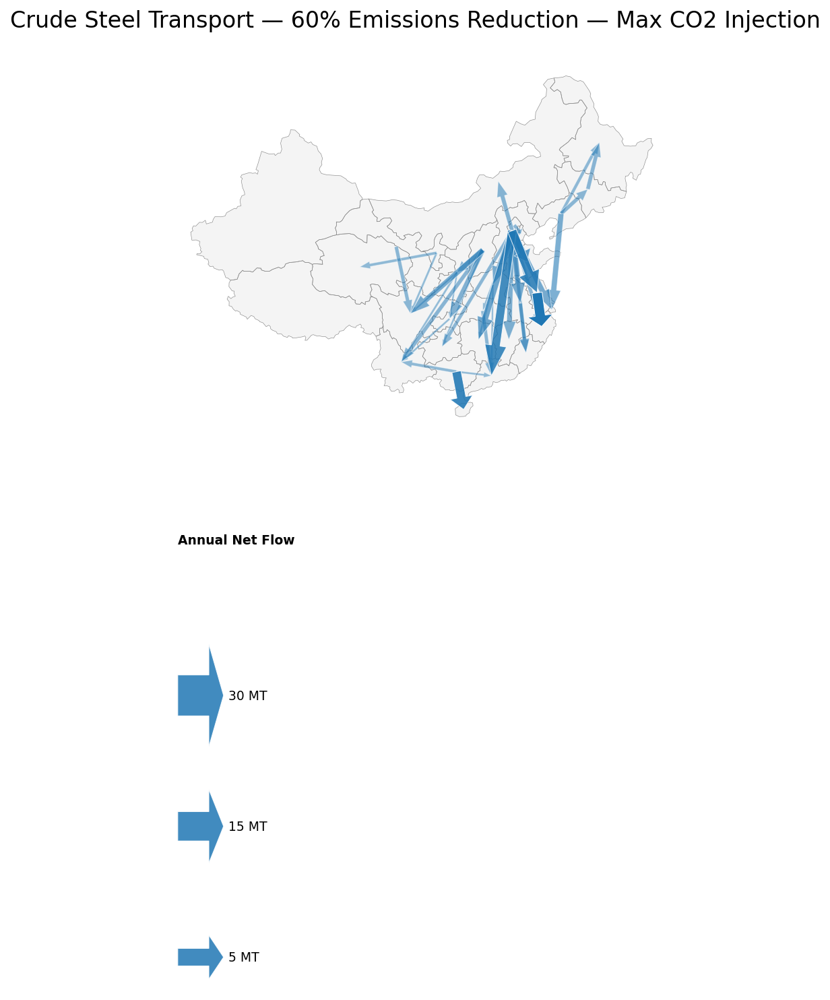

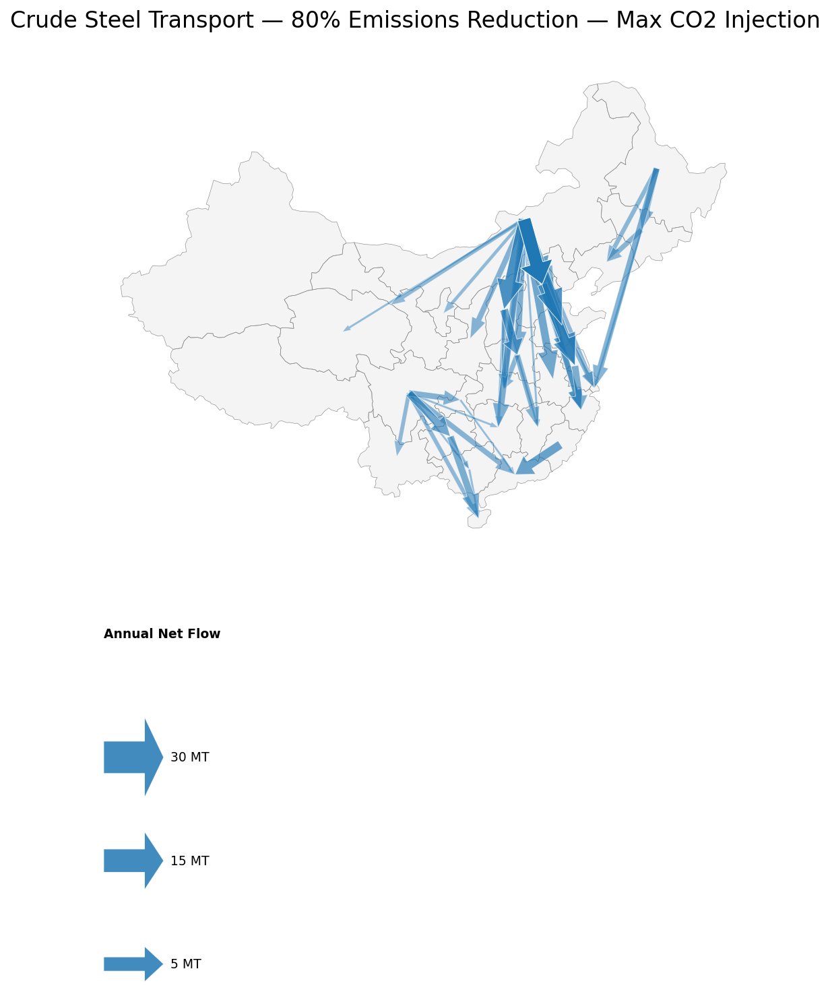

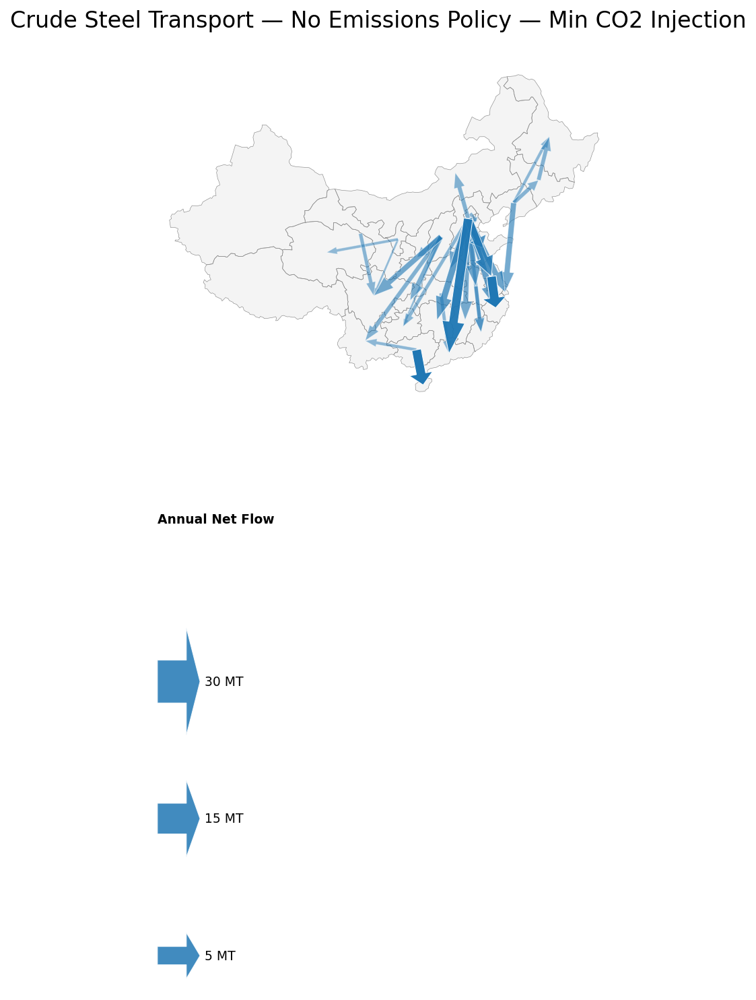

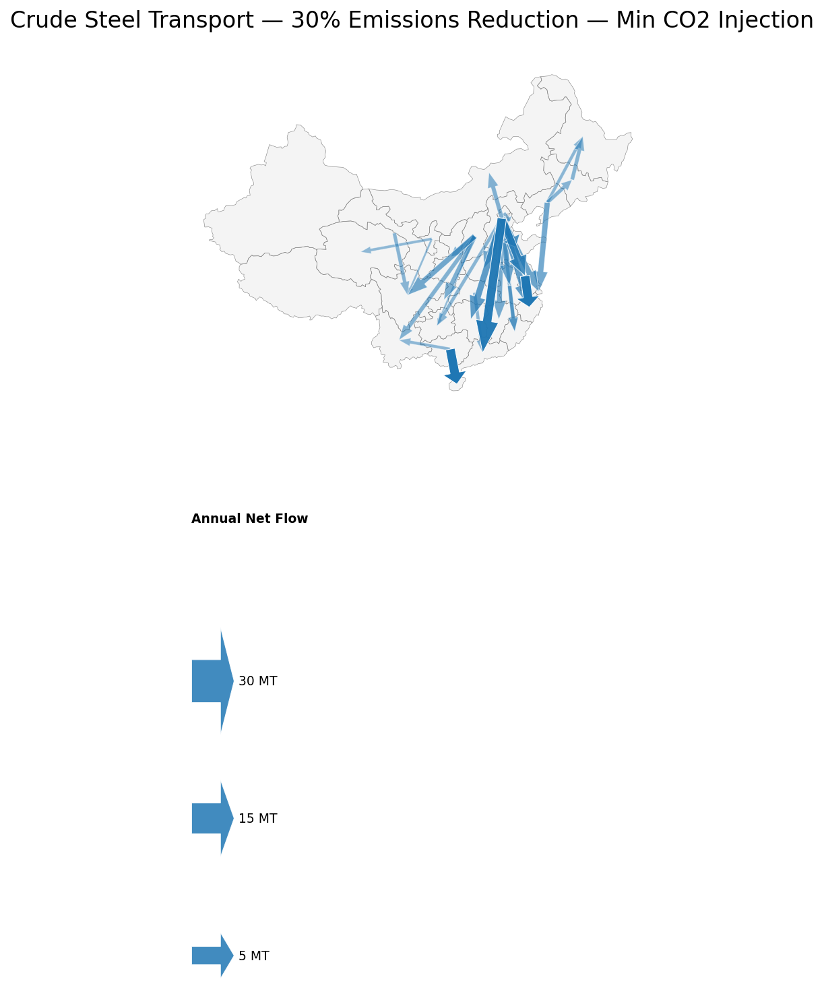

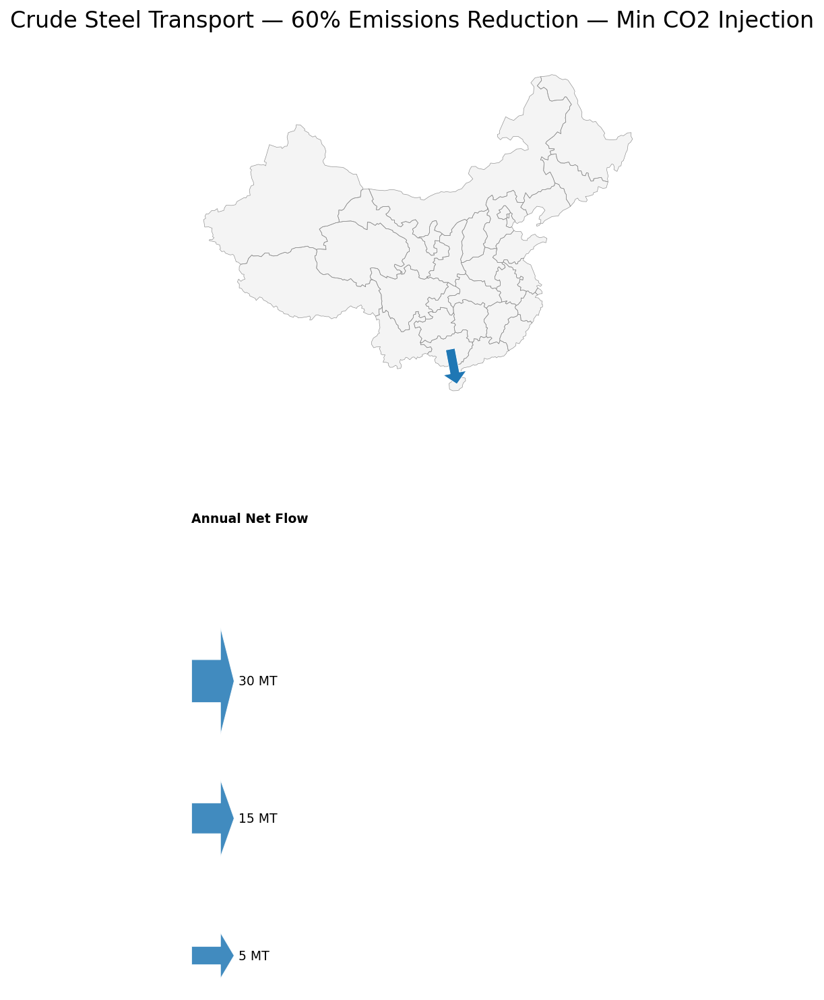

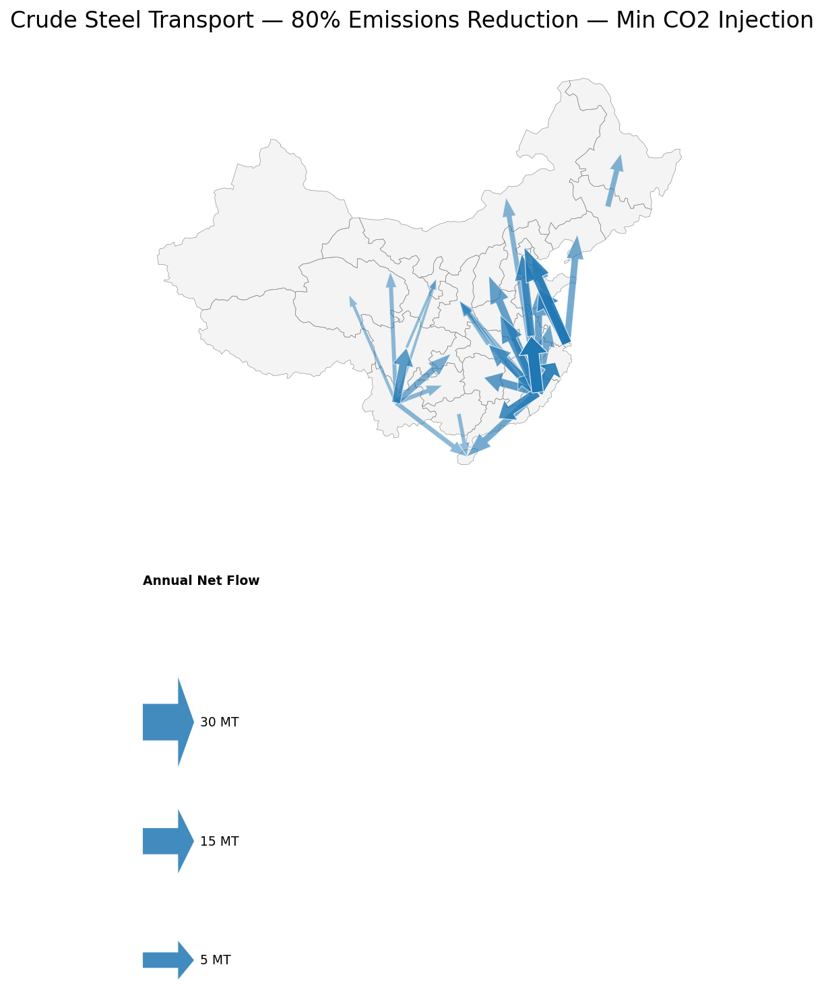

In [539]:
# Crude steel transport — both injection scenarios
for inj in injection_scenarios:
    inj_label = injection_label_map[inj]
    for case in cases:
        plot_transport_flows(
            flows_df=all_flow_dfs[inj][case],
            transport_prefix="crudesteel_transport",
            gdf_input=gdf,
            title=f"Crude Steel Transport — {scenario_map[case]} — {inj_label}",
            color="#1f77b4",
            figsize=(12, 10),
            legend_sizes=[5, 15, 30],
            unit_label="MT",
            flow_scale=1e6,
            flow_threshold=0.005,
        )

# CO2 Pipeline Transport

In [540]:
from pyproj import Transformer

BASIN_COORDS = {
    "Songliao":        (124.2489, 45.5424),
    "TurpanHami":      (91.8474,  42.7741),
    "Subei":           (120.2968, 33.2802),
    "BohaiOnshore":    (117.027,  38.1531),
    "Qaidam":          (94.0675,  37.4565),
    "Nanxiang":        (112.3891, 32.6284),
    "Sanjiang":        (132.0,    47.0   ),
    "Hailar":          (118.5403, 48.9011),
    "Jianghan":        (112.9206, 30.4742),
    "Tarim":           (82.2819,  39.3991),
    "Ordos":           (108.7178, 37.5548),
    "YingenEjina":     (101.5,    41.5   ),
    "Hehuai":          (115.0,    34.0   ),
    "Qinshui":         (112.4531, 36.7143),
    "Erlian":          (115.3402, 44.1892),
    "Junggar":         (87.0998,  44.9779),
    "SichuanBasin":    (105.9742, 30.357 ),
    "BohaiOffshore":   (119.7405, 39.0081),
    "NorthYellowSea":  (123.3029, 38.3492),
    "SouthYellowSea":  (123.0614, 35.6424),
    "EastChinaSea":    (124.815,  29.2425),
    "PearlRiverMouth": (114.5827, 20.6148),
    "BeibugGulf":      (109.1529, 20.3578),
    "Qiongdongnan":    (110.6,    17.9   ),
}

def plot_co2_transport_flows(
    flows_df,
    gdf_input,
    province_col="NAME_1",
    title="CO2 Transport Flows",
    color="#4a5568",
    figsize=(13, 11),
    dpi=150,
    flow_threshold=0.1,
    max_shaft_width=80_000,
    min_shaft_width=8_000,
    head_width_ratio=2.5,
    legend_sizes=None,
    unit_label="MT",
    flow_scale=1e6,
):
    transformer = Transformer.from_crs("epsg:4326", "epsg:3857", always_xy=True)
    basin_xy = {name: transformer.transform(lon, lat) for name, (lon, lat) in BASIN_COORDS.items()}

    col_pat = re.compile(r"^Region\d+(\w+)_to_(\w+)_CO2_Pipeline_transmission_edge$")
    flows = {}
    for col in flows_df.columns:
        m = col_pat.match(col)
        if m:
            province, basin = m.group(1), m.group(2)
            val = flows_df[col].sum() / flow_scale  # convert to display units (MT)
            if val > flow_threshold:
                flows[(province, basin)] = flows.get((province, basin), 0) + val

    if not flows:
        print("No CO2 transport flows found above threshold.")
        return

    gdf = gdf_input.copy().to_crs(epsg=3857)
    gdf["centroid"] = gdf.geometry.centroid
    centroid_map = dict(zip(gdf[province_col], zip(gdf.centroid.x, gdf.centroid.y)))

    max_flow = max(flows.values())

    def shaft_w(flow):
        frac = (flow / max_flow) ** 0.5
        return min_shaft_width + frac * (max_shaft_width - min_shaft_width)

    fig, ax = plt.subplots(figsize=figsize, dpi=dpi)
    ax.set_axis_off()
    gdf.plot(ax=ax, color="#F4F4F4", edgecolor="none", zorder=0)
    gdf.boundary.plot(ax=ax, linewidth=0.3, color="#888888", zorder=1)

    for (province, basin), flow in sorted(flows.items(), key=lambda x: x[1]):
        if province not in centroid_map or basin not in basin_xy:
            continue
        x0, y0 = centroid_map[province]
        x1, y1 = basin_xy[basin]
        dx, dy  = x1 - x0, y1 - y0
        dist    = np.hypot(dx, dy)
        sw = shaft_w(flow)
        hw = sw * head_width_ratio
        hl = min(dist * 0.30, hw * 1.4)
        alpha = 0.30 + 0.70 * (flow / max_flow)
        ax.arrow(x0, y0, dx, dy,
                 width=sw, head_width=hw, head_length=hl,
                 length_includes_head=True,
                 fc=color, ec="white", linewidth=0.4,
                 alpha=alpha, zorder=5)

    for name, (bx, by) in basin_xy.items():
        ax.plot(bx, by, "v", color="#e15759", markersize=6, zorder=10, clip_on=False)
        ax.text(bx, by + 50_000, name, fontsize=6, ha="center", va="bottom", zorder=11, clip_on=False)

    plt.title(title, fontsize=16, pad=12)

    if legend_sizes is None:
        legend_sizes = _nice_legend_sizes(max_flow)

    xlim = ax.get_xlim(); ylim = ax.get_ylim()
    pw = xlim[1] - xlim[0]
    arrow_len = pw * 0.09
    lx = xlim[0] + pw * 0.02
    max_legend_sw = shaft_w(max(legend_sizes))
    gap = max_legend_sw * 0.8

    # Expand ylim downward to place legend below the map, never overlapping it
    n_rows = len(legend_sizes) + 1
    strip_height = gap + n_rows * max_legend_sw * 3.2
    ax.set_ylim(ylim[0] - strip_height, ylim[1])
    ylim = ax.get_ylim()
    ly = ylim[0] + gap

    for size in sorted(legend_sizes):
        sw = shaft_w(size)
        hw = sw * head_width_ratio
        hl = min(arrow_len * 0.32, hw * 1.4)
        ax.arrow(lx, ly, arrow_len, 0,
                 width=sw, head_width=hw, head_length=hl,
                 length_includes_head=True,
                 fc=color, ec="white", linewidth=0.5, alpha=0.85, zorder=10)
        ax.text(lx + arrow_len + pw * 0.01, ly,
                f"{size:g} {unit_label}", va="center", ha="left", fontsize=9, zorder=11)
        ly += max_legend_sw * 3.2

    ax.text(lx, ly + max_legend_sw * 0.5, "Annual Flow",
            fontsize=9, fontweight="bold", zorder=11)

    plt.tight_layout()
    plt.show()
    plt.close()

No CO2 transport flows found above threshold.
No CO2 transport flows found above threshold.


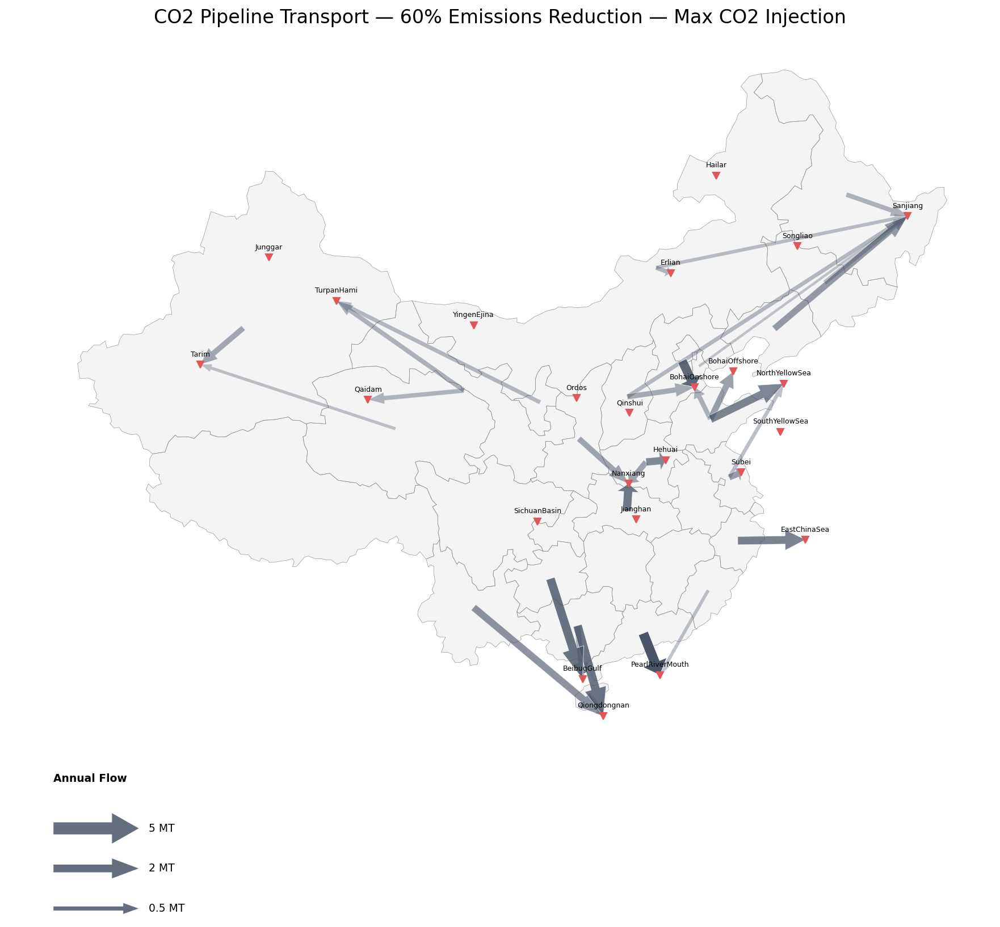

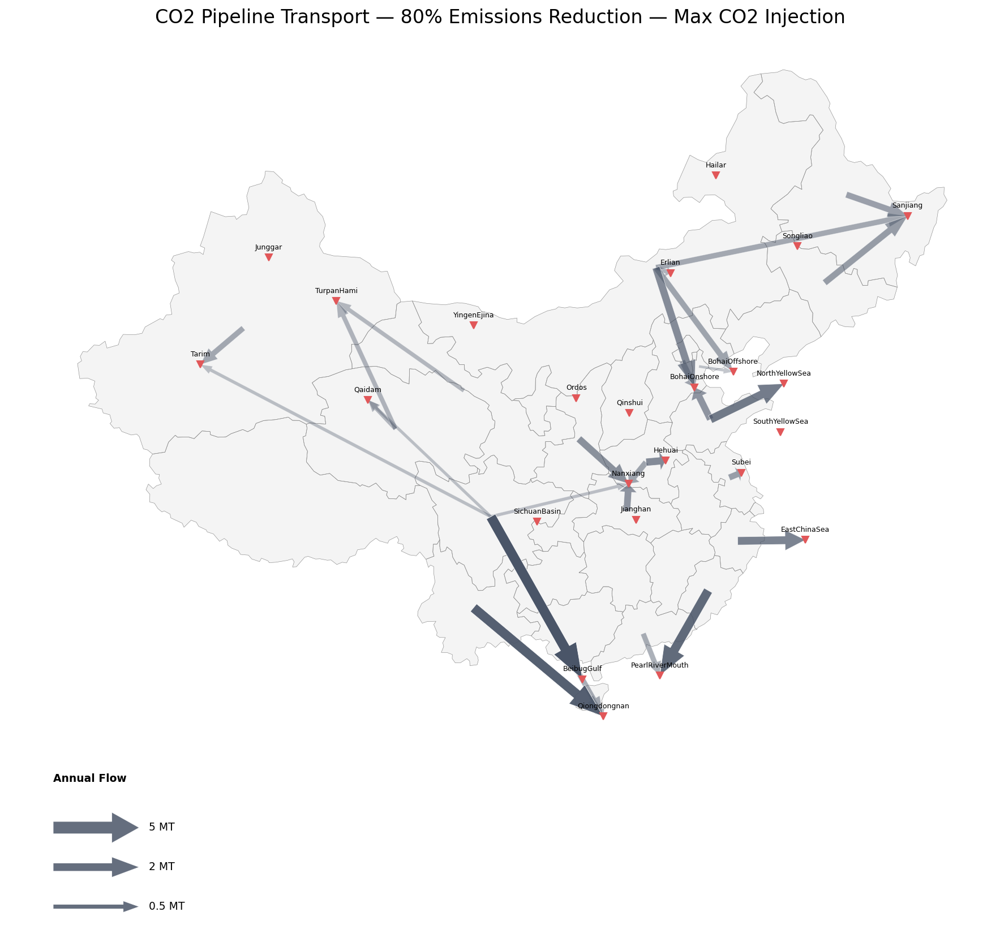

No CO2 transport flows found above threshold.
No CO2 transport flows found above threshold.


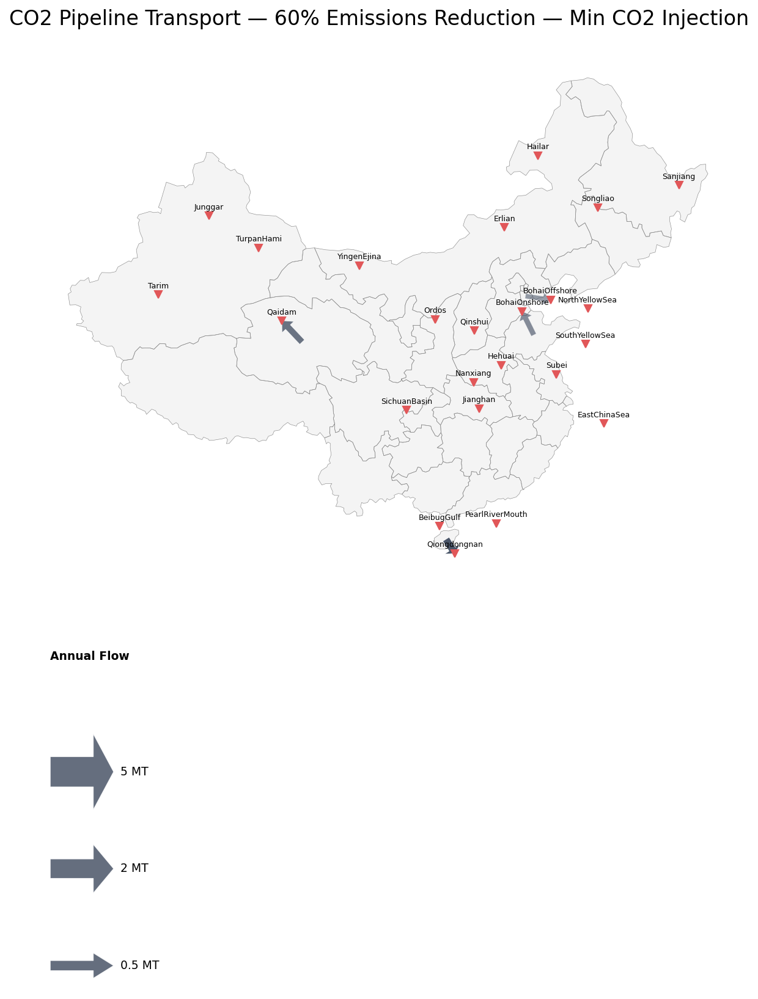

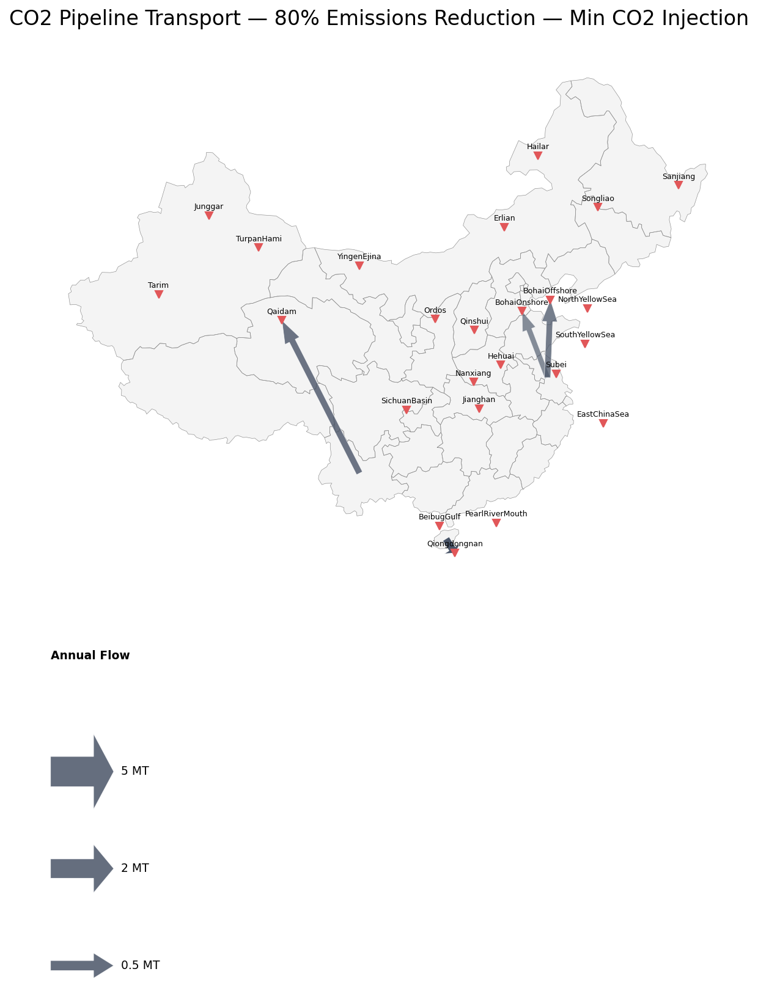

In [541]:
# CO2 pipeline transport — both injection scenarios
for inj in injection_scenarios:
    inj_label = injection_label_map[inj]
    for case in cases:
        plot_co2_transport_flows(
            flows_df=all_flow_dfs[inj][case],
            gdf_input=gdf,
            title=f"CO2 Pipeline Transport — {scenario_map[case]} — {inj_label}",
            color="#4a5568",
            figsize=(13, 11),
            legend_sizes=[0.5, 2, 5],
            unit_label="MT",
            flow_scale=1e6,
            flow_threshold=0.1,
        )

In [542]:
# ── Sector lookup tables ────────────────────────────────────────────────────
_sector_capacity_dfs = {
    "electricity": all_elec_dfs,
    "steel":       all_steel_dfs,
    "cement":      all_cement_dfs,
    "aluminum":    all_aluminum_dfs,
    "dri":         all_dri_dfs,
}
_sector_units = {
    "electricity": "MW",
    "steel":       "MT / year",
    "cement":      "MT / year",
    "aluminum":    "MT / year",
    "dri":         "MT / year",
}

def plot_capacity_with_flows(
    gdf,
    capacity_df,
    flows_df,
    transport_prefix,
    capacity_colors=None,
    pie_scale=1.0,
    figsize=(14, 10),
    dpi=150,
    title="",
    capacity_legend_sizes=None,
    capacity_unit="MW",
    max_total_override=None,
    transport_color="#1f77b4",
    flow_threshold=0.005,
    max_shaft_width=150_000,
    min_shaft_width=20_000,
    head_width_ratio=2.5,
    transport_legend_sizes=None,
    transport_unit_label="MT",
    transport_flow_scale=1e6,
):
    """Plot sector capacity pies and transport flows on the same map."""
    fig, ax = plt.subplots(figsize=figsize, dpi=dpi)

    plot_province_pies(
        gdf, capacity_df,
        colors=capacity_colors,
        pie_scale=pie_scale,
        legend_sizes=capacity_legend_sizes,
        capacity_unit=capacity_unit,
        max_total_override=max_total_override,
        ax=ax,
    )

    plot_transport_flows(
        flows_df=flows_df,
        transport_prefix=transport_prefix,
        gdf_input=gdf,
        color=transport_color,
        flow_threshold=flow_threshold,
        max_shaft_width=max_shaft_width,
        min_shaft_width=min_shaft_width,
        head_width_ratio=head_width_ratio,
        legend_sizes=transport_legend_sizes,
        unit_label=transport_unit_label,
        flow_scale=transport_flow_scale,
        ax=ax,
        draw_basemap=False,
        legend_x_anchor="right",
    )

    plt.title(title, fontsize=18)
    plt.tight_layout()
    plt.show()
    plt.close()

# Capacity + Transport Flow Overlay

In [543]:
# ── Configuration — edit these values ──────────────────────────────────────

# CO2 injection scenario: "max_co2_injection" or "min_co2_injection"
plot_inj  = "max_co2_injection"

# Emissions case: "noemissionscap", "30pct", "60pct", "80pct"
plot_case = "80pct"

# Capacity sector: "electricity", "steel", "cement", "aluminum", "dri"
plot_sector = "steel"

# Transport commodity:
#   "crudesteel_transport"   — crude steel
#   "steelscrap_transport"   — scrap steel
#   "dri_transport"          — DRI
#   "cement_transport"       — cement
plot_transport_prefix = "crudesteel_transport"

# Transport display options
plot_transport_color = "#1f77b4"
plot_transport_unit  = "MT"
plot_flow_threshold  = 0.005

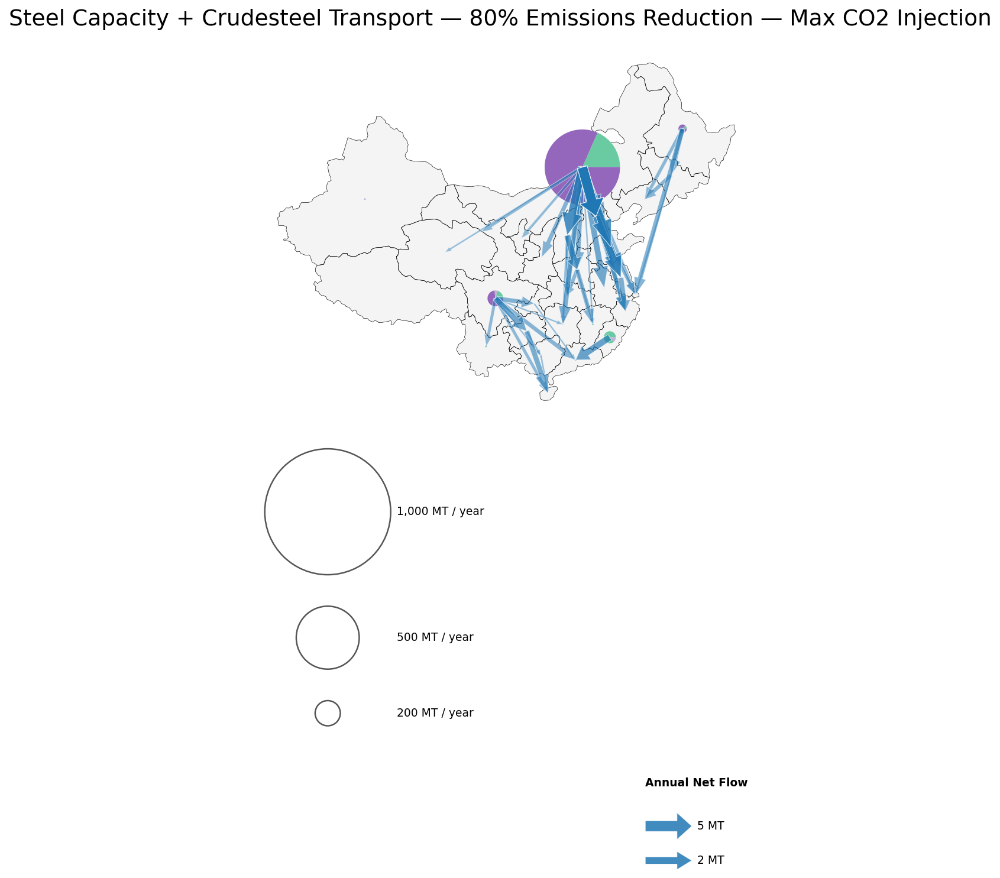

In [559]:
plot_sector = "steel"
plot_transport_prefix = "crudesteel_transport"

capacity_df = _sector_capacity_dfs[plot_sector][plot_inj][plot_case]

# Sector-wide max across all scenarios for consistent circle scaling
sector_max = max(
    _sector_capacity_dfs[plot_sector][inj][c].sum(axis=1).max()
    for inj in injection_scenarios
    for c in cases
)
sector_max = max(sector_max, 1)

plot_capacity_with_flows(
    gdf=gdf,
    capacity_df=capacity_df,
    flows_df=all_flow_dfs[plot_inj][plot_case],
    transport_prefix=plot_transport_prefix,
    capacity_colors=custom_color_map,
    pie_scale=7,
    figsize=(14, 10),
    title=(
        f"{plot_sector.title()} Capacity + "
        f"{plot_transport_prefix.replace('_', ' ').title()} — "
        f"{scenario_map[plot_case]} — {injection_label_map[plot_inj]}"
    ),
    capacity_legend_sizes=_nice_legend_sizes(sector_max),
    capacity_unit=_sector_units[plot_sector],
    max_total_override=sector_max,
    transport_color=plot_transport_color,
    transport_unit_label=plot_transport_unit,
    flow_threshold=plot_flow_threshold,
)

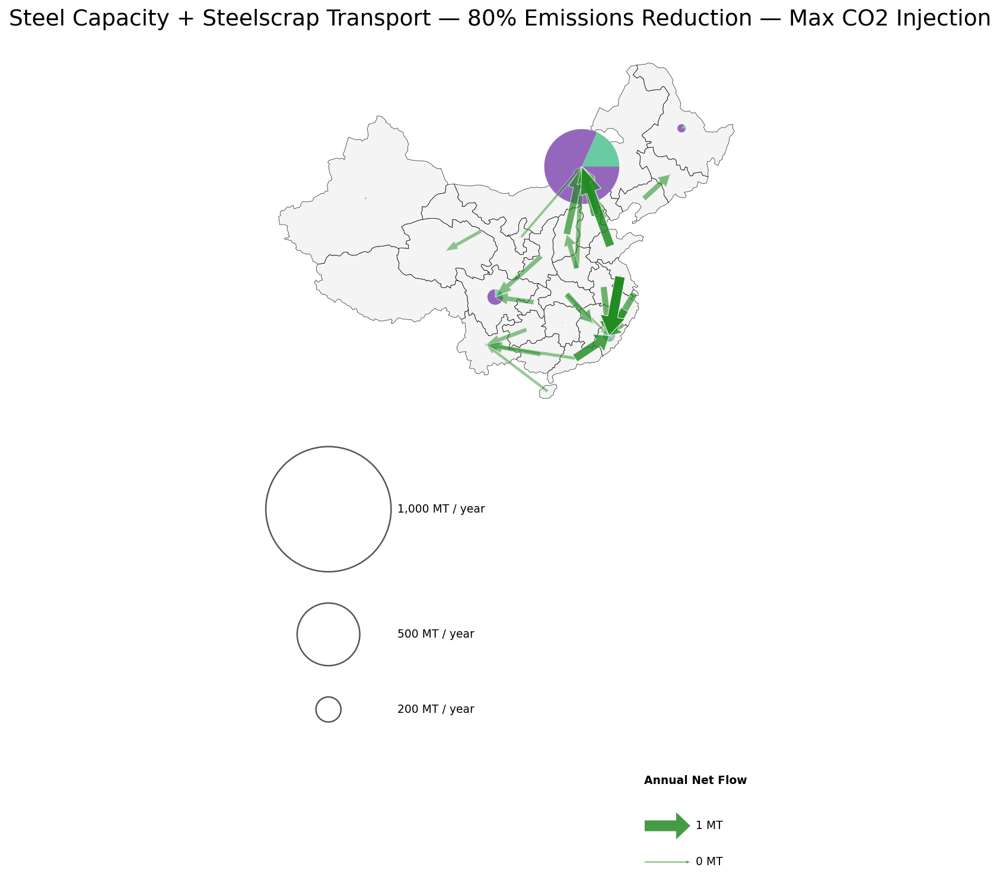

In [558]:
plot_sector = "steel"
plot_transport_prefix = "steelscrap_transport"

capacity_df = _sector_capacity_dfs[plot_sector][plot_inj][plot_case]

# Sector-wide max across all scenarios for consistent circle scaling
sector_max = max(
    _sector_capacity_dfs[plot_sector][inj][c].sum(axis=1).max()
    for inj in injection_scenarios
    for c in cases
)
sector_max = max(sector_max, 1)

plot_capacity_with_flows(
    gdf=gdf,
    capacity_df=capacity_df,
    flows_df=all_flow_dfs[plot_inj][plot_case],
    transport_prefix=plot_transport_prefix,
    capacity_colors=custom_color_map,
    pie_scale=7,
    figsize=(14, 10),
    title=(
        f"{plot_sector.title()} Capacity + "
        f"{plot_transport_prefix.replace('_', ' ').title()} — "
        f"{scenario_map[plot_case]} — {injection_label_map[plot_inj]}"
    ),
    capacity_legend_sizes=_nice_legend_sizes(sector_max),
    capacity_unit=_sector_units[plot_sector],
    max_total_override=sector_max,
    transport_color="forestgreen",
    transport_unit_label=plot_transport_unit,
    flow_threshold=plot_flow_threshold,
)

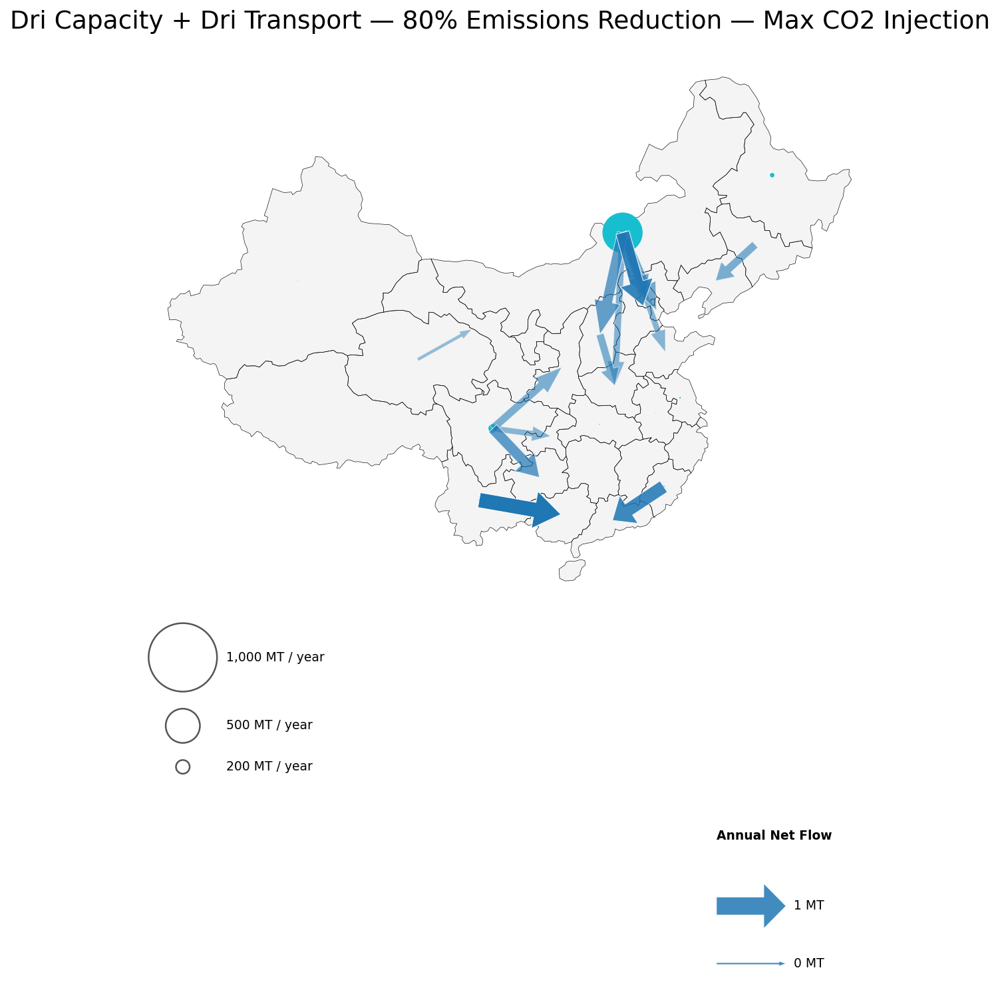

In [546]:
plot_sector = "dri"
plot_transport_prefix = "dri_transport"

capacity_df = _sector_capacity_dfs[plot_sector][plot_inj][plot_case]

# Sector-wide max across all scenarios for consistent circle scaling
sector_max = max(
    _sector_capacity_dfs[plot_sector][inj][c].sum(axis=1).max()
    for inj in injection_scenarios
    for c in cases
)
sector_max = max(sector_max, 1)

plot_capacity_with_flows(
    gdf=gdf,
    capacity_df=capacity_df,
    flows_df=all_flow_dfs[plot_inj][plot_case],
    transport_prefix=plot_transport_prefix,
    capacity_colors=custom_color_map,
    pie_scale=2.5,
    figsize=(14, 10),
    title=(
        f"{plot_sector.title()} Capacity + "
        f"{plot_transport_prefix.replace('_', ' ').title()} — "
        f"{scenario_map[plot_case]} — {injection_label_map[plot_inj]}"
    ),
    capacity_legend_sizes=_nice_legend_sizes(sector_max),
    capacity_unit=_sector_units[plot_sector],
    max_total_override=sector_max,
    transport_color=plot_transport_color,
    transport_unit_label=plot_transport_unit,
    flow_threshold=plot_flow_threshold,
)

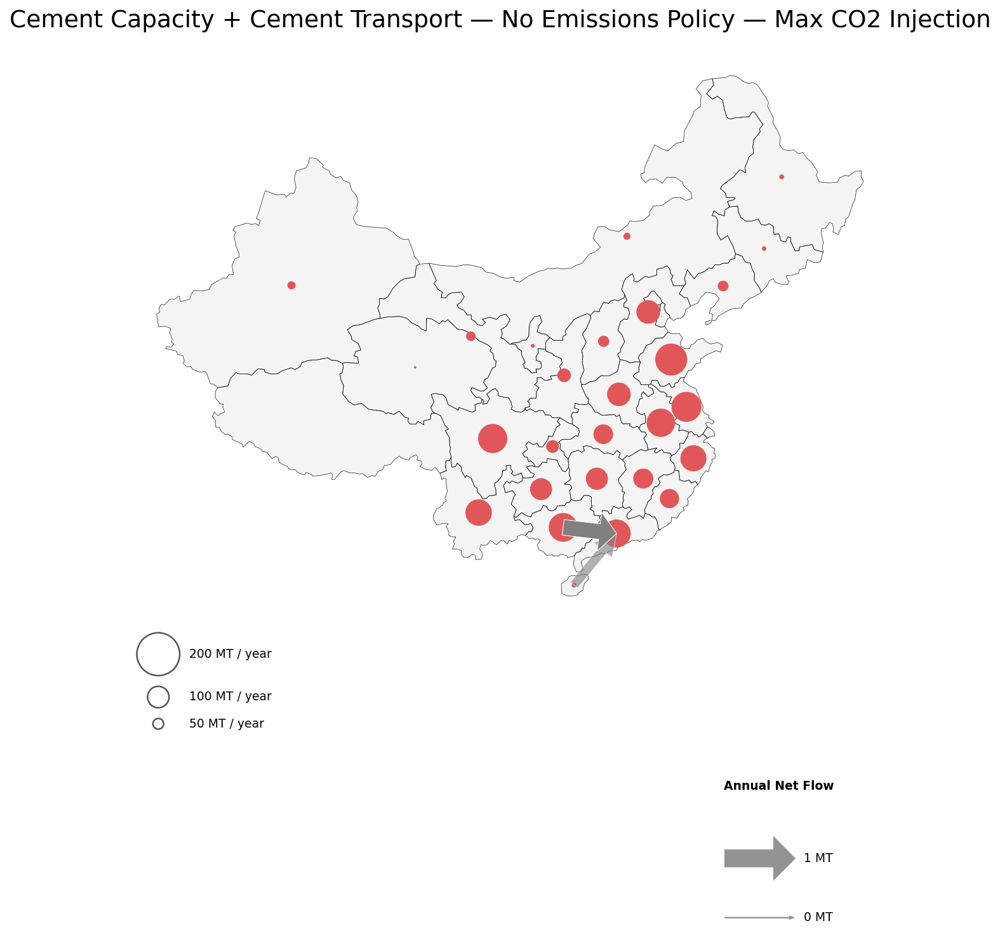

In [550]:
plot_sector = "cement"
plot_transport_prefix = "cement_transport"
plot_case = "noemissionscap"

capacity_df = _sector_capacity_dfs[plot_sector][plot_inj][plot_case]

# Sector-wide max across all scenarios for consistent circle scaling
sector_max = max(
    _sector_capacity_dfs[plot_sector][inj][c].sum(axis=1).max()
    for inj in injection_scenarios
    for c in cases
)
sector_max = max(sector_max, 1)

plot_capacity_with_flows(
    gdf=gdf,
    capacity_df=capacity_df,
    flows_df=all_flow_dfs[plot_inj][plot_case],
    transport_prefix=plot_transport_prefix,
    capacity_colors=custom_color_map,
    pie_scale=2.5,
    figsize=(14, 10),
    title=(
        f"{plot_sector.title()} Capacity + "
        f"{plot_transport_prefix.replace('_', ' ').title()} — "
        f"{scenario_map[plot_case]} — {injection_label_map[plot_inj]}"
    ),
    capacity_legend_sizes=_nice_legend_sizes(sector_max),
    capacity_unit=_sector_units[plot_sector],
    max_total_override=sector_max,
    transport_color="gray",
    transport_unit_label=plot_transport_unit,
    flow_threshold=plot_flow_threshold,
)

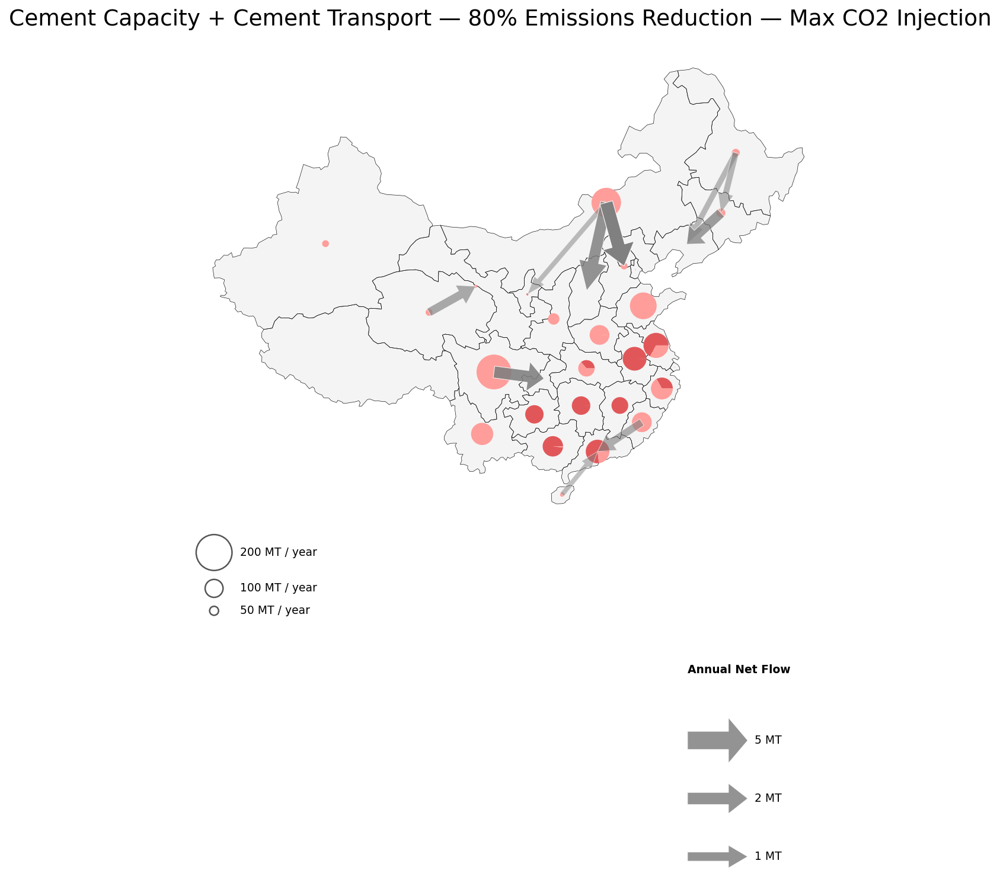

In [552]:
plot_sector = "cement"
plot_transport_prefix = "cement_transport"
plot_case = "80pct"

capacity_df = _sector_capacity_dfs[plot_sector][plot_inj][plot_case]

# Sector-wide max across all scenarios for consistent circle scaling
sector_max = max(
    _sector_capacity_dfs[plot_sector][inj][c].sum(axis=1).max()
    for inj in injection_scenarios
    for c in cases
)
sector_max = max(sector_max, 1)

plot_capacity_with_flows(
    gdf=gdf,
    capacity_df=capacity_df,
    flows_df=all_flow_dfs[plot_inj][plot_case],
    transport_prefix=plot_transport_prefix,
    capacity_colors=custom_color_map,
    pie_scale=2.5,
    figsize=(14, 10),
    title=(
        f"{plot_sector.title()} Capacity + "
        f"{plot_transport_prefix.replace('_', ' ').title()} — "
        f"{scenario_map[plot_case]} — {injection_label_map[plot_inj]}"
    ),
    capacity_legend_sizes=_nice_legend_sizes(sector_max),
    capacity_unit=_sector_units[plot_sector],
    max_total_override=sector_max,
    transport_color="gray",
    transport_unit_label=plot_transport_unit,
    flow_threshold=plot_flow_threshold,
)